In [ ]:

# ============================================================
# MSFNet Dual-Branch v2
# ConvNeXtV2-Tiny + EfficientNetV2-S
# Rice Leaf Disease Classification
# PyTorch 2.6+ / Kaggle T4-P100 friendly
# ============================================================

# =========================
# 0. INSTALL
# =========================
!pip -q install -U timm albumentations torchmetrics scikit-learn seaborn umap-learn thop

# =========================
# 1. IMPORTS
# =========================
import os, gc, json, time, random, warnings, math, zipfile, copy
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.amp import autocast, GradScaler

import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score,
    precision_recall_fscore_support, confusion_matrix,
    roc_auc_score, average_precision_score,
    matthews_corrcoef, cohen_kappa_score,
    roc_curve, precision_recall_curve
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.calibration import calibration_curve

warnings.filterwarnings("ignore")

try:
    import umap
    HAS_UMAP = True
except Exception:
    HAS_UMAP = False

# =========================
# 2. CONFIG
# =========================
CONFIG = {
    "IMG_SIZE": 224,
    "BATCH_SIZE": 16,
    "NUM_WORKERS": 2,
    "EPOCHS": 15,
    "SEED": 42,
    "LR": 3e-4,
    "WEIGHT_DECAY": 1e-4,
    "DROPOUT": 0.30,
    "LABEL_SMOOTHING": 0.10,
    "USE_AMP": True,
    "USE_EMA": True,
    "EMA_DECAY": 0.999,
    "PATIENCE": 5,
    "MIN_DELTA": 1e-4,
    "VAL_RATIO": 0.15,
    "TEST_RATIO": 0.15,
    "NUM_TOKENS": 3,
    "TOKEN_DIM": 256,
    "NUM_HEADS": 8,
}

IMAGE_ROOT = Path(
    "/kaggle/input/datasets/ashikurrahman2/"
    "riceleaf/RiceLeafDiseaseBD/Original images"
)

OUTPUT_DIR = Path("/kaggle/working/MSFNet_DualBranch_Results")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("=" * 70)
print("MSFNet Dual-Branch")
print("=" * 70)
print("Device:", device)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA:", torch.version.cuda)
print("=" * 70)

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    # benchmark=True is faster on fixed 224x224 inputs
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

set_seed(CONFIG["SEED"])

# =========================
# 3. DATASET
# =========================
def build_dataframe(root):
    if not root.exists():
        raise FileNotFoundError(f"Dataset path not found: {root}")

    class_names = sorted(
        [d.name for d in root.iterdir() if d.is_dir()]
    )
    if not class_names:
        raise RuntimeError(f"No class folders found in: {root}")

    class_to_idx = {c: i for i, c in enumerate(class_names)}
    rows = []

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    for cname in class_names:
        for p in (root / cname).rglob("*"):
            if p.is_file() and p.suffix.lower() in valid_ext:
                rows.append({
                    "path": str(p),
                    "label": class_to_idx[cname],
                    "class_name": cname
                })

    df = pd.DataFrame(rows)

    if len(df) == 0:
        raise RuntimeError("No images found.")

    print(f"Total images : {len(df)}")
    print(f"Classes      : {class_names}")
    print(df["class_name"].value_counts())
    return df, class_names, class_to_idx

df, CLASS_NAMES, CLASS_TO_IDX = build_dataframe(IMAGE_ROOT)
NUM_CLASSES = len(CLASS_NAMES)
CONFIG["NUM_CLASSES"] = NUM_CLASSES

# 70 / 15 / 15 stratified split
train_val_df, test_df = train_test_split(
    df,
    test_size=CONFIG["TEST_RATIO"],
    stratify=df["label"],
    random_state=CONFIG["SEED"]
)

val_fraction_inside_trainval = (
    CONFIG["VAL_RATIO"] / (1.0 - CONFIG["TEST_RATIO"])
)

train_df, val_df = train_test_split(
    train_val_df,
    test_size=val_fraction_inside_trainval,
    stratify=train_val_df["label"],
    random_state=CONFIG["SEED"]
)

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print(
    f"Train: {len(train_df)} | "
    f"Val: {len(val_df)} | "
    f"Test: {len(test_df)}"
)

# =========================
# 4. AUGMENTATION
# =========================
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

train_tf = A.Compose([
    A.Resize(CONFIG["IMG_SIZE"], CONFIG["IMG_SIZE"]),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.25),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.08,
        scale_limit=0.12,
        rotate_limit=25,
        p=0.5
    ),
    A.OneOf([
        A.RandomBrightnessContrast(
            brightness_limit=0.20,
            contrast_limit=0.20,
            p=1
        ),
        A.HueSaturationValue(
            hue_shift_limit=15,
            sat_shift_limit=25,
            val_shift_limit=15,
            p=1
        ),
        A.CLAHE(p=1),
    ], p=0.5),
    A.CoarseDropout(
        num_holes_range=(1, 6),
        hole_height_range=(8, 24),
        hole_width_range=(8, 24),
        p=0.25
    ),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(),
])

val_tf = A.Compose([
    A.Resize(CONFIG["IMG_SIZE"], CONFIG["IMG_SIZE"]),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(),
])

class RiceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = cv2.imread(row["path"])
        if img is None:
            raise RuntimeError(f"Could not read image: {row['path']}")

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transform is not None:
            img = self.transform(image=img)["image"]

        return img, int(row["label"])

train_ds = RiceDataset(train_df, train_tf)
val_ds   = RiceDataset(val_df, val_tf)
test_ds  = RiceDataset(test_df, val_tf)

# Class-balanced sampler
counts = Counter(train_df["label"].tolist())
sample_weights = torch.DoubleTensor([
    1.0 / counts[int(y)]
    for y in train_df["label"].tolist()
])

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

loader_kwargs = dict(
    num_workers=CONFIG["NUM_WORKERS"],
    pin_memory=torch.cuda.is_available(),
    persistent_workers=(CONFIG["NUM_WORKERS"] > 0)
)

train_loader = DataLoader(
    train_ds,
    batch_size=CONFIG["BATCH_SIZE"],
    sampler=sampler,
    **loader_kwargs
)

val_loader = DataLoader(
    val_ds,
    batch_size=CONFIG["BATCH_SIZE"],
    shuffle=False,
    **loader_kwargs
)

test_loader = DataLoader(
    test_ds,
    batch_size=CONFIG["BATCH_SIZE"],
    shuffle=False,
    **loader_kwargs
)

# =========================
# 5. MODEL COMPONENTS
# =========================
class CBAM(nn.Module):
    def __init__(self, channels, reduction=16, kernel_size=7):
        super().__init__()

        hidden = max(channels // reduction, 8)

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.mlp = nn.Sequential(
            nn.Conv2d(channels, hidden, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(hidden, channels, 1, bias=False)
        )

        self.spatial = nn.Conv2d(
            2, 1,
            kernel_size=kernel_size,
            padding=kernel_size // 2,
            bias=False
        )

    def forward(self, x):
        ca = torch.sigmoid(
            self.mlp(self.avg_pool(x)) +
            self.mlp(self.max_pool(x))
        )

        x = x * ca

        avg_map = torch.mean(x, dim=1, keepdim=True)
        max_map = torch.max(x, dim=1, keepdim=True)[0]

        sa = torch.cat([avg_map, max_map], dim=1)
        sa = torch.sigmoid(self.spatial(sa))

        return x * sa


class MultiScaleTokenExtractor(nn.Module):
    """
    Generates 3 groups of tokens using 1x1, 2x2 and 3x3
    adaptive spatial pooling.
    """

    def __init__(self, in_ch, token_dim=256, num_tokens=3):
        super().__init__()

        self.num_tokens = num_tokens
        scales = [1, 2, 3]

        self.projs = nn.ModuleList([
            nn.Sequential(
                nn.AdaptiveAvgPool2d(s),
                nn.Flatten(2),
                nn.Conv1d(in_ch, token_dim, 1),
                nn.BatchNorm1d(token_dim),
                nn.GELU()
            )
            for s in scales
        ])

        total_features = token_dim * sum(s * s for s in scales)

        self.fuse = nn.Linear(
            total_features,
            token_dim * num_tokens
        )

        self.norm = nn.LayerNorm(token_dim)

    def forward(self, x):
        tokens = []

        for proj in self.projs:
            t = proj(x)
            tokens.append(t.flatten(1))

        cat = torch.cat(tokens, dim=1)
        out = self.fuse(cat)
        out = out.view(
            x.size(0),
            self.num_tokens,
            -1
        )

        return self.norm(out)


class BidirectionalCrossBranchAttention(nn.Module):
    def __init__(self, dim=256, num_heads=8):
        super().__init__()

        self.attn_ab = nn.MultiheadAttention(
            dim, num_heads, batch_first=True
        )
        self.attn_ba = nn.MultiheadAttention(
            dim, num_heads, batch_first=True
        )

        self.norm_a1 = nn.LayerNorm(dim)
        self.norm_b1 = nn.LayerNorm(dim)

        self.ffn_a = nn.Sequential(
            nn.Linear(dim, dim * 2),
            nn.GELU(),
            nn.Dropout(0.10),
            nn.Linear(dim * 2, dim)
        )

        self.ffn_b = nn.Sequential(
            nn.Linear(dim, dim * 2),
            nn.GELU(),
            nn.Dropout(0.10),
            nn.Linear(dim * 2, dim)
        )

        self.norm_a2 = nn.LayerNorm(dim)
        self.norm_b2 = nn.LayerNorm(dim)

    def forward(self, ta, tb):
        # A attends to B
        a2, _ = self.attn_ab(
            query=ta,
            key=tb,
            value=tb,
            need_weights=False
        )
        ta = self.norm_a1(ta + a2)
        ta = self.norm_a2(ta + self.ffn_a(ta))

        # B attends to updated A
        b2, _ = self.attn_ba(
            query=tb,
            key=ta,
            value=ta,
            need_weights=False
        )
        tb = self.norm_b1(tb + b2)
        tb = self.norm_b2(tb + self.ffn_b(tb))

        return ta, tb


class AdaptiveGatedFusion(nn.Module):
    def __init__(self, dim=256):
        super().__init__()

        self.gate = nn.Sequential(
            nn.Linear(dim * 2, dim),
            nn.GELU(),
            nn.Dropout(0.10),
            nn.Linear(dim, 2)
        )

        self.proj = nn.Sequential(
            nn.Linear(dim, dim),
            nn.LayerNorm(dim),
            nn.GELU()
        )

    def forward(self, fa, fb):
        logits = self.gate(torch.cat([fa, fb], dim=1))
        gates = torch.softmax(logits, dim=1)

        fused = (
            gates[:, 0:1] * fa +
            gates[:, 1:2] * fb
        )

        return self.proj(fused), gates


class BranchEncoder(nn.Module):
    def __init__(
        self,
        model_name,
        token_dim=256,
        num_tokens=3
    ):
        super().__init__()

        self.backbone = timm.create_model(
            model_name,
            pretrained=True,
            features_only=True,
            out_indices=(-1,)
        )

        channels = self.backbone.feature_info.channels()[-1]

        self.cbam = CBAM(channels)
        self.token_ext = MultiScaleTokenExtractor(
            channels,
            token_dim,
            num_tokens
        )

        self.pool = nn.AdaptiveAvgPool2d(1)

        self.proj = nn.Sequential(
            nn.Linear(channels, token_dim),
            nn.LayerNorm(token_dim),
            nn.GELU()
        )

    def forward(self, x):
        feat = self.backbone(x)[0]
        feat = self.cbam(feat)

        tokens = self.token_ext(feat)

        global_vec = self.proj(
            self.pool(feat).flatten(1)
        )

        return tokens, global_vec, feat


class MSFNet_DualBranch(nn.Module):
    """
    Branch A:
        ConvNeXtV2-Tiny + CBAM + Multi-scale tokens

    Branch B:
        EfficientNetV2-S + CBAM + Multi-scale tokens

    Fusion:
        Bidirectional cross-branch attention
        Adaptive gated feature fusion
    """

    def __init__(
        self,
        num_classes,
        token_dim=256,
        num_tokens=3,
        num_heads=8,
        dropout=0.30
    ):
        super().__init__()

        self.branch_a = BranchEncoder(
            "convnextv2_tiny.fcmae_ft_in22k_in1k",
            token_dim,
            num_tokens
        )

        self.branch_b = BranchEncoder(
            "tf_efficientnetv2_s.in21k_ft_in1k",
            token_dim,
            num_tokens
        )

        self.cross_attn = BidirectionalCrossBranchAttention(
            token_dim,
            num_heads
        )

        self.gate_fuse = AdaptiveGatedFusion(token_dim)

        self.head = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(token_dim, token_dim // 2),
            nn.GELU(),
            nn.Dropout(dropout / 2),
            nn.Linear(token_dim // 2, num_classes)
        )

    def forward(
        self,
        x,
        return_gates=False,
        return_features=False
    ):
        ta, ga, fa = self.branch_a(x)
        tb, gb, fb = self.branch_b(x)

        ta, tb = self.cross_attn(ta, tb)

        pa = ta.mean(dim=1) + ga
        pb = tb.mean(dim=1) + gb

        fused, gates = self.gate_fuse(pa, pb)
        logits = self.head(fused)

        if return_gates and return_features:
            return logits, gates, fused

        if return_gates:
            return logits, gates

        if return_features:
            return logits, fused

        return logits


model = MSFNet_DualBranch(
    num_classes=NUM_CLASSES,
    token_dim=CONFIG["TOKEN_DIM"],
    num_tokens=CONFIG["NUM_TOKENS"],
    num_heads=CONFIG["NUM_HEADS"],
    dropout=CONFIG["DROPOUT"]
).to(device)

print(model)

n_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print(f"Trainable parameters: {n_params / 1e6:.2f} M")

# =========================
# 6. EMA
# =========================
class ModelEMA:
    def __init__(self, model, decay=0.999):
        self.ema = copy.deepcopy(model).eval()
        self.decay = decay

        for p in self.ema.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def update(self, model):
        model_state = model.state_dict()
        ema_state = self.ema.state_dict()

        for k, v in ema_state.items():
            source = model_state[k]

            if v.dtype.is_floating_point:
                v.mul_(self.decay).add_(
                    source,
                    alpha=1.0 - self.decay
                )
            else:
                v.copy_(source)

ema = (
    ModelEMA(model, CONFIG["EMA_DECAY"])
    if CONFIG["USE_EMA"]
    else None
)

# =========================
# 7. OPTIMIZER
# =========================
criterion = nn.CrossEntropyLoss(
    label_smoothing=CONFIG["LABEL_SMOOTHING"]
)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=CONFIG["LR"],
    weight_decay=CONFIG["WEIGHT_DECAY"]
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=CONFIG["EPOCHS"],
    eta_min=1e-6
)

scaler = GradScaler(
    "cuda",
    enabled=(CONFIG["USE_AMP"] and torch.cuda.is_available())
)

# =========================
# 8. EVALUATION
# =========================
def evaluate(model_to_eval, loader):
    model_to_eval.eval()

    losses = []
    preds = []
    labels = []
    probs = []

    amp_enabled = (
        CONFIG["USE_AMP"] and
        torch.cuda.is_available()
    )

    with torch.inference_mode():
        for x, y in loader:
            x = x.to(device, non_blocking=True)
            y = y.to(device, non_blocking=True)

            with autocast(
                device_type=device.type,
                enabled=amp_enabled
            ):
                logits = model_to_eval(x)
                loss = criterion(logits, y)

            p = torch.softmax(logits.float(), dim=1)

            losses.append(loss.item())
            preds.extend(
                p.argmax(dim=1).cpu().numpy()
            )
            labels.extend(
                y.cpu().numpy()
            )
            probs.append(
                p.cpu().numpy()
            )

    preds = np.asarray(preds)
    labels = np.asarray(labels)
    probs = np.concatenate(probs, axis=0)

    acc = accuracy_score(labels, preds)
    bacc = balanced_accuracy_score(labels, preds)

    return (
        float(np.mean(losses)),
        float(acc),
        float(bacc),
        preds,
        labels,
        probs
    )

# =========================
# 9. TRAINING
# =========================
history = {
    "train_loss": [],
    "val_loss": [],
    "val_acc": [],
    "val_bacc": [],
    "lr": []
}

best_bacc = -np.inf
patience_count = 0

best_path = OUTPUT_DIR / "MSFNet_DualBranch_best.pth"

print("\n" + "=" * 70)
print("TRAINING START")
print("=" * 70)

for epoch in range(1, CONFIG["EPOCHS"] + 1):

    model.train()
    running_loss = 0.0

    pbar = tqdm(
        train_loader,
        desc=f"Epoch {epoch}/{CONFIG['EPOCHS']}"
    )

    amp_enabled = (
        CONFIG["USE_AMP"] and
        torch.cuda.is_available()
    )

    for x, y in pbar:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with autocast(
            device_type=device.type,
            enabled=amp_enabled
        ):
            logits = model(x)
            loss = criterion(logits, y)

        scaler.scale(loss).backward()

        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            max_norm=1.0
        )

        scaler.step(optimizer)
        scaler.update()

        if ema is not None:
            ema.update(model)

        running_loss += loss.item()
        pbar.set_postfix(
            loss=f"{loss.item():.4f}"
        )

    scheduler.step()

    eval_model = ema.ema if ema is not None else model

    val_loss, val_acc, val_bacc, _, _, _ = evaluate(
        eval_model,
        val_loader
    )

    train_loss = running_loss / len(train_loader)
    current_lr = optimizer.param_groups[0]["lr"]

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)
    history["val_bacc"].append(val_bacc)
    history["lr"].append(current_lr)

    print(
        f"Epoch {epoch:02d} | "
        f"Train Loss {train_loss:.4f} | "
        f"Val Loss {val_loss:.4f} | "
        f"Val Acc {val_acc:.4f} | "
        f"Val BAcc {val_bacc:.4f} | "
        f"LR {current_lr:.2e}"
    )

    if val_bacc > best_bacc + CONFIG["MIN_DELTA"]:

        best_bacc = val_bacc
        patience_count = 0

        best_state = (
            ema.ema.state_dict()
            if ema is not None
            else model.state_dict()
        )

        # IMPORTANT:
        # Save tensors/state_dict + simple metadata only.
        # This avoids PyTorch 2.6+ weights_only checkpoint problems.
        torch.save(
            {
                "model_state_dict": best_state,
                "epoch": epoch,
                "best_bacc": float(best_bacc),
                "class_names": CLASS_NAMES,
                "config": CONFIG
            },
            best_path
        )

        print(
            f"  Saved best checkpoint "
            f"(BAcc={best_bacc:.4f})"
        )

    else:
        patience_count += 1
        print(
            f"  No improvement "
            f"({patience_count}/{CONFIG['PATIENCE']})"
        )

        if patience_count >= CONFIG["PATIENCE"]:
            print("Early stopping.")
            break

# =========================
# 10. LOAD BEST CHECKPOINT
# =========================
if not best_path.exists():
    raise FileNotFoundError(
        f"Best checkpoint was not created: {best_path}"
    )

# FIX FOR YOUR ERROR:
# PyTorch 2.6+ defaults torch.load(..., weights_only=True).
# The checkpoint here is trusted and contains metadata, so
# weights_only=False is explicitly used.
checkpoint = torch.load(
    best_path,
    map_location=device,
    weights_only=False
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)
model.eval()

print(
    f"\nBest Val Balanced Accuracy: "
    f"{checkpoint['best_bacc']:.4f} "
    f"@ epoch {checkpoint['epoch']}"
)

# =========================
# 11. TEST EVALUATION
# =========================
print("\n" + "=" * 70)
print("FULL TEST EVALUATION")
print("=" * 70)

test_loss, test_acc, test_bacc, y_pred, y_true, y_prob = evaluate(
    model,
    test_loader
)

prec_m, rec_m, f1_m, _ = precision_recall_fscore_support(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

prec_w, rec_w, f1_w, _ = precision_recall_fscore_support(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

mcc = matthews_corrcoef(y_true, y_pred)
kappa = cohen_kappa_score(y_true, y_pred)

try:
    roc_auc = roc_auc_score(
        y_true,
        y_prob,
        multi_class="ovr",
        average="macro"
    )
except Exception:
    roc_auc = float("nan")

try:
    pr_auc = average_precision_score(
        np.eye(NUM_CLASSES)[y_true],
        y_prob,
        average="macro"
    )
except Exception:
    pr_auc = float("nan")

cm = confusion_matrix(
    y_true,
    y_pred,
    labels=np.arange(NUM_CLASSES)
)

cm_norm = (
    cm.astype(float) /
    (cm.sum(axis=1, keepdims=True) + 1e-12)
)

metrics_summary = {
    "Accuracy": float(test_acc),
    "Balanced_Accuracy": float(test_bacc),
    "Macro_Precision": float(prec_m),
    "Macro_Recall": float(rec_m),
    "Macro_F1": float(f1_m),
    "Weighted_Precision": float(prec_w),
    "Weighted_Recall": float(rec_w),
    "Weighted_F1": float(f1_w),
    "MCC": float(mcc),
    "Cohen_Kappa": float(kappa),
    "ROC_AUC_macro": float(roc_auc),
    "PR_AUC_macro": float(pr_auc),
    "Test_Loss": float(test_loss)
}

print(json.dumps(metrics_summary, indent=2))

# =========================
# 12. PER-CLASS METRICS
# =========================
per_class = []

for i, name in enumerate(CLASS_NAMES):

    tp = int(cm[i, i])
    fn = int(cm[i, :].sum() - tp)
    fp = int(cm[:, i].sum() - tp)
    tn = int(cm.sum() - tp - fn - fp)

    sensitivity = tp / (tp + fn + 1e-12)
    specificity = tn / (tn + fp + 1e-12)
    precision = tp / (tp + fp + 1e-12)
    npv = tn / (tn + fn + 1e-12)

    f1 = (
        2 * precision * sensitivity /
        (precision + sensitivity + 1e-12)
    )

    per_class.append({
        "class": name,
        "TP": tp,
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "Sensitivity": sensitivity,
        "Specificity": specificity,
        "Precision": precision,
        "NPV": npv,
        "F1": f1
    })

per_class_df = pd.DataFrame(per_class)

print("\nPer-class metrics:")
print(per_class_df.round(4).to_string(index=False))

# =========================
# 13. SAVE BASIC RESULTS
# =========================
per_class_df.to_csv(
    OUTPUT_DIR / "per_class_metrics.csv",
    index=False
)

pd.DataFrame([metrics_summary]).to_csv(
    OUTPUT_DIR / "metrics_summary.csv",
    index=False
)

pd.DataFrame(
    cm,
    index=CLASS_NAMES,
    columns=CLASS_NAMES
).to_csv(
    OUTPUT_DIR / "confusion_matrix_raw.csv"
)

pd.DataFrame(
    cm_norm,
    index=CLASS_NAMES,
    columns=CLASS_NAMES
).to_csv(
    OUTPUT_DIR / "confusion_matrix_norm.csv"
)

with open(
    OUTPUT_DIR / "metrics_summary.json",
    "w"
) as f:
    json.dump(metrics_summary, f, indent=2)

with open(
    OUTPUT_DIR / "config.json",
    "w"
) as f:
    json.dump(CONFIG, f, indent=2)

with open(
    OUTPUT_DIR / "class_names.json",
    "w"
) as f:
    json.dump(CLASS_NAMES, f, indent=2)

# =========================
# 14. PLOTS
# =========================
def save_fig(name):
    plt.tight_layout()
    plt.savefig(
        OUTPUT_DIR / name,
        dpi=200,
        bbox_inches="tight"
    )
    plt.close()

# Confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES
)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
save_fig("confusion_matrix.png")

# Normalized confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_norm,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES
)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix")
save_fig("confusion_matrix_normalized.png")

# ROC
plt.figure(figsize=(8, 6))

for i, name in enumerate(CLASS_NAMES):
    fpr, tpr, _ = roc_curve(
        (y_true == i).astype(int),
        y_prob[:, i]
    )
    plt.plot(fpr, tpr, label=name)

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC Curves")
plt.legend(fontsize=8)
save_fig("roc_curves.png")

# PR
plt.figure(figsize=(8, 6))

for i, name in enumerate(CLASS_NAMES):
    precision, recall, _ = precision_recall_curve(
        (y_true == i).astype(int),
        y_prob[:, i]
    )
    plt.plot(
        recall,
        precision,
        label=name
    )

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curves")
plt.legend(fontsize=8)
save_fig("pr_curves.png")

# Training curves
plt.figure(figsize=(8, 5))
plt.plot(
    history["train_loss"],
    label="Train Loss"
)
plt.plot(
    history["val_loss"],
    label="Val Loss"
)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
save_fig("loss_curve.png")

plt.figure(figsize=(8, 5))
plt.plot(
    history["val_acc"],
    label="Validation Accuracy"
)
plt.plot(
    history["val_bacc"],
    label="Validation Balanced Accuracy"
)
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation Performance")
plt.legend()
save_fig("validation_metrics.png")

# =========================
# 15. CONFIDENCE ANALYSIS
# =========================
confidence = y_prob.max(axis=1)
correct = y_pred == y_true

confidence_df = pd.DataFrame({
    "true": [
        CLASS_NAMES[i] for i in y_true
    ],
    "pred": [
        CLASS_NAMES[i] for i in y_pred
    ],
    "confidence": confidence,
    "correct": correct
})

confidence_df.to_csv(
    OUTPUT_DIR / "confidence_details.csv",
    index=False
)

plt.figure(figsize=(8, 5))
plt.hist(
    confidence[correct],
    bins=20,
    alpha=0.7,
    label="Correct"
)
plt.hist(
    confidence[~correct],
    bins=20,
    alpha=0.7,
    label="Wrong"
)
plt.xlabel("Confidence")
plt.ylabel("Count")
plt.title("Prediction Confidence Distribution")
plt.legend()
save_fig("confidence_analysis.png")

# =========================
# 16. MISCLASSIFICATION ANALYSIS
# =========================
mis = confidence_df[
    ~confidence_df["correct"]
]

pair_counts = (
    mis.groupby(["true", "pred"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)

pair_counts.to_csv(
    OUTPUT_DIR / "misclassification_pairs.csv",
    index=False
)

print("\nTop misclassification pairs:")
print(
    pair_counts.head(15).to_string(index=False)
)

# =========================
# 17. ADAPTIVE GATE ANALYSIS
# =========================
gate_list = []

model.eval()

with torch.inference_mode():

    for x, y in tqdm(
        test_loader,
        desc="Extracting gate weights"
    ):
        x = x.to(
            device,
            non_blocking=True
        )

        _, gates = model(
            x,
            return_gates=True
        )

        gate_list.append(
            gates.cpu().numpy()
        )

gates_np = np.concatenate(
    gate_list,
    axis=0
)

gate_df = pd.DataFrame(
    gates_np,
    columns=[
        "gate_ConvNeXtV2",
        "gate_EfficientNetV2S"
    ]
)

gate_df["true_class"] = [
    CLASS_NAMES[i]
    for i in y_true
]

gate_df.to_csv(
    OUTPUT_DIR / "adaptive_gates.csv",
    index=False
)

print("\nMean gate weights:")
print(
    gate_df[
        [
            "gate_ConvNeXtV2",
            "gate_EfficientNetV2S"
        ]
    ].mean()
)

plt.figure(figsize=(8, 5))
plt.hist(
    gates_np[:, 0],
    bins=30,
    alpha=0.7,
    label="ConvNeXtV2"
)
plt.hist(
    gates_np[:, 1],
    bins=30,
    alpha=0.7,
    label="EfficientNetV2-S"
)
plt.xlabel("Gate Weight")
plt.ylabel("Count")
plt.title("Adaptive Branch Gate Distribution")
plt.legend()
save_fig("adaptive_gate_analysis.png")

# =========================
# 18. FEATURE EMBEDDINGS
# =========================
features = []

with torch.inference_mode():

    for x, y in tqdm(
        test_loader,
        desc="Extracting fused features"
    ):
        x = x.to(
            device,
            non_blocking=True
        )

        _, f = model(
            x,
            return_features=True
        )

        features.append(
            f.cpu().numpy()
        )

features = np.concatenate(
    features,
    axis=0
)

# PCA
pca = PCA(
    n_components=2,
    random_state=CONFIG["SEED"]
)

pca_emb = pca.fit_transform(features)

plt.figure(figsize=(8, 6))

for i, name in enumerate(CLASS_NAMES):
    mask = y_true == i
    plt.scatter(
        pca_emb[mask, 0],
        pca_emb[mask, 1],
        s=14,
        alpha=0.7,
        label=name
    )

plt.title("PCA of Fused Features")
plt.legend(fontsize=7)
save_fig("pca.png")

# t-SNE
perplexity = min(
    30,
    max(5, (len(features) - 1) // 4)
)

tsne = TSNE(
    n_components=2,
    random_state=CONFIG["SEED"],
    perplexity=perplexity,
    init="pca",
    learning_rate="auto"
)

tsne_emb = tsne.fit_transform(features)

plt.figure(figsize=(8, 6))

for i, name in enumerate(CLASS_NAMES):
    mask = y_true == i
    plt.scatter(
        tsne_emb[mask, 0],
        tsne_emb[mask, 1],
        s=14,
        alpha=0.7,
        label=name
    )

plt.title("t-SNE of Fused Features")
plt.legend(fontsize=7)
save_fig("tsne.png")

# UMAP
if HAS_UMAP:

    reducer = umap.UMAP(
        n_components=2,
        random_state=CONFIG["SEED"]
    )

    umap_emb = reducer.fit_transform(features)

    plt.figure(figsize=(8, 6))

    for i, name in enumerate(CLASS_NAMES):
        mask = y_true == i
        plt.scatter(
            umap_emb[mask, 0],
            umap_emb[mask, 1],
            s=14,
            alpha=0.7,
            label=name
        )

    plt.title("UMAP of Fused Features")
    plt.legend(fontsize=7)
    save_fig("umap.png")

# =========================
# 19. CALIBRATION
# =========================
def expected_calibration_error(
    y_true,
    y_prob,
    n_bins=15
):
    confidences = y_prob.max(axis=1)
    predictions = y_prob.argmax(axis=1)

    correctness = (
        predictions == y_true
    )

    boundaries = np.linspace(
        0, 1, n_bins + 1
    )

    ece = 0.0

    for lo, hi in zip(
        boundaries[:-1],
        boundaries[1:]
    ):
        mask = (
            (confidences > lo) &
            (confidences <= hi)
        )

        if not np.any(mask):
            continue

        ece += (
            mask.mean() *
            abs(
                correctness[mask].mean() -
                confidences[mask].mean()
            )
        )

    return float(ece)

ece = expected_calibration_error(
    y_true,
    y_prob
)

brier = float(
    np.mean(
        np.sum(
            (
                np.eye(NUM_CLASSES)[y_true] -
                y_prob
            ) ** 2,
            axis=1
        )
    )
)

metrics_summary["ECE"] = ece
metrics_summary["Brier_Score"] = brier

print(
    f"ECE: {ece:.4f} | "
    f"Brier: {brier:.4f}"
)

prob_true, prob_pred = calibration_curve(
    correct.astype(int),
    confidence,
    n_bins=12
)

plt.figure(figsize=(6, 6))
plt.plot(
    prob_pred,
    prob_true,
    "s-",
    label="Model"
)
plt.plot(
    [0, 1],
    [0, 1],
    "k--",
    label="Perfect"
)
plt.xlabel("Predicted Confidence")
plt.ylabel("Accuracy")
plt.title("Reliability Diagram")
plt.legend()
save_fig("calibration_reliability.png")

# =========================
# 20. BOOTSTRAP 95% CI
# =========================
def bootstrap_ci(
    y_true,
    y_pred,
    y_prob,
    n_boot=500,
    seed=42
):
    rng = np.random.RandomState(seed)
    n = len(y_true)

    stats = defaultdict(list)

    for _ in range(n_boot):

        idx = rng.randint(
            0,
            n,
            n
        )

        yt = y_true[idx]
        yp = y_pred[idx]
        pr = y_prob[idx]

        stats["accuracy"].append(
            accuracy_score(yt, yp)
        )

        stats["balanced_accuracy"].append(
            balanced_accuracy_score(yt, yp)
        )

        stats["macro_f1"].append(
            precision_recall_fscore_support(
                yt,
                yp,
                average="macro",
                zero_division=0
            )[2]
        )

        stats["mcc"].append(
            matthews_corrcoef(yt, yp)
        )

        try:
            stats["roc_auc"].append(
                roc_auc_score(
                    yt,
                    pr,
                    multi_class="ovr",
                    average="macro"
                )
            )
        except Exception:
            pass

    output = {}

    for key, values in stats.items():

        values = np.asarray(values)

        output[key] = {
            "mean": float(values.mean()),
            "ci95_low": float(
                np.percentile(values, 2.5)
            ),
            "ci95_high": float(
                np.percentile(values, 97.5)
            )
        }

    return output

print("\nBootstrap 95% CI...")
bootstrap_results = bootstrap_ci(
    y_true,
    y_pred,
    y_prob,
    n_boot=500,
    seed=CONFIG["SEED"]
)

print(
    json.dumps(
        bootstrap_results,
        indent=2
    )
)

with open(
    OUTPUT_DIR / "bootstrap_ci.json",
    "w"
) as f:
    json.dump(
        bootstrap_results,
        f,
        indent=2
    )

# =========================
# 21. COMPLEXITY
# =========================
n_params = sum(
    p.numel()
    for p in model.parameters()
)

n_trainable = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

flops = -1

try:
    from thop import profile

    dummy = torch.randn(
        1,
        3,
        CONFIG["IMG_SIZE"],
        CONFIG["IMG_SIZE"],
        device=device
    )

    model.eval()

    with torch.no_grad():
        flops, _ = profile(
            model,
            inputs=(dummy,),
            verbose=False
        )

except Exception as e:
    print(
        "FLOPs estimation skipped:",
        repr(e)
    )

# Latency
model.eval()

dummy = torch.randn(
    1,
    3,
    CONFIG["IMG_SIZE"],
    CONFIG["IMG_SIZE"],
    device=device
)

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()

with torch.inference_mode():

    for _ in range(10):
        _ = model(dummy)

    if torch.cuda.is_available():
        torch.cuda.synchronize()

    timing = []

    for _ in range(30):

        start = time.perf_counter()

        _ = model(dummy)

        if torch.cuda.is_available():
            torch.cuda.synchronize()

        timing.append(
            time.perf_counter() - start
        )

latency_ms = float(
    np.mean(timing) * 1000
)

fps = float(
    1000.0 / latency_ms
)

gpu_mem = (
    torch.cuda.max_memory_allocated() / 1024**2
    if torch.cuda.is_available()
    else 0
)

complexity = {
    "Parameters_total": int(n_params),
    "Parameters_trainable": int(n_trainable),
    "Parameters_M": round(
        n_params / 1e6,
        3
    ),
    "FLOPs": (
        int(flops)
        if flops > 0
        else None
    ),
    "FLOPs_G": (
        round(flops / 1e9, 3)
        if flops > 0
        else None
    ),
    "Latency_ms": round(
        latency_ms,
        3
    ),
    "FPS": round(
        fps,
        2
    ),
    "GPU_Peak_Mem_MB": round(
        gpu_mem,
        1
    )
}

print("\nComplexity:")
print(
    json.dumps(
        complexity,
        indent=2
    )
)

with open(
    OUTPUT_DIR / "complexity.json",
    "w"
) as f:
    json.dump(
        complexity,
        f,
        indent=2
    )

# =========================
# 22. FINAL SAVE
# =========================
with open(
    OUTPUT_DIR / "metrics_summary.json",
    "w"
) as f:
    json.dump(
        metrics_summary,
        f,
        indent=2
    )

final_metrics = {
    **metrics_summary,
    **complexity
}

pd.DataFrame(
    [final_metrics]
).to_csv(
    OUTPUT_DIR / "ALL_METRICS.csv",
    index=False
)

# Save training history
pd.DataFrame(history).to_csv(
    OUTPUT_DIR / "training_history.csv",
    index=False
)

# =========================
# 23. ZIP RESULTS
# =========================
zip_path = Path(
    "/kaggle/working/"
    "MSFNet_DualBranch_Complete_Results.zip"
)

with zipfile.ZipFile(
    zip_path,
    "w",
    zipfile.ZIP_DEFLATED
) as zf:

    for p in OUTPUT_DIR.rglob("*"):

        if p.is_file():

            zf.write(
                p,
                arcname=str(
                    p.relative_to(
                        OUTPUT_DIR.parent
                    )
                )
            )

print("\n" + "=" * 70)
print("DONE")
print("=" * 70)
print("Results:", OUTPUT_DIR)
print("ZIP    :", zip_path)
print("=" * 70)

print("\nFinal metrics:")
for k, v in final_metrics.items():
    print(f"{k:28s}: {v}")

# ============================================================
# END
# ============================================================


In [ ]:
# Rice Leaf Disease: CNN + Transformer Dual-Branch End-to-End Kaggle Pipeline
# Dataset:
# /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images
#
# Outputs:
# training curves, confusion matrices, ROC/PR, calibration, confidence,
# original-vs-augmentation, prediction grid, PCA/t-SNE/UMAP, fusion gates,
# Grad-CAM, Integrated Gradients, occlusion sensitivity, transformer
# importance, metrics CSV/JSON, complexity and inference benchmark.
#
# NOTE: 98% is NOT guaranteed. The test set is NOT used for model selection.
# The script trains, selects the best validation checkpoint, then performs
# full test evaluation + TTA + extensive figures + XAI + complexity analysis.

import os, sys, math, json, time, random, warnings, gc, subprocess, importlib.util, shutil
from pathlib import Path
warnings.filterwarnings("ignore")

# ------------------------- install -------------------------
def ensure(pkg, mod=None):
    mod = mod or pkg
    if importlib.util.find_spec(mod) is None:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])

for p,m in [("timm","timm"),("albumentations","albumentations"),
            ("seaborn","seaborn"),("scikit-learn","sklearn"),
            ("umap-learn","umap")]:
    ensure(p,m)

# ------------------------- imports -------------------------
import numpy as np
import pandas as pd
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, balanced_accuracy_score,
    precision_recall_fscore_support, classification_report,
    confusion_matrix, roc_auc_score, roc_curve,
    precision_recall_curve, average_precision_score)
from sklearn.preprocessing import label_binarize
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap

# ------------------------- configuration -------------------------
SEED = 42
ROOT = "/kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images"
OUT = "/kaggle/working/RiceLeaf_CNN_Transformer_Results"
FIG = os.path.join(OUT,"figures")
XAI = os.path.join(OUT,"xai")
os.makedirs(FIG,exist_ok=True); os.makedirs(XAI,exist_ok=True)

IMG_SIZE = 320
BATCH_SIZE = 8                 # safer for 16GB GPUs with Base + Base
NUM_WORKERS = min(4, os.cpu_count() or 2)
STAGE1_EPOCHS = 3
STAGE2_EPOCHS = 22
LR_HEAD = 1e-3
LR_BACKBONE = 1.5e-5
WEIGHT_DECAY = 1e-4
LABEL_SMOOTHING = 0.04
DROPOUT = 0.25
PATIENCE = 7
AMP = torch.cuda.is_available()
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CLASSES_EXPECTED = ["Blast","Brown spot","Healthy","Leaf smut","Rice Tungro","Sheath blight"]

def seed_all(s=42):
    random.seed(s); np.random.seed(s); torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    os.environ["PYTHONHASHSEED"]=str(s)
    torch.backends.cudnn.benchmark=True
seed_all(SEED)

print("="*80)
print("CNN + Transformer Rice Leaf Disease Pipeline")
print("="*80)
print("Device:",DEVICE)
if torch.cuda.is_available():
    print("GPU:",torch.cuda.get_device_name(0))
print("Dataset:",ROOT)

# ------------------------- dataset -------------------------
exts={".jpg",".jpeg",".png",".bmp",".webp"}
rows=[]
for cls in sorted(os.listdir(ROOT)):
    d=os.path.join(ROOT,cls)
    if os.path.isdir(d):
        for r,_,fs in os.walk(d):
            for f in fs:
                if Path(f).suffix.lower() in exts:
                    rows.append((os.path.join(r,f),cls))
df=pd.DataFrame(rows,columns=["path","label_name"])
if len(df)==0: raise RuntimeError("No images found. Check ROOT.")
classes=sorted(df.label_name.unique())
c2i={c:i for i,c in enumerate(classes)}; i2c={i:c for c,i in c2i.items()}
df["label"]=df.label_name.map(c2i)
print("Classes:",classes); print(df.label_name.value_counts())

train_df,tmp=train_test_split(df,test_size=.30,stratify=df.label,random_state=SEED)
val_df,test_df=train_test_split(tmp,test_size=.50,stratify=tmp.label,random_state=SEED)
train_df=train_df.reset_index(drop=True); val_df=val_df.reset_index(drop=True); test_df=test_df.reset_index(drop=True)
print("Split:",len(train_df),len(val_df),len(test_df))
train_df.to_csv(os.path.join(OUT,"train_split.csv"),index=False)
val_df.to_csv(os.path.join(OUT,"val_split.csv"),index=False)
test_df.to_csv(os.path.join(OUT,"test_split.csv"),index=False)
df.label_name.value_counts().sort_index().to_csv(os.path.join(OUT,"class_distribution.csv"))

# ------------------------- transforms -------------------------
MEAN=(.485,.456,.406); STD=(.229,.224,.225)
train_tfms=A.Compose([
    A.RandomResizedCrop(size=(IMG_SIZE,IMG_SIZE),scale=(.78,1.0),ratio=(.90,1.10),p=1),
    A.HorizontalFlip(p=.5), A.VerticalFlip(p=.15), A.RandomRotate90(p=.20),
    A.ShiftScaleRotate(shift_limit=.05,scale_limit=.08,rotate_limit=12,border_mode=0,p=.35),
    A.OneOf([A.RandomBrightnessContrast(.15,.15),
             A.HueSaturationValue(8,12,8),A.CLAHE(2.0)],p=.30),
    A.CoarseDropout(num_holes_range=(1,4),hole_height_range=(8,28),
                    hole_width_range=(8,28),fill=0,p=.12),
    A.Normalize(mean=MEAN,std=STD),ToTensorV2()])
eval_tfms=A.Compose([A.Resize(IMG_SIZE,IMG_SIZE),A.Normalize(mean=MEAN,std=STD),ToTensorV2()])

class RiceDS(Dataset):
    def __init__(self,d,t): self.d=d.reset_index(drop=True); self.t=t
    def __len__(self): return len(self.d)
    def __getitem__(self,i):
        r=self.d.iloc[i]; im=np.array(Image.open(r.path).convert("RGB"))
        return self.t(image=im)["image"],int(r.label),r.path

train_ds=RiceDS(train_df,train_tfms); val_ds=RiceDS(val_df,eval_tfms); test_ds=RiceDS(test_df,eval_tfms)
train_loader=DataLoader(train_ds,batch_size=BATCH_SIZE,shuffle=True,num_workers=NUM_WORKERS,
                         pin_memory=AMP,persistent_workers=NUM_WORKERS>0)
val_loader=DataLoader(val_ds,batch_size=BATCH_SIZE*2,shuffle=False,num_workers=NUM_WORKERS,
                      pin_memory=AMP,persistent_workers=NUM_WORKERS>0)
test_loader=DataLoader(test_ds,batch_size=BATCH_SIZE*2,shuffle=False,num_workers=NUM_WORKERS,
                       pin_memory=AMP,persistent_workers=NUM_WORKERS>0)

# ------------------------- augmentation visualization -------------------------
def denorm(x):
    m=torch.tensor(MEAN).view(3,1,1); s=torch.tensor(STD).view(3,1,1)
    return (x.cpu()*s+m).clamp(0,1)
samp=train_df.sample(min(6,len(train_df)),random_state=SEED)
fig,ax=plt.subplots(len(samp),2,figsize=(10,3.2*len(samp)))
ax=np.atleast_2d(ax)
for j,(_,r) in enumerate(samp.iterrows()):
    im=np.array(Image.open(r.path).convert("RGB")); aug=train_tfms(image=im)["image"]
    ax[j,0].imshow(im); ax[j,0].set_title("Original | "+r.label_name); ax[j,0].axis("off")
    ax[j,1].imshow(denorm(aug).permute(1,2,0)); ax[j,1].set_title("Augmented"); ax[j,1].axis("off")
plt.tight_layout(); plt.savefig(os.path.join(FIG,"original_vs_augmented.png"),dpi=220); plt.close()

# ------------------------- modules -------------------------
class CBAM(nn.Module):
    def __init__(self,c):
        super().__init__(); h=max(c//16,8)
        self.mlp=nn.Sequential(nn.Linear(c,h,bias=False),nn.ReLU(),nn.Linear(h,c,bias=False))
        self.spatial=nn.Conv2d(2,1,7,padding=3,bias=False)
    def forward(self,x):
        a=torch.sigmoid(self.mlp(F.adaptive_avg_pool2d(x,1).flatten(1))+
                        self.mlp(F.adaptive_max_pool2d(x,1).flatten(1)))
        x=x*a[:,:,None,None]
        s=torch.sigmoid(self.spatial(torch.cat([x.mean(1,keepdim=True),x.amax(1,keepdim=True)],1)))
        return x*s

class Projector(nn.Module):
    def __init__(self,a,b):
        super().__init__(); self.net=nn.Sequential(nn.LayerNorm(a),nn.Linear(a,b),nn.GELU(),
                                                     nn.Dropout(DROPOUT),nn.Linear(b,b))
    def forward(self,x): return self.net(x)

class CrossAttention(nn.Module):
    def __init__(self,d):
        super().__init__()
        self.ab=nn.MultiheadAttention(d,8,batch_first=True,dropout=.1)
        self.ba=nn.MultiheadAttention(d,8,batch_first=True,dropout=.1)
        self.na=nn.LayerNorm(d); self.nb=nn.LayerNorm(d)
    def forward(self,a,b):
        aa=a[:,None,:]; bb=b[:,None,:]
        ao,_=self.ab(aa,bb,bb); bo,_=self.ba(bb,aa,aa)
        return self.na(a+ao[:,0]),self.nb(b+bo[:,0])

class GatedFusion(nn.Module):
    def __init__(self,d):
        super().__init__()
        self.g=nn.Sequential(nn.Linear(2*d,d),nn.GELU(),nn.Linear(d,2))
        self.p=nn.Sequential(nn.LayerNorm(2*d),nn.Linear(2*d,d),nn.GELU())
    def forward(self,a,b):
        g=torch.softmax(self.g(torch.cat([a,b],1)),1)
        return self.p(torch.cat([a*g[:,0,None],b*g[:,1,None]],1)),g

# ------------------------- dual branch -------------------------
class Model(nn.Module):
    def __init__(self,nc):
        super().__init__()
        self.cnn=timm.create_model("convnextv2_base.fcmae_ft_in22k_in1k",
                                   pretrained=True,num_classes=0,global_pool="")
        self.swin=timm.create_model("swin_base_patch4_window7_224.ms_in22k_ft_in1k",
                                    pretrained=True,num_classes=0,global_pool="")
        cd=self.cnn.num_features; sd=self.swin.num_features; d=512
        self.cbam=CBAM(cd); self.cp=Projector(cd,d); self.sp=Projector(sd,d)
        self.cross=CrossAttention(d); self.fuse=GatedFusion(d)
        self.head=nn.Sequential(nn.LayerNorm(d),nn.Dropout(DROPOUT),nn.Linear(d,256),
                                nn.GELU(),nn.Dropout(.15),nn.Linear(256,nc))
        self.last_gate=None; self.last_fused=None

    def cnn_feat(self,x):
        z=self.cnn.forward_features(x)
        if z.ndim==4 and z.shape[-1]==self.cnn.num_features: z=z.permute(0,3,1,2).contiguous()
        z=self.cbam(z)
        return F.adaptive_avg_pool2d(z,1).flatten(1),z

    def swin_feat(self,x):
        # IMPORTANT:
        # The pretrained Swin checkpoint used here is configured for
        # 224x224 inputs. The CNN branch still receives the full 320x320
        # image, but the Swin branch is explicitly resized to 224x224.
        # This avoids timm's strict patch-embedding assertion:
        # "Input height (320) doesn't match model (224)".
        #
        # This is safer than changing Swin's internal image-size metadata
        # after loading pretrained weights because the checkpoint's
        # relative-position parameters remain exactly compatible.
        x_swin = F.interpolate(
            x,
            size=(224, 224),
            mode="bilinear",
            align_corners=False
        )
        z=self.swin.forward_features(x_swin)
        if z.ndim==4: p=z.mean((1,2))
        elif z.ndim==3: p=z.mean(1)
        else: p=z.flatten(1)
        return p,z

    def forward(self,x,aux=False):
        a,am=self.cnn_feat(x); b,bm=self.swin_feat(x)
        a=self.cp(a); b=self.sp(b); a,b=self.cross(a,b)
        f,g=self.fuse(a,b); out=self.head(f)
        self.last_gate=g.detach(); self.last_fused=f.detach()
        if aux: return out,{"cnn":a,"transformer":b,"fused":f,"gates":g,"cnn_map":am,"transformer_map":bm}
        return out

model=Model(len(classes)).to(DEVICE)

# ------------------------- HARD INPUT COMPATIBILITY CHECK -------------------------
# CNN sees 320x320; Swin receives 224x224 inside swin_feat().
# Run one tiny forward pass before training so shape problems are caught here.
try:
    model.eval()
    with torch.no_grad():
        _shape_test = torch.zeros(1,3,IMG_SIZE,IMG_SIZE,device=DEVICE)
        _ = model(_shape_test)
    del _shape_test
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Input compatibility check: PASSED")
    print(f"  CNN branch input : {IMG_SIZE}x{IMG_SIZE}")
    print("  Swin branch input: 224x224 (explicit internal resize)")
except Exception as e:
    raise RuntimeError(f"Model input compatibility check failed: {e}")

print("Parameters:",f"{sum(p.numel() for p in model.parameters()):,}")

# ------------------------- loss / AMP / EMA -------------------------
counts=train_df.label.value_counts().sort_index().values
weights=torch.tensor(len(train_df)/(len(classes)*counts),dtype=torch.float32,device=DEVICE)
criterion=nn.CrossEntropyLoss(weight=weights,label_smoothing=LABEL_SMOOTHING)

class EMA:
    def __init__(self,m,decay=.999):
        self.d=decay; self.s={k:v.detach().clone() for k,v in m.state_dict().items() if v.dtype.is_floating_point}
    @torch.no_grad()
    def update(self,m):
        sd=m.state_dict()
        for k,v in self.s.items():
            if k in sd: v.mul_(self.d).add_(sd[k].detach(),alpha=1-self.d)
    @torch.no_grad()
    def copy(self,m):
        sd=m.state_dict()
        for k,v in self.s.items():
            if k in sd: sd[k].copy_(v)

ema=EMA(model)
scaler=torch.amp.GradScaler("cuda",enabled=AMP) if torch.__version__>="2.0" else torch.cuda.amp.GradScaler(enabled=AMP)
def ac():
    return torch.amp.autocast(device_type="cuda",dtype=torch.float16,enabled=AMP) if torch.__version__>="2.0" else torch.cuda.amp.autocast(enabled=AMP)

def freeze_backbones():
    for p in model.cnn.parameters(): p.requires_grad=False
    for p in model.swin.parameters(): p.requires_grad=False
    for mod in [model.cbam,model.cp,model.sp,model.cross,model.fuse,model.head]:
        for p in mod.parameters(): p.requires_grad=True

def unfreeze_all():
    for p in model.parameters(): p.requires_grad=True

def optimizer_for(full):
    if not full: return torch.optim.AdamW([p for p in model.parameters() if p.requires_grad],
                                            lr=LR_HEAD,weight_decay=WEIGHT_DECAY)
    bp=[]; hp=[]
    for n,p in model.named_parameters():
        if n.startswith("cnn.") or n.startswith("swin."): bp.append(p)
        else: hp.append(p)
    return torch.optim.AdamW([{"params":bp,"lr":LR_BACKBONE},{"params":hp,"lr":LR_BACKBONE*8}],
                             weight_decay=WEIGHT_DECAY)

@torch.no_grad()
def evaluate(loader):
    model.eval(); L=[]; yt=[]; yp=[]; pp=[]
    for x,y,_ in loader:
        x=x.to(DEVICE,non_blocking=True); y=y.to(DEVICE,non_blocking=True)
        with ac(): z=model(x); loss=criterion(z,y)
        q=F.softmax(z.float(),1); L.append(loss.item()); yt.extend(y.cpu().numpy())
        yp.extend(q.argmax(1).cpu().numpy()); pp.append(q.cpu().numpy())
    return {"loss":float(np.mean(L)),"accuracy":accuracy_score(yt,yp),
            "balanced_accuracy":balanced_accuracy_score(yt,yp),
            "macro_f1":precision_recall_fscore_support(yt,yp,average="macro",zero_division=0)[2],
            "y_true":np.array(yt),"y_pred":np.array(yp),"y_prob":np.concatenate(pp)}

def train_epoch(opt):
    model.train(); losses=[]; opt.zero_grad(set_to_none=True)
    for x,y,_ in train_loader:
        x=x.to(DEVICE,non_blocking=True); y=y.to(DEVICE,non_blocking=True)
        with ac(): loss=criterion(model(x),y)
        scaler.scale(loss).backward(); scaler.unscale_(opt)
        torch.nn.utils.clip_grad_norm_(model.parameters(),1.0)
        scaler.step(opt); scaler.update(); opt.zero_grad(set_to_none=True); ema.update(model)
        losses.append(loss.item())
    return float(np.mean(losses))

# ------------------------- training -------------------------
history=[]; best=-1; wait=0
freeze_backbones(); opt=optimizer_for(False)
for ep in range(1,STAGE1_EPOCHS+1):
    tr=train_epoch(opt); v=evaluate(val_loader)
    history.append([ep,1,tr,v["loss"],v["accuracy"],v["balanced_accuracy"],v["macro_f1"]])
    print(f"Stage1 Epoch {ep}: train={tr:.4f} val_acc={v['accuracy']:.4f} val_bacc={v['balanced_accuracy']:.4f}")
unfreeze_all(); opt=optimizer_for(True)
sched=torch.optim.lr_scheduler.CosineAnnealingLR(opt,T_max=STAGE2_EPOCHS)
for ep in range(1,STAGE2_EPOCHS+1):
    tr=train_epoch(opt)
    sched.step()
    raw={k:v.detach().clone() for k,v in model.state_dict().items()}
    ema.copy(model); v=evaluate(val_loader); model.load_state_dict(raw)
    E=STAGE1_EPOCHS+ep
    history.append([E,2,tr,v["loss"],v["accuracy"],v["balanced_accuracy"],v["macro_f1"]])
    print(f"Stage2 Epoch {E}: train={tr:.4f} val_acc={v['accuracy']:.4f} val_bacc={v['balanced_accuracy']:.4f}")
    if v["balanced_accuracy"]>best:
        best=v["balanced_accuracy"]; wait=0
        torch.save({"model_state":model.state_dict(),"ema_state":ema.s,
                    "epoch":E,"score":float(best)},os.path.join(OUT,"best_model.pt"))
        print("  BEST saved")
    else:
        wait+=1
        if wait>=PATIENCE:
            print("Early stopping"); break

hist=pd.DataFrame(history,columns=["epoch","stage","train_loss","val_loss","val_accuracy","val_balanced_accuracy","val_macro_f1"])
hist.to_csv(os.path.join(OUT,"training_history.csv"),index=False)
plt.figure(figsize=(10,6)); plt.plot(hist.epoch,hist.train_loss,label="Train Loss"); plt.plot(hist.epoch,hist.val_loss,label="Val Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title("Training and Validation Loss"); plt.legend(); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"loss_curve.png"),dpi=220); plt.close()
plt.figure(figsize=(10,6)); plt.plot(hist.epoch,hist.val_accuracy,label="Val Accuracy"); plt.plot(hist.epoch,hist.val_balanced_accuracy,label="Val Balanced Accuracy"); plt.plot(hist.epoch,hist.val_macro_f1,label="Val Macro F1")
plt.xlabel("Epoch"); plt.ylabel("Score"); plt.title("Validation Metrics"); plt.legend(); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"validation_metrics.png"),dpi=220); plt.close()

# ------------------------- best model -------------------------
ck=torch.load(os.path.join(OUT,"best_model.pt"),map_location=DEVICE,weights_only=False)
model.load_state_dict(ck["model_state"])
for k,v in ck["ema_state"].items():
    if k in model.state_dict(): model.state_dict()[k].copy_(v)

res=evaluate(test_loader); yt=res["y_true"]; yp=res["y_pred"]; prob=res["y_prob"]
pr,rc,f1,_=precision_recall_fscore_support(yt,yp,average="macro",zero_division=0)
report=classification_report(yt,yp,target_names=classes,digits=4,output_dict=True,zero_division=0)
pd.DataFrame(report).T.to_csv(os.path.join(OUT,"classification_report.csv"))
print("\nTEST:",res["accuracy"],"BAcc:",res["balanced_accuracy"],"Macro-F1:",f1)
print(classification_report(yt,yp,target_names=classes,digits=4,zero_division=0))

# ------------------------- test-time augmentation (TTA) -------------------------
# TTA is applied ONLY to the held-out test set after model selection.
# The checkpoint is still selected using validation balanced accuracy.
@torch.no_grad()
def evaluate_tta(df_test):
    model.eval()
    y_true, y_prob = [], []
    for _, row in df_test.iterrows():
        raw = np.array(Image.open(row.path).convert("RGB"))
        variants = [
            raw,
            np.ascontiguousarray(raw[:, ::-1]),       # horizontal flip
            np.ascontiguousarray(raw[::-1, :]),       # vertical flip
            np.ascontiguousarray(np.rot90(raw, 1)),   # 90 deg rotation
        ]
        probs = []
        for im in variants:
            x = eval_tfms(image=im)["image"].unsqueeze(0).to(DEVICE)
            probs.append(F.softmax(model(x).float(), 1)[0].cpu().numpy())
        y_true.append(int(row.label))
        y_prob.append(np.mean(probs, axis=0))
    y_true = np.asarray(y_true)
    y_prob = np.asarray(y_prob)
    y_pred = y_prob.argmax(1)
    return {
        "y_true": y_true,
        "y_pred": y_pred,
        "y_prob": y_prob,
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "macro_f1": precision_recall_fscore_support(
            y_true, y_pred, average="macro", zero_division=0
        )[2],
    }

tta = evaluate_tta(test_df)
tta_report = classification_report(
    tta["y_true"], tta["y_pred"], target_names=classes,
    digits=4, output_dict=True, zero_division=0
)
pd.DataFrame(tta_report).T.to_csv(os.path.join(OUT, "tta_classification_report.csv"))

pd.DataFrame({
    "path": test_df.path,
    "true_class": [i2c[i] for i in tta["y_true"]],
    "predicted_class": [i2c[i] for i in tta["y_pred"]],
    "confidence": tta["y_prob"].max(1),
}).to_csv(os.path.join(OUT, "tta_predictions.csv"), index=False)

print("\nTEST-TIME AUGMENTATION (4-view):")
print(f"Accuracy          : {tta['accuracy']:.4f}")
print(f"Balanced Accuracy : {tta['balanced_accuracy']:.4f}")
print(f"Macro F1          : {tta['macro_f1']:.4f}")
print(classification_report(
    tta["y_true"], tta["y_pred"], target_names=classes,
    digits=4, zero_division=0
))

# ------------------------- confusion -------------------------
cm=confusion_matrix(yt,yp)
plt.figure(figsize=(9,7)); sns.heatmap(cm,annot=True,fmt="d",xticklabels=classes,yticklabels=classes,cmap="Blues")
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix"); plt.tight_layout()
plt.savefig(os.path.join(FIG,"confusion_matrix.png"),dpi=240); plt.close()
cmn=cm/np.maximum(cm.sum(1,keepdims=True),1)
plt.figure(figsize=(9,7)); sns.heatmap(cmn,annot=True,fmt=".2f",xticklabels=classes,yticklabels=classes,cmap="Blues",vmin=0,vmax=1)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Normalized Confusion Matrix"); plt.tight_layout()
plt.savefig(os.path.join(FIG,"normalized_confusion_matrix.png"),dpi=240); plt.close()

# ------------------------- ROC / PR -------------------------
yb=label_binarize(yt,classes=np.arange(len(classes)))
try: macro_auc=roc_auc_score(yb,prob,average="macro",multi_class="ovr")
except: macro_auc=np.nan
plt.figure(figsize=(10,8))
auc_rows=[]
for i,c in enumerate(classes):
    fpr,tpr,_=roc_curve(yb[:,i],prob[:,i]); a=roc_auc_score(yb[:,i],prob[:,i]); auc_rows.append([c,a])
    plt.plot(fpr,tpr,label=f"{c} AUC={a:.3f}")
plt.plot([0,1],[0,1],"--"); plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title(f"ROC | Macro AUC={macro_auc:.3f}"); plt.legend(fontsize=8); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"roc_curves.png"),dpi=220); plt.close()
pd.DataFrame(auc_rows,columns=["class","auc"]).to_csv(os.path.join(OUT,"roc_auc.csv"),index=False)

plt.figure(figsize=(10,8)); ap_rows=[]
for i,c in enumerate(classes):
    p,r,_=precision_recall_curve(yb[:,i],prob[:,i]); ap=average_precision_score(yb[:,i],prob[:,i]); ap_rows.append([c,ap])
    plt.plot(r,p,label=f"{c} AP={ap:.3f}")
plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title("Precision-Recall Curves"); plt.legend(fontsize=8); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"pr_curves.png"),dpi=220); plt.close()
pd.DataFrame(ap_rows,columns=["class","average_precision"]).to_csv(os.path.join(OUT,"pr_auc.csv"),index=False)

# ------------------------- confidence / calibration -------------------------
conf=prob.max(1); correct=yp==yt
pd.DataFrame({"confidence":conf,"correct":correct,"true_class":[i2c[i] for i in yt],
              "predicted_class":[i2c[i] for i in yp]}).to_csv(os.path.join(OUT,"confidence_analysis.csv"),index=False)
plt.figure(figsize=(10,6)); plt.hist(conf[correct],bins=20,alpha=.65,label="Correct"); plt.hist(conf[~correct],bins=20,alpha=.65,label="Incorrect")
plt.xlabel("Maximum probability"); plt.ylabel("Count"); plt.title("Prediction Confidence"); plt.legend(); plt.tight_layout()
plt.savefig(os.path.join(FIG,"confidence_distribution.png"),dpi=220); plt.close()

bins=np.linspace(0,1,11); cal=[]
ece=0
for lo,hi in zip(bins[:-1],bins[1:]):
    m=(conf>lo)&(conf<=hi)
    if m.any():
        ba=correct[m].mean(); bc=conf[m].mean(); ece += m.mean()*abs(ba-bc); cal.append([(lo+hi)/2,bc,ba,m.sum()])
cal=pd.DataFrame(cal,columns=["bin","confidence","accuracy","count"])
cal.to_csv(os.path.join(OUT,"calibration_bins.csv"),index=False)
plt.figure(figsize=(7,7)); plt.plot([0,1],[0,1],"--"); plt.plot(cal.confidence,cal.accuracy,"o-")
plt.xlabel("Confidence"); plt.ylabel("Accuracy"); plt.title(f"Calibration | ECE={ece:.4f}"); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"calibration_curve.png"),dpi=220); plt.close()

# ------------------------- errors -------------------------
mis=[]
for i in np.where(~correct)[0]:
    mis.append({"path":test_df.iloc[i].path,"true":i2c[yt[i]],"pred":i2c[yp[i]],"confidence":conf[i]})
mis=pd.DataFrame(mis).sort_values("confidence",ascending=False)
mis.to_csv(os.path.join(OUT,"misclassifications.csv"),index=False)
if len(mis):
    n=min(24,len(mis)); fig,ax=plt.subplots(math.ceil(n/6),6,figsize=(18,3*math.ceil(n/6))); ax=np.array(ax).reshape(-1)
    for a,(_,r) in zip(ax,mis.head(n).iterrows()):
        a.imshow(Image.open(r.path).convert("RGB")); a.set_title(f"T:{r.true}\nP:{r.pred} {r.confidence:.2f}"); a.axis("off")
    for a in ax[n:]: a.axis("off")
    plt.tight_layout(); plt.savefig(os.path.join(FIG,"misclassified_examples.png"),dpi=220); plt.close()

# ------------------------- gate analysis -------------------------
@torch.no_grad()
def gates(loader):
    model.eval(); gs=[]; ys=[]; ps=[]
    for x,y,_ in loader:
        z,a=model(x.to(DEVICE),aux=True); gs.append(a["gates"].cpu().numpy()); ys.extend(y.numpy()); ps.extend(z.argmax(1).cpu().numpy())
    return np.concatenate(gs),np.array(ys),np.array(ps)
g,gy,gp=gates(test_loader)
gd=pd.DataFrame({"cnn_gate":g[:,0],"transformer_gate":g[:,1],"class":[i2c[i] for i in gy],"correct":gy==gp})
gd.to_csv(os.path.join(OUT,"fusion_gate_analysis.csv"),index=False)
gm=gd.groupby("class")[["cnn_gate","transformer_gate"]].mean()
gm.plot(kind="bar",figsize=(11,6)); plt.ylabel("Mean gate"); plt.title("CNN vs Transformer Adaptive Fusion"); plt.xticks(rotation=30,ha="right"); plt.tight_layout()
plt.savefig(os.path.join(FIG,"adaptive_gate_analysis.png"),dpi=220); plt.close()

# ------------------------- embeddings -------------------------
@torch.no_grad()
def embeddings(loader,maxn=1500):
    model.eval(); fs=[]; ys=[]; total=0
    for x,y,_ in loader:
        if total>=maxn: break
        z,a=model(x.to(DEVICE),aux=True); k=min(len(x),maxn-total)
        fs.append(a["fused"][:k].float().cpu().numpy()); ys.extend(y[:k].numpy()); total+=k
    return np.concatenate(fs),np.array(ys)
E,Ey=embeddings(test_loader)
pca=PCA(2,random_state=SEED).fit_transform(E)
plt.figure(figsize=(10,8))
for i,c in enumerate(classes): plt.scatter(pca[Ey==i,0],pca[Ey==i,1],s=12,alpha=.6,label=c)
plt.title("PCA of Fused Features"); plt.legend(fontsize=8); plt.tight_layout(); plt.savefig(os.path.join(FIG,"pca_features.png"),dpi=220); plt.close()
n=min(1000,len(E)); ids=np.random.default_rng(SEED).choice(len(E),n,replace=False) if len(E)>n else np.arange(len(E))
ts=TSNE(2,random_state=SEED,init="pca",learning_rate="auto",perplexity=min(30,max(5,(n-1)//3))).fit_transform(E[ids])
plt.figure(figsize=(10,8))
for i,c in enumerate(classes): plt.scatter(ts[Ey[ids]==i,0],ts[Ey[ids]==i,1],s=12,alpha=.6,label=c)
plt.title("t-SNE of Fused Features"); plt.legend(fontsize=8); plt.tight_layout(); plt.savefig(os.path.join(FIG,"tsne_features.png"),dpi=220); plt.close()
try:
    um=umap.UMAP(n_components=2,n_neighbors=15,min_dist=.1,random_state=SEED).fit_transform(E)
    plt.figure(figsize=(10,8))
    for i,c in enumerate(classes): plt.scatter(um[Ey==i,0],um[Ey==i,1],s=12,alpha=.6,label=c)
    plt.title("UMAP of Fused Features"); plt.legend(fontsize=8); plt.tight_layout(); plt.savefig(os.path.join(FIG,"umap_features.png"),dpi=220); plt.close()
except Exception as e: print("UMAP skipped:",e)

# ------------------------- prediction grid -------------------------
sample=test_df.sample(min(24,len(test_df)),random_state=SEED)
fig,ax=plt.subplots(math.ceil(len(sample)/6),6,figsize=(18,3*math.ceil(len(sample)/6))); ax=np.array(ax).reshape(-1)
model.eval()
for a,(_,r) in zip(ax,sample.iterrows()):
    raw,x= (np.array(Image.open(r.path).convert("RGB")),eval_tfms(image=np.array(Image.open(r.path).convert("RGB")))["image"].unsqueeze(0).to(DEVICE))
    with torch.no_grad(): q=F.softmax(model(x),1)[0]; prd=q.argmax().item(); co=q[prd].item()
    a.imshow(raw); a.set_title(f"T:{r.label_name}\nP:{i2c[prd]} {co:.2f}"); a.axis("off")
for a in ax[len(sample):]: a.axis("off")
plt.tight_layout(); plt.savefig(os.path.join(FIG,"prediction_grid.png"),dpi=220); plt.close()

# ------------------------- XAI -------------------------
def prep(path):
    raw=np.array(Image.open(path).convert("RGB"))
    x=eval_tfms(image=raw)["image"].unsqueeze(0).to(DEVICE)
    return raw,x
def norm(m):
    m=np.asarray(m); m=np.maximum(m,0)
    return (m-m.min())/(m.max()-m.min()+1e-8)
def overlay(im,h,alpha=.45):
    c=plt.get_cmap("jet")(np.uint8(norm(h)*255))[...,:3]*255
    return np.clip((1-alpha)*im+c*alpha,0,255).astype(np.uint8)

# Grad-CAM hooks on final CNN stage
target=model.cnn.stages[-1]; acts=[]; grads=[]
fh=target.register_forward_hook(lambda m,i,o: acts.append(o))
bh=target.register_full_backward_hook(lambda m,gi,go: grads.append(go[0]))

def gradcam(x,idx):
    acts.clear(); grads.clear(); model.zero_grad(set_to_none=True)
    z=model(x); z[0,idx].backward()
    a=acts[-1]; g=grads[-1]
    if a.ndim==4 and a.shape[-1]==g.shape[-1] and a.shape[1]!=g.shape[1]:
        a=a.permute(0,3,1,2); g=g.permute(0,3,1,2)
    w=g.mean((2,3),keepdim=True); h=F.relu((w*a).sum(1))
    h=F.interpolate(h[:,None],(IMG_SIZE,IMG_SIZE),mode="bilinear",align_corners=False)[:,0]
    return norm(h[0].detach().cpu().numpy())

def integrated_gradients(x,idx,steps=24):
    base=torch.zeros_like(x); total=torch.zeros_like(x)
    for a in torch.linspace(0,1,steps,device=DEVICE):
        z=(base+a*(x-base)).detach().requires_grad_(True); model.zero_grad(set_to_none=True)
        score=model(z)[0,idx]; score.backward(); total+=z.grad.detach()
    h=((x-base)*(total/steps)).abs().sum(1)
    h=F.interpolate(h[:,None],(IMG_SIZE,IMG_SIZE),mode="bilinear",align_corners=False)[:,0]
    return norm(h[0].detach().cpu().numpy())

@torch.no_grad()
def occlusion(x,idx,patch=32,stride=32):
    base=F.softmax(model(x),1)[0,idx].item(); H=W=IMG_SIZE; h=np.zeros((H,W)); cnt=np.zeros((H,W))
    for yy in range(0,H,stride):
        for xx in range(0,W,stride):
            q=x.clone(); y2=min(H,yy+patch); x2=min(W,xx+patch); q[:,:,yy:y2,xx:x2]=0
            drop=base-F.softmax(model(q),1)[0,idx].item(); h[yy:y2,xx:x2]+=max(drop,0); cnt[yy:y2,xx:x2]+=1
    return norm(h/np.maximum(cnt,1))

def transformer_importance(x):
    # Input-gradient attribution restricted to the transformer contribution.
    x=x.detach().requires_grad_(True); model.zero_grad(set_to_none=True)
    z,a=model(x,aux=True); idx=z.argmax(1)[0]; z[0,idx].backward()
    # Use gradient magnitude at input as a stable architecture-agnostic transformer proxy.
    h=x.grad.abs().sum(1)
    h=F.interpolate(h[:,None],(IMG_SIZE,IMG_SIZE),mode="bilinear",align_corners=False)[:,0]
    return norm(h[0].detach().cpu().numpy())

xai_sample=test_df.sample(min(12,len(test_df)),random_state=SEED)
for j,(_,r) in enumerate(xai_sample.iterrows()):
    try:
        raw,x=prep(r.path)
        with torch.no_grad(): q=F.softmax(model(x),1)[0]; idx=q.argmax().item(); conf=q[idx].item()
        gcmap=gradcam(x,idx); ig=integrated_gradients(x,idx); occ=occlusion(x,idx); tr=transformer_importance(x)
        fig,ax=plt.subplots(1,5,figsize=(22,4.5))
        ax[0].imshow(raw); ax[0].set_title(f"Original\nTrue: {r.label_name}")
        ax[1].imshow(overlay(raw,gcmap)); ax[1].set_title(f"Grad-CAM\n{i2c[idx]} {conf:.2f}")
        ax[2].imshow(overlay(raw,ig)); ax[2].set_title("Integrated Gradients")
        ax[3].imshow(overlay(raw,occ)); ax[3].set_title("Occlusion")
        ax[4].imshow(overlay(raw,tr)); ax[4].set_title("Transformer/Input Attribution")
        for a in ax: a.axis("off")
        plt.tight_layout(); plt.savefig(os.path.join(XAI,f"xai_{j:03d}.png"),dpi=220); plt.close()
    except Exception as e: print("XAI failed:",j,e)
fh.remove(); bh.remove()

# ------------------------- complexity -------------------------
try:
    from thop import profile
    dummy=torch.randn(1,3,IMG_SIZE,IMG_SIZE).to(DEVICE)
    flops,params=profile(model,inputs=(dummy,),verbose=False)
    complexity={"parameters":int(params),"FLOPs":float(flops),"GFLOPs":float(flops/1e9),"image_size":IMG_SIZE}
    del dummy
except Exception as e: complexity={"error":str(e)}
with open(os.path.join(OUT,"model_complexity.json"),"w") as f: json.dump(complexity,f,indent=2)

# ------------------------- latency -------------------------
@torch.no_grad()
def benchmark(nw=8,ni=20):
    x=torch.randn(1,3,IMG_SIZE,IMG_SIZE).to(DEVICE); model.eval()
    for _ in range(nw): model(x)
    if DEVICE.type=="cuda": torch.cuda.synchronize()
    ts=[]
    for _ in range(ni):
        if DEVICE.type=="cuda": torch.cuda.synchronize()
        t=time.perf_counter(); model(x)
        if DEVICE.type=="cuda": torch.cuda.synchronize()
        ts.append(time.perf_counter()-t)
    del x
    ms=float(np.mean(ts)*1000); return ms,1000/ms
lat,fps=benchmark()
with open(os.path.join(OUT,"inference_benchmark.json"),"w") as f: json.dump({"latency_ms":lat,"FPS":fps},f,indent=2)

# ------------------------- final summary -------------------------
summary={
 "dataset_images":len(df),"train":len(train_df),"validation":len(val_df),"test":len(test_df),
 "classes":classes,"image_size":IMG_SIZE,"best_epoch":int(ck["epoch"]),
 "test_accuracy":float(res["accuracy"]),"test_balanced_accuracy":float(res["balanced_accuracy"]),
 "macro_precision":float(pr),"macro_recall":float(rc),"macro_f1":float(f1),
 "macro_auc_ovr":None if np.isnan(macro_auc) else float(macro_auc),
 "cohen_kappa":float(cohen_kappa_score(yt,yp)),
 "matthews_corrcoef":float(matthews_corrcoef(yt,yp)),
 "ECE":float(ece),"parameters":int(sum(p.numel() for p in model.parameters())),
 "tta_accuracy":float(tta["accuracy"]),
 "tta_balanced_accuracy":float(tta["balanced_accuracy"]),
 "tta_macro_f1":float(tta["macro_f1"]),
 "latency_ms":lat,"FPS":fps
}
with open(os.path.join(OUT,"final_metrics.json"),"w") as f: json.dump(summary,f,indent=2)
print("\n"+"="*80); print("FINAL SUMMARY"); print(json.dumps(summary,indent=2))
zipfile=shutil.make_archive("/kaggle/working/RiceLeaf_CNN_Transformer_Results","zip",OUT)
print("\nResults:",OUT); print("ZIP:",zipfile)


RiceLeafDiseaseBD | High-Accuracy Dual-Branch CNN + SwinV2
Device: cuda
GPU: Tesla T4
Dataset: /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images

Classes: ['Blast', 'Brown spot', 'Healthy', 'Leaf smut', 'Rice Tungro', 'Sheath blight']
label_name
Rice Tungro      2244
Brown spot       2178
Sheath blight    1722
Healthy          1575
Blast            1326
Leaf smut         724
Name: count, dtype: int64
Split: train=6838 val=1465 test=1466


model.safetensors:   0%|          | 0.00/115M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/115M [00:00<?, ?B/s]


Parameters: 58,217,150
Epoch 01 | train_loss=1.1224 | val_loss=0.6460 | val_acc=0.8027 | val_bacc=0.8038 | val_f1=0.7882
  BEST checkpoint saved
Epoch 02 | train_loss=0.7029 | val_loss=0.6191 | val_acc=0.8334 | val_bacc=0.8452 | val_f1=0.8216
  BEST checkpoint saved
Epoch 03 | train_loss=0.5908 | val_loss=0.5558 | val_acc=0.8498 | val_bacc=0.8482 | val_f1=0.8407
  BEST checkpoint saved
Epoch 04 | train_loss=0.5227 | val_loss=0.5359 | val_acc=0.8648 | val_bacc=0.8622 | val_f1=0.8554
  BEST checkpoint saved
Epoch 05 | train_loss=0.4643 | val_loss=0.6126 | val_acc=0.8594 | val_bacc=0.8677 | val_f1=0.8506
  BEST checkpoint saved
Epoch 06 | train_loss=0.4487 | val_loss=0.4948 | val_acc=0.8860 | val_bacc=0.8734 | val_f1=0.8746
  BEST checkpoint saved
Epoch 07 | train_loss=0.4239 | val_loss=0.5760 | val_acc=0.8846 | val_bacc=0.8889 | val_f1=0.8759
  BEST checkpoint saved
Epoch 08 | train_loss=0.3773 | val_loss=0.6051 | val_acc=0.8758 | val_bacc=0.8767 | val_f1=0.8687
Epoch 09 | train_loss=0.

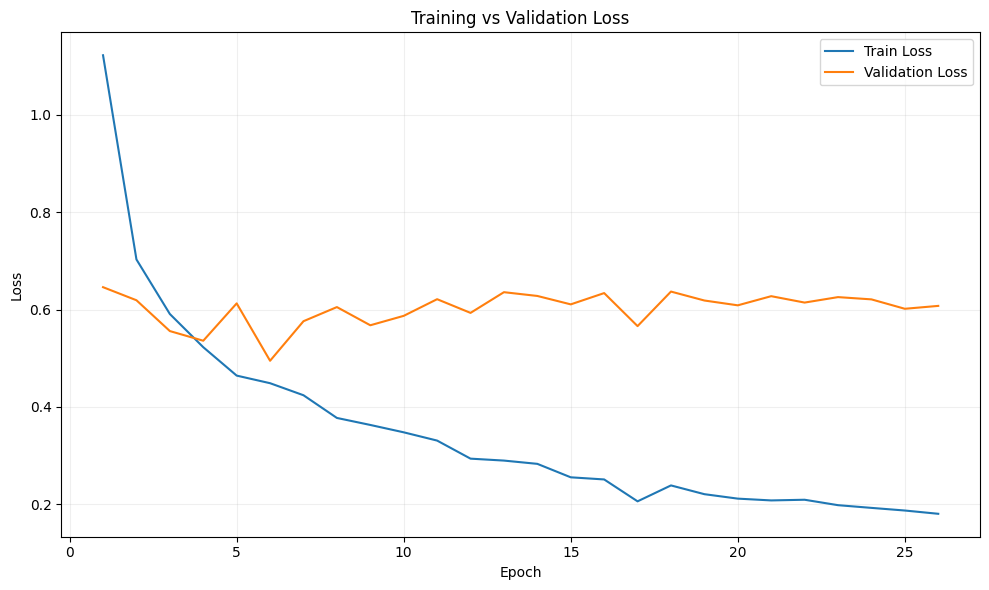

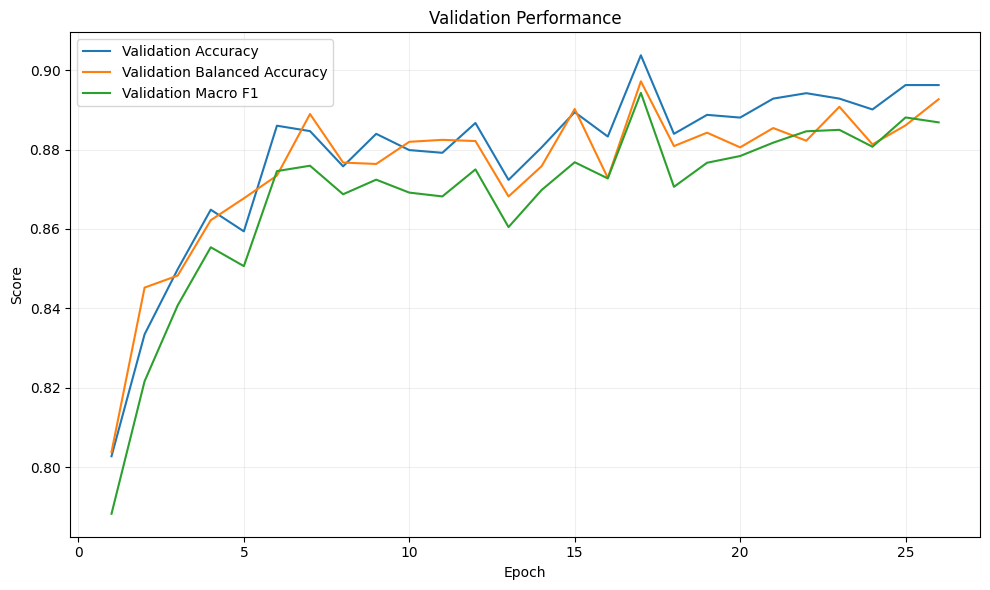


TEST RESULTS
Accuracy          : 0.906548
Balanced Accuracy : 0.894581
Macro F1          : 0.896748
               precision    recall  f1-score   support

        Blast     0.9286    0.8492    0.8871       199
   Brown spot     0.8649    0.8807    0.8727       327
      Healthy     0.9124    0.9703    0.9405       236
    Leaf smut     0.8113    0.7963    0.8037       108
  Rice Tungro     0.9179    0.9288    0.9233       337
Sheath blight     0.9644    0.9421    0.9531       259

     accuracy                         0.9065      1466
    macro avg     0.8999    0.8946    0.8967      1466
 weighted avg     0.9070    0.9065    0.9063      1466



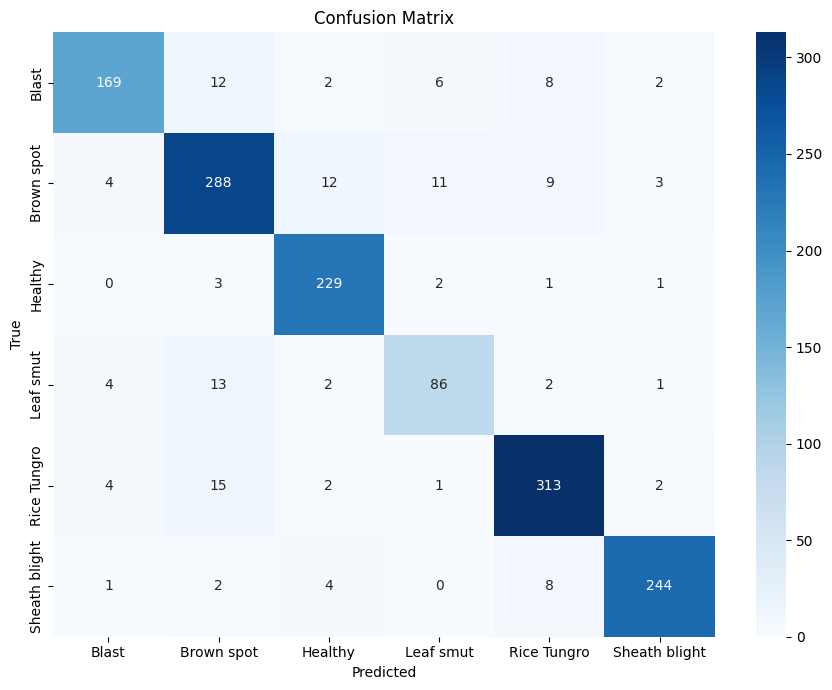

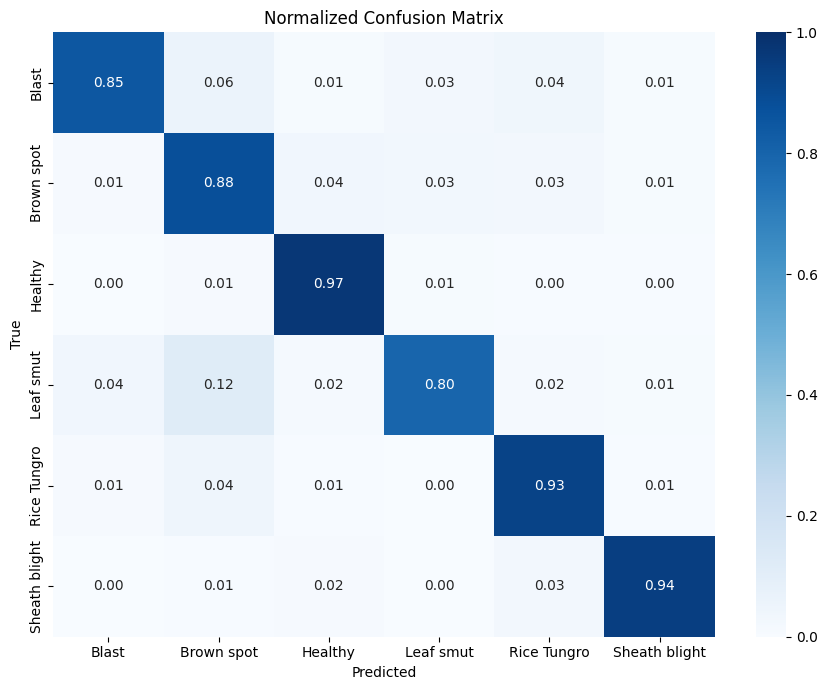

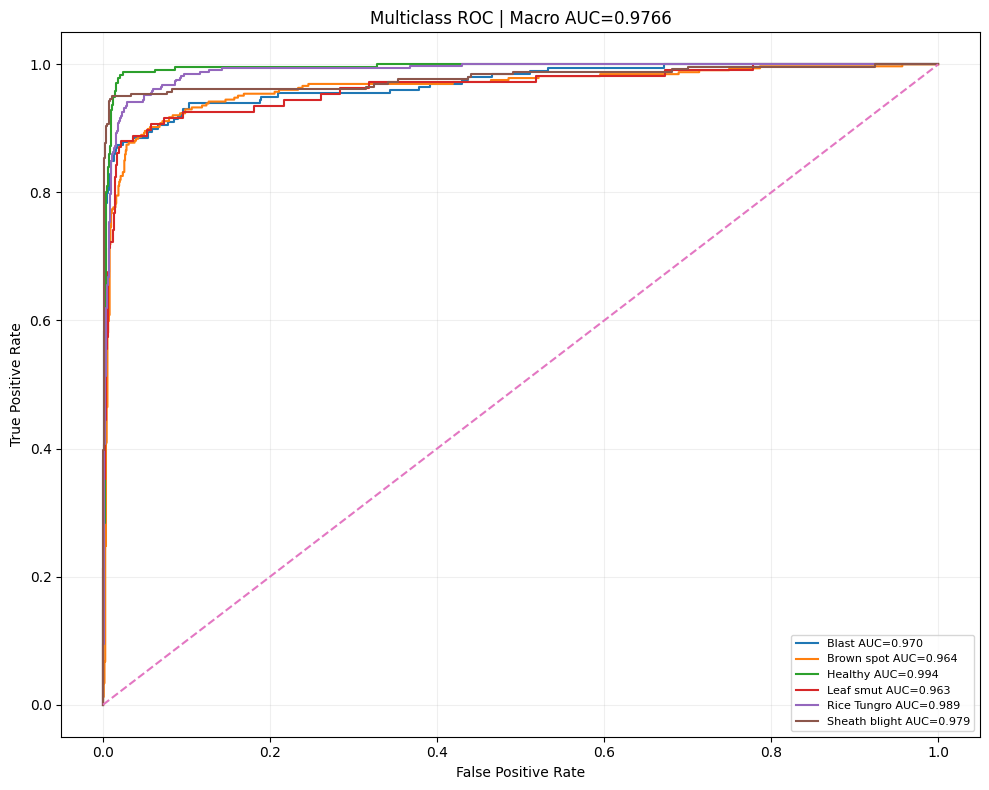

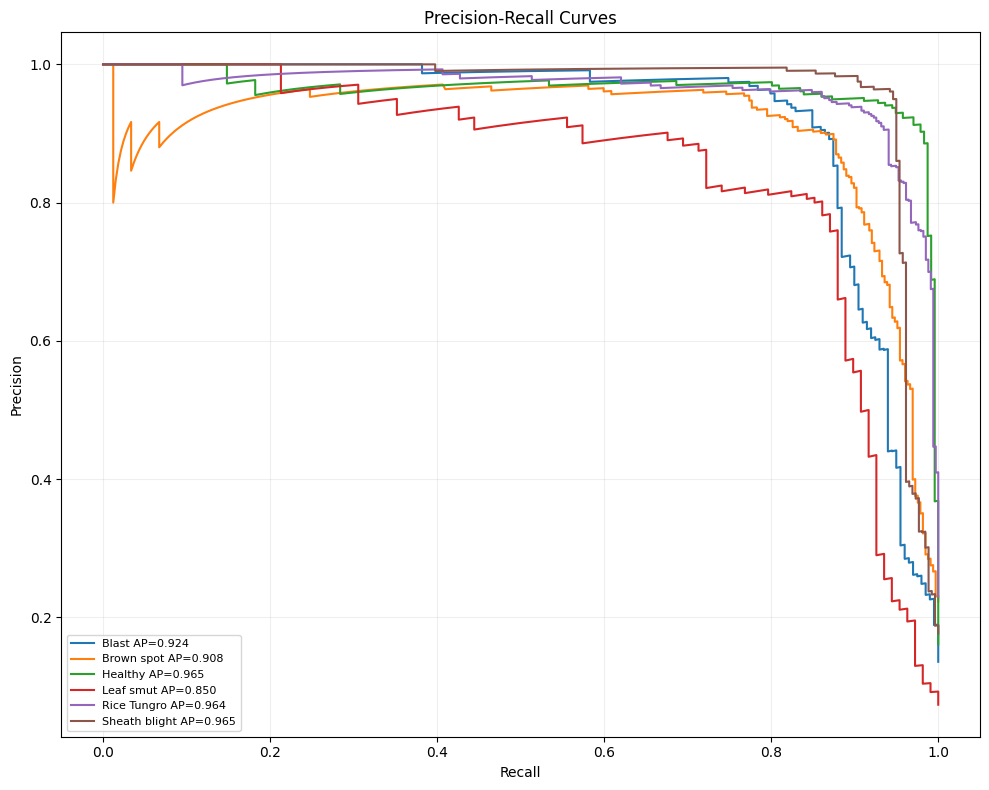

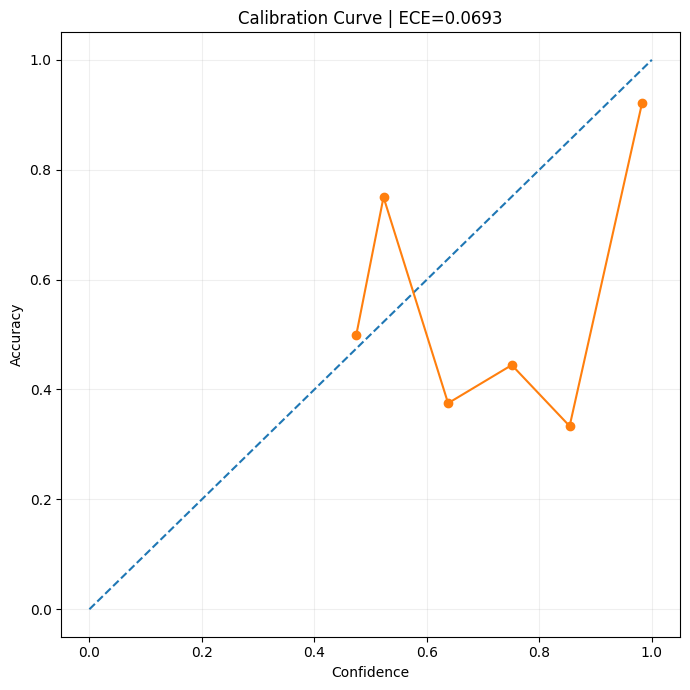

...

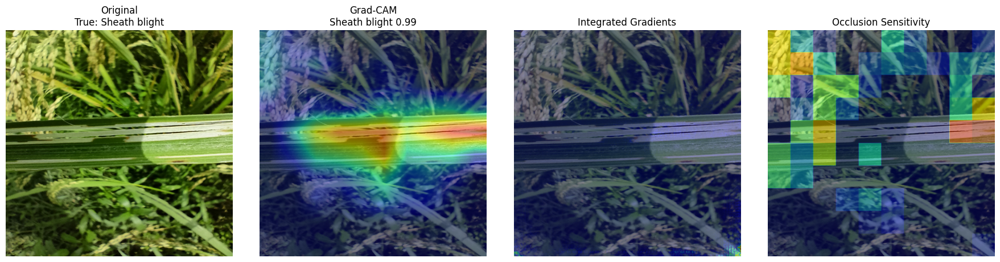

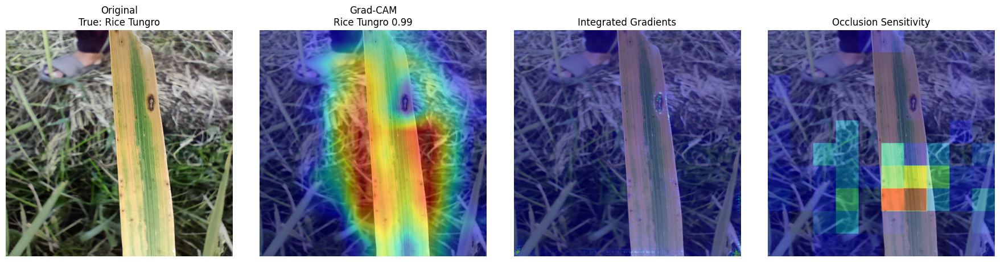

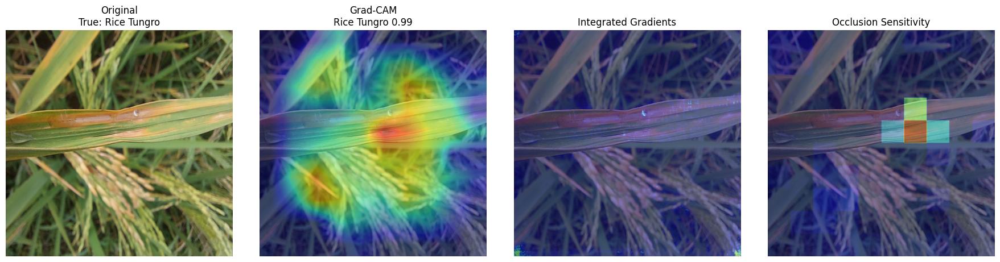

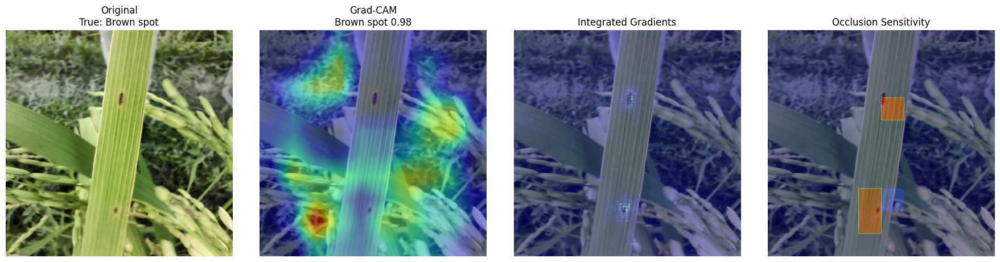

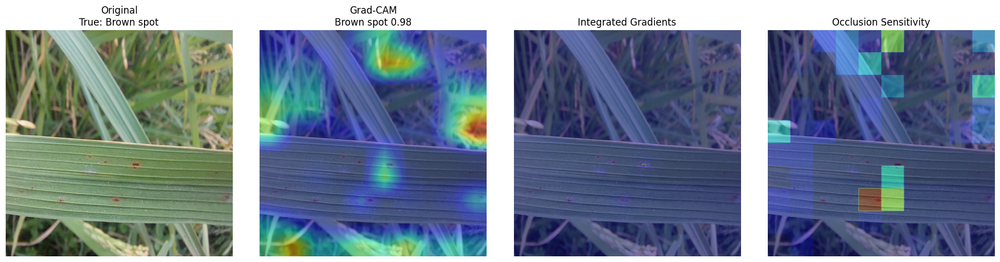


FINAL SUMMARY
{
  "dataset_images": 9769,
  "train": 6838,
  "validation": 1465,
  "test": 1466,
  "classes": [
    "Blast",
    "Brown spot",
    "Healthy",
    "Leaf smut",
    "Rice Tungro",
    "Sheath blight"
  ],
  "input_size": 320,
  "swin_input_size": 256,
  "best_epoch": 17,
  "test_accuracy": 0.9065484311050478,
  "test_balanced_accuracy": 0.8945806300552185,
  "macro_precision": 0.8999038477138409,
  "macro_recall": 0.8945806300552185,
  "macro_f1": 0.8967475463806611,
  "macro_auc_ovr": 0.9766227681780345,
  "cohen_kappa": 0.8854242551994701,
  "matthews_corrcoef": 0.8855779078695483,
  "ECE": 0.06933831184655229,
  "parameters": 58217150
}

Results: /kaggle/working/RiceLeaf_HighAccuracy_DualBranch
ZIP: /kaggle/working/RiceLeaf_HighAccuracy_DualBranch.zip


In [1]:

# ============================================================
# RiceLeafDiseaseBD | High-Accuracy Dual-Branch CNN + SwinV2
# Kaggle T4/P100 friendly | 6-class classification
# Outputs: curves, CM, ROC-AUC, PR, calibration, XAI, errors
# ============================================================

import os, sys, math, json, time, random, warnings, gc, copy
from pathlib import Path
warnings.filterwarnings("ignore")

# -------------------- install --------------------
def ensure(pkg, mod=None):
    import importlib.util, subprocess
    mod = mod or pkg
    if importlib.util.find_spec(mod) is None:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])

for p, m in [("timm","timm"),("albumentations","albumentations"),
             ("seaborn","seaborn"),("scikit-learn","sklearn")]:
    ensure(p, m)

# -------------------- imports --------------------
import numpy as np
import pandas as pd
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_recall_fscore_support,
    classification_report, confusion_matrix, roc_auc_score, roc_curve,
    precision_recall_curve, average_precision_score, cohen_kappa_score,
    matthews_corrcoef
)
from sklearn.preprocessing import label_binarize

# -------------------- config --------------------
SEED = 42
ROOT = "/kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images"
OUT = "/kaggle/working/RiceLeaf_HighAccuracy_DualBranch"
FIG = os.path.join(OUT, "figures")
XAI = os.path.join(OUT, "xai")
os.makedirs(FIG, exist_ok=True)
os.makedirs(XAI, exist_ok=True)

CLASSES_EXPECTED = ["Blast","Brown spot","Healthy","Leaf smut","Rice Tungro","Sheath blight"]

IMG_SIZE = 320
SWIN_SIZE = 256
BATCH_SIZE = 8                 # T4: 8 is conservative
ACCUM_STEPS = 2                # effective batch = 16
EPOCHS = 35
WARMUP_EPOCHS = 3
LR_BACKBONE = 2e-5
LR_HEAD = 2e-4
WEIGHT_DECAY = 1e-4
LABEL_SMOOTHING = 0.02
DROPOUT = 0.20
PATIENCE = 9
AUX_WEIGHT = 0.15
AMP = torch.cuda.is_available()
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.benchmark = True

seed_all(SEED)

print("="*90)
print("RiceLeafDiseaseBD | High-Accuracy Dual-Branch CNN + SwinV2")
print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
print("Dataset:", ROOT)

# ============================================================
# 1. DATASET
# ============================================================
exts = {".jpg",".jpeg",".png",".bmp",".webp"}
rows = []
for cls in sorted(os.listdir(ROOT)):
    d = os.path.join(ROOT, cls)
    if os.path.isdir(d):
        for r, _, fs in os.walk(d):
            for f in fs:
                if Path(f).suffix.lower() in exts:
                    rows.append((os.path.join(r, f), cls))

df = pd.DataFrame(rows, columns=["path","label_name"])
if len(df) == 0:
    raise RuntimeError("No images found. Check ROOT.")

classes = sorted(df.label_name.unique())
if set(CLASSES_EXPECTED) != set(classes):
    print("WARNING: detected classes:", classes)

c2i = {c:i for i,c in enumerate(classes)}
i2c = {i:c for c,i in c2i.items()}
df["label"] = df.label_name.map(c2i)

print("\nClasses:", classes)
print(df.label_name.value_counts())

# 70 / 15 / 15 stratified split
train_df, tmp_df = train_test_split(
    df, test_size=0.30, stratify=df.label, random_state=SEED
)
val_df, test_df = train_test_split(
    tmp_df, test_size=0.50, stratify=tmp_df.label, random_state=SEED
)
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print(f"Split: train={len(train_df)} val={len(val_df)} test={len(test_df)}")

train_df.to_csv(os.path.join(OUT,"train_split.csv"), index=False)
val_df.to_csv(os.path.join(OUT,"val_split.csv"), index=False)
test_df.to_csv(os.path.join(OUT,"test_split.csv"), index=False)

# ============================================================
# 2. PREPROCESSING
# ============================================================
MEAN = (0.485, 0.456, 0.406)
STD  = (0.229, 0.224, 0.225)

# Important: less destructive than the previous pipeline.
# Tiny disease lesions should not be randomly erased too often.
train_tfms = A.Compose([
    A.RandomResizedCrop(size=(IMG_SIZE, IMG_SIZE),
                        scale=(0.82, 1.0), ratio=(0.90, 1.10), p=1.0),
    A.HorizontalFlip(p=0.50),
    A.VerticalFlip(p=0.15),
    A.Rotate(limit=20, border_mode=0, p=0.35),
    A.OneOf([
        A.RandomBrightnessContrast(brightness_limit=0.12, contrast_limit=0.12),
        A.HueSaturationValue(hue_shift_limit=6,
                             sat_shift_limit=10, val_shift_limit=8),
        A.CLAHE(clip_limit=2.0, tile_grid_size=(8,8))
    ], p=0.25),
    A.GaussNoise(std_range=(0.01,0.04), p=0.10),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2()
])

eval_tfms = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2()
])

class RiceDS(Dataset):
    def __init__(self, frame, transform):
        self.d = frame.reset_index(drop=True)
        self.t = transform

    def __len__(self):
        return len(self.d)

    def __getitem__(self, i):
        row = self.d.iloc[i]
        img = np.array(Image.open(row.path).convert("RGB"))
        x = self.t(image=img)["image"]
        return x, int(row.label), row.path

train_ds = RiceDS(train_df, train_tfms)
val_ds = RiceDS(val_df, eval_tfms)
test_ds = RiceDS(test_df, eval_tfms)

# Balanced sampler helps Leaf smut without simultaneously applying
# aggressive class weights, which can over-correct the majority classes.
counts = train_df.label.value_counts().sort_index().values
sample_weights = train_df.label.map({
    i: len(train_df)/(len(classes)*counts[i]) for i in range(len(classes))
}).values
sampler = WeightedRandomSampler(
    weights=torch.as_tensor(sample_weights, dtype=torch.double),
    num_samples=len(train_df),
    replacement=True
)

train_loader = DataLoader(
    train_ds, batch_size=BATCH_SIZE, sampler=sampler,
    num_workers=min(4, os.cpu_count() or 2),
    pin_memory=AMP, persistent_workers=True
)
val_loader = DataLoader(
    val_ds, batch_size=BATCH_SIZE*2, shuffle=False,
    num_workers=min(4, os.cpu_count() or 2),
    pin_memory=AMP, persistent_workers=True
)
test_loader = DataLoader(
    test_ds, batch_size=BATCH_SIZE*2, shuffle=False,
    num_workers=min(4, os.cpu_count() or 2),
    pin_memory=AMP, persistent_workers=True
)

# ============================================================
# 3. MODEL
# ============================================================
# Both branches are pretrained. ConvNeXtV2 supplies local texture
# information; SwinV2 supplies hierarchical/global context.
#
# Unlike the previous code, cross-attention is performed over MULTIPLE
# spatial tokens. A one-token MultiheadAttention is not meaningful:
# softmax over one key is always 1.

class SpatialProjector(nn.Module):
    def __init__(self, in_ch, d=384, grid=4):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Conv2d(in_ch, d, 1, bias=False),
            nn.BatchNorm2d(d),
            nn.GELU()
        )
        self.pool = nn.AdaptiveAvgPool2d((grid, grid))
        self.norm = nn.LayerNorm(d)

    def forward(self, x):
        x = self.proj(x)
        x = self.pool(x)
        x = x.flatten(2).transpose(1,2)   # B, tokens, d
        return self.norm(x)

class DualCrossFusion(nn.Module):
    def __init__(self, d=384, heads=6, dropout=0.10):
        super().__init__()
        self.c2s = nn.MultiheadAttention(
            d, heads, dropout=dropout, batch_first=True
        )
        self.s2c = nn.MultiheadAttention(
            d, heads, dropout=dropout, batch_first=True
        )
        self.n1 = nn.LayerNorm(d)
        self.n2 = nn.LayerNorm(d)

        self.gate = nn.Sequential(
            nn.Linear(2*d, d),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d, 2)
        )

        self.fuse = nn.Sequential(
            nn.LayerNorm(2*d),
            nn.Linear(2*d, 512),
            nn.GELU(),
            nn.Dropout(DROPOUT),
            nn.Linear(512, 384)
        )

    def forward(self, c, s):
        # c and s are B x T x D
        c2, _ = self.c2s(c, s, s)
        s2, _ = self.s2c(s, c, c)

        c = self.n1(c + c2)
        s = self.n2(s + s2)

        cp = c.mean(1)
        sp = s.mean(1)

        g = torch.softmax(self.gate(torch.cat([cp, sp], 1)), 1)
        f = self.fuse(torch.cat([
            cp * g[:,0:1],
            sp * g[:,1:2]
        ], 1))
        return f, g, cp, sp

class RiceDualNet(nn.Module):
    def __init__(self, n_classes):
        super().__init__()

        self.cnn = timm.create_model(
            "convnextv2_tiny.fcmae_ft_in22k_in1k",
            pretrained=True, num_classes=0, global_pool=""
        )

        self.swin = timm.create_model(
            "swinv2_tiny_window8_256.ms_in1k",
            pretrained=True, num_classes=0, global_pool=""
        )

        # Probe feature dimensions safely.
        with torch.no_grad():
            dmy = torch.zeros(1,3,IMG_SIZE,IMG_SIZE)
            c0 = self.cnn.forward_features(dmy)
            smy = F.interpolate(dmy, size=(SWIN_SIZE,SWIN_SIZE),
                                mode="bilinear", align_corners=False)
            s0 = self.swin.forward_features(smy)

        self.c_ch = c0.shape[1] if c0.ndim == 4 and c0.shape[1] < 2000 else c0.shape[-1]
        self.s_ch = s0.shape[-1] if s0.ndim == 4 else s0.shape[1]

        self.cp = SpatialProjector(self.c_ch, 384, grid=4)
        self.sp = SpatialProjector(self.s_ch, 384, grid=4)
        self.cross = DualCrossFusion(384, heads=6)

        self.c_head = nn.Sequential(
            nn.LayerNorm(384), nn.Dropout(0.10), nn.Linear(384,n_classes)
        )
        self.s_head = nn.Sequential(
            nn.LayerNorm(384), nn.Dropout(0.10), nn.Linear(384,n_classes)
        )
        self.head = nn.Sequential(
            nn.LayerNorm(384),
            nn.Dropout(DROPOUT),
            nn.Linear(384,256),
            nn.GELU(),
            nn.Dropout(0.10),
            nn.Linear(256,n_classes)
        )

        self.last = {}

    @staticmethod
    def to_nchw(z):
        if z.ndim != 4:
            raise RuntimeError(f"Expected 4D feature map, got {z.shape}")
        # ConvNeXtV2 is NCHW, while SwinV2 is commonly NHWC.
        # Detect NHWC by checking whether the last dimension is the
        # largest feature/channel dimension.
        if z.shape[-1] > z.shape[1] and z.shape[-1] > z.shape[2]:
            z = z.permute(0,3,1,2).contiguous()
        return z

    def forward(self, x, aux=False):
        c = self.cnn.forward_features(x)
        c = self.to_nchw(c)

        xs = F.interpolate(
            x, size=(SWIN_SIZE,SWIN_SIZE),
            mode="bilinear", align_corners=False
        )
        s = self.swin.forward_features(xs)
        s = self.to_nchw(s)

        ct = self.cp(c)
        st = self.sp(s)

        f, gate, cp, sp = self.cross(ct, st)
        out = self.head(f)

        if aux:
            co = self.c_head(cp)
            so = self.s_head(sp)
            self.last = {
                "cnn": cp.detach(),
                "swin": sp.detach(),
                "fused": f.detach(),
                "gates": gate.detach(),
                "cnn_map": c,
                "swin_map": s
            }
            return out, co, so, self.last
        return out

model = RiceDualNet(len(classes)).to(DEVICE)

print("\nParameters:", f"{sum(p.numel() for p in model.parameters()):,}")

# ============================================================
# 4. TRAINING
# ============================================================
criterion = nn.CrossEntropyLoss(label_smoothing=LABEL_SMOOTHING)

# Separate LR for pretrained backbones and new fusion/head layers.
backbone, head = [], []
for n,p in model.named_parameters():
    if n.startswith("cnn.") or n.startswith("swin."):
        backbone.append(p)
    else:
        head.append(p)

optimizer = torch.optim.AdamW([
    {"params": backbone, "lr": LR_BACKBONE},
    {"params": head, "lr": LR_HEAD}
], weight_decay=WEIGHT_DECAY)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=EPOCHS, eta_min=1e-6
)

if torch.__version__ >= "2.0":
    scaler = torch.amp.GradScaler("cuda", enabled=AMP)
else:
    scaler = torch.cuda.amp.GradScaler(enabled=AMP)

def autocast_ctx():
    if torch.__version__ >= "2.0":
        return torch.amp.autocast(
            device_type="cuda", dtype=torch.float16, enabled=AMP
        )
    return torch.cuda.amp.autocast(enabled=AMP)

@torch.no_grad()
def evaluate(loader):
    model.eval()
    ys, ps, probs = [], [], []
    losses = []
    for x,y,_ in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        with autocast_ctx():
            z = model(x)
            loss = criterion(z,y)
        q = F.softmax(z.float(),1)
        losses.append(loss.item())
        ys.extend(y.cpu().numpy())
        ps.extend(q.argmax(1).cpu().numpy())
        probs.append(q.cpu().numpy())

    ys = np.asarray(ys)
    ps = np.asarray(ps)
    probs = np.concatenate(probs)

    return {
        "loss": float(np.mean(losses)),
        "accuracy": accuracy_score(ys,ps),
        "balanced_accuracy": balanced_accuracy_score(ys,ps),
        "macro_f1": precision_recall_fscore_support(
            ys,ps,average="macro",zero_division=0
        )[2],
        "y_true": ys,
        "y_pred": ps,
        "y_prob": probs
    }

def train_one_epoch():
    model.train()
    optimizer.zero_grad(set_to_none=True)
    losses = []

    for step,(x,y,_) in enumerate(train_loader):
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        with autocast_ctx():
            out, co, so, _ = model(x, aux=True)
            loss = (
                criterion(out,y)
                + AUX_WEIGHT * criterion(co,y)
                + AUX_WEIGHT * criterion(so,y)
            )
            loss = loss / ACCUM_STEPS

        scaler.scale(loss).backward()

        if (step + 1) % ACCUM_STEPS == 0 or (step + 1) == len(train_loader):
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)

        losses.append(float(loss.item() * ACCUM_STEPS))

    return float(np.mean(losses))

history = []
best_score = -1
wait = 0
best_path = os.path.join(OUT,"best_model.pt")

for epoch in range(1,EPOCHS+1):
    tr_loss = train_one_epoch()
    val = evaluate(val_loader)
    scheduler.step()

    history.append([
        epoch, tr_loss, val["loss"], val["accuracy"],
        val["balanced_accuracy"], val["macro_f1"],
        optimizer.param_groups[0]["lr"],
        optimizer.param_groups[1]["lr"]
    ])

    print(
        f"Epoch {epoch:02d} | train_loss={tr_loss:.4f} "
        f"| val_loss={val['loss']:.4f} "
        f"| val_acc={val['accuracy']:.4f} "
        f"| val_bacc={val['balanced_accuracy']:.4f} "
        f"| val_f1={val['macro_f1']:.4f}"
    )

    # Main selection target: macro-F1 + balanced accuracy.
    score = 0.5*val["macro_f1"] + 0.5*val["balanced_accuracy"]

    if score > best_score:
        best_score = score
        wait = 0
        torch.save({
            "model_state": copy.deepcopy(model.state_dict()),
            "epoch": epoch,
            "score": float(score),
            "classes": classes
        }, best_path)
        print("  BEST checkpoint saved")
    else:
        wait += 1
        if wait >= PATIENCE:
            print("Early stopping")
            break

hist = pd.DataFrame(history, columns=[
    "epoch","train_loss","val_loss","val_accuracy",
    "val_balanced_accuracy","val_macro_f1","lr_backbone","lr_head"
])
hist.to_csv(os.path.join(OUT,"training_history.csv"), index=False)

# ============================================================
# 5. TRAINING / VALIDATION CURVES
# ============================================================
plt.figure(figsize=(10,6))
plt.plot(hist.epoch, hist.train_loss, label="Train Loss")
plt.plot(hist.epoch, hist.val_loss, label="Validation Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend(); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"loss_curve.png"), dpi=220)
plt.show(); plt.close()

plt.figure(figsize=(10,6))
plt.plot(hist.epoch, hist.val_accuracy, label="Validation Accuracy")
plt.plot(hist.epoch, hist.val_balanced_accuracy, label="Validation Balanced Accuracy")
plt.plot(hist.epoch, hist.val_macro_f1, label="Validation Macro F1")
plt.xlabel("Epoch"); plt.ylabel("Score")
plt.title("Validation Performance")
plt.legend(); plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"validation_curve.png"), dpi=220)
plt.show(); plt.close()

# ============================================================
# 6. BEST MODEL + TEST
# ============================================================
ckpt = torch.load(best_path, map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt["model_state"])

test = evaluate(test_loader)
yt, yp, prob = test["y_true"], test["y_pred"], test["y_prob"]

print("\n" + "="*80)
print("TEST RESULTS")
print("Accuracy          :", round(test["accuracy"], 6))
print("Balanced Accuracy :", round(test["balanced_accuracy"], 6))
print("Macro F1          :", round(test["macro_f1"], 6))
print(classification_report(
    yt, yp, target_names=classes, digits=4, zero_division=0
))

report = classification_report(
    yt, yp, target_names=classes, digits=4,
    output_dict=True, zero_division=0
)
pd.DataFrame(report).T.to_csv(
    os.path.join(OUT,"classification_report.csv")
)

# ============================================================
# 7. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(yt, yp)

plt.figure(figsize=(9,7))
sns.heatmap(
    cm, annot=True, fmt="d", cmap="Blues",
    xticklabels=classes, yticklabels=classes
)
plt.xlabel("Predicted"); plt.ylabel("True")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig(os.path.join(FIG,"confusion_matrix.png"), dpi=240)
plt.show(); plt.close()

cmn = cm / np.maximum(cm.sum(1, keepdims=True), 1)
plt.figure(figsize=(9,7))
sns.heatmap(
    cmn, annot=True, fmt=".2f", cmap="Blues",
    vmin=0, vmax=1, xticklabels=classes, yticklabels=classes
)
plt.xlabel("Predicted"); plt.ylabel("True")
plt.title("Normalized Confusion Matrix")
plt.tight_layout()
plt.savefig(os.path.join(FIG,"normalized_confusion_matrix.png"), dpi=240)
plt.show(); plt.close()

# ============================================================
# 8. ROC-AUC
# ============================================================
yb = label_binarize(yt, classes=np.arange(len(classes)))
macro_auc = roc_auc_score(
    yb, prob, average="macro", multi_class="ovr"
)

auc_rows = []
plt.figure(figsize=(10,8))
for i,c in enumerate(classes):
    fpr,tpr,_ = roc_curve(yb[:,i], prob[:,i])
    a = roc_auc_score(yb[:,i], prob[:,i])
    auc_rows.append([c,a])
    plt.plot(fpr,tpr,label=f"{c} AUC={a:.3f}")

plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"Multiclass ROC | Macro AUC={macro_auc:.4f}")
plt.legend(fontsize=8)
plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"roc_auc_curve.png"), dpi=220)
plt.show(); plt.close()

pd.DataFrame(auc_rows,columns=["class","auc"]).to_csv(
    os.path.join(OUT,"roc_auc.csv"), index=False
)

# ============================================================
# 9. PRECISION-RECALL
# ============================================================
ap_rows = []
plt.figure(figsize=(10,8))
for i,c in enumerate(classes):
    p,r,_ = precision_recall_curve(yb[:,i], prob[:,i])
    ap = average_precision_score(yb[:,i], prob[:,i])
    ap_rows.append([c,ap])
    plt.plot(r,p,label=f"{c} AP={ap:.3f}")

plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title("Precision-Recall Curves")
plt.legend(fontsize=8)
plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"precision_recall_curve.png"), dpi=220)
plt.show(); plt.close()

pd.DataFrame(
    ap_rows, columns=["class","average_precision"]
).to_csv(os.path.join(OUT,"pr_auc.csv"), index=False)

# ============================================================
# 10. CALIBRATION / CONFIDENCE
# ============================================================
conf = prob.max(1)
correct = yp == yt

bins = np.linspace(0,1,11)
cal_rows = []
ece = 0.0

for lo,hi in zip(bins[:-1], bins[1:]):
    mask = (conf > lo) & (conf <= hi)
    if mask.any():
        bin_acc = correct[mask].mean()
        bin_conf = conf[mask].mean()
        ece += mask.mean() * abs(bin_acc - bin_conf)
        cal_rows.append([
            (lo+hi)/2, bin_conf, bin_acc, int(mask.sum())
        ])

cal = pd.DataFrame(
    cal_rows, columns=["bin","confidence","accuracy","count"]
)
cal.to_csv(os.path.join(OUT,"calibration_bins.csv"), index=False)

plt.figure(figsize=(7,7))
plt.plot([0,1],[0,1],"--")
plt.plot(cal.confidence,cal.accuracy,"o-")
plt.xlabel("Confidence"); plt.ylabel("Accuracy")
plt.title(f"Calibration Curve | ECE={ece:.4f}")
plt.grid(alpha=.2); plt.tight_layout()
plt.savefig(os.path.join(FIG,"calibration_curve.png"), dpi=220)
plt.show(); plt.close()

# ============================================================
# 11. ERROR ANALYSIS
# ============================================================
mis_idx = np.where(~correct)[0]
mis_rows = []
for i in mis_idx:
    mis_rows.append({
        "path": test_df.iloc[i].path,
        "true": i2c[yt[i]],
        "pred": i2c[yp[i]],
        "confidence": float(conf[i])
    })

mis = pd.DataFrame(mis_rows)
if len(mis):
    mis = mis.sort_values("confidence", ascending=False)
mis.to_csv(os.path.join(OUT,"misclassifications.csv"), index=False)

if len(mis):
    n = min(24,len(mis))
    nr = math.ceil(n/6)
    fig,ax = plt.subplots(nr,6,figsize=(18,3*nr))
    ax = np.array(ax).reshape(-1)
    for a,(_,r) in zip(ax,mis.head(n).iterrows()):
        a.imshow(Image.open(r.path).convert("RGB"))
        a.set_title(f"T:{r.true}\nP:{r.pred} {r.confidence:.2f}")
        a.axis("off")
    for a in ax[n:]:
        a.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(FIG,"misclassified_examples.png"), dpi=220)
    plt.show(); plt.close()

# ============================================================
# 12. FUSION GATE ANALYSIS
# ============================================================
@torch.no_grad()
def collect_gates(loader):
    model.eval()
    gs, ys, ps = [], [], []
    for x,y,_ in loader:
        x = x.to(DEVICE)
        z,co,so,a = model(x, aux=True)
        gs.append(a["gates"].cpu().numpy())
        ys.extend(y.numpy())
        ps.extend(z.argmax(1).cpu().numpy())
    return np.concatenate(gs), np.asarray(ys), np.asarray(ps)

g,gy,gp = collect_gates(test_loader)
gate_df = pd.DataFrame({
    "cnn_gate": g[:,0],
    "swin_gate": g[:,1],
    "class": [i2c[i] for i in gy],
    "correct": gy == gp
})
gate_df.to_csv(os.path.join(OUT,"fusion_gate_analysis.csv"), index=False)

gate_mean = gate_df.groupby("class")[["cnn_gate","swin_gate"]].mean()
gate_mean.plot(kind="bar", figsize=(11,6))
plt.ylabel("Mean Fusion Weight")
plt.title("Adaptive CNN vs SwinV2 Fusion")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()
plt.savefig(os.path.join(FIG,"fusion_gates.png"), dpi=220)
plt.show(); plt.close()

# ============================================================
# 13. XAI
# ============================================================
# Key fix for the previous error:
# original images are 1024x1024, while model input is 320x320.
# Attribution maps are generated at 320 and then resized to the
# ORIGINAL image dimensions before overlay.

def prep_xai(path):
    raw = np.array(Image.open(path).convert("RGB"))
    x = eval_tfms(image=raw)["image"].unsqueeze(0).to(DEVICE)
    return raw, x

def normalize_map(m):
    m = np.asarray(m, dtype=np.float32)
    m = np.maximum(m,0)
    lo,hi = m.min(),m.max()
    return (m-lo)/(hi-lo+1e-8)

def overlay(raw, heatmap, alpha=0.45):
    h = torch.tensor(heatmap)[None,None].float()
    h = F.interpolate(
        h, size=(raw.shape[0],raw.shape[1]),
        mode="bilinear", align_corners=False
    )[0,0].numpy()

    h = normalize_map(h)
    cmap = plt.get_cmap("jet")(np.uint8(h*255))[...,:3]
    return np.clip(
        (1-alpha)*(raw.astype(np.float32)/255.0) + alpha*cmap,
        0,1
    )

# Grad-CAM target: final ConvNeXtV2 feature map.
acts, grads = [], []
target_layer = model.cnn.stages[-1]

fh = target_layer.register_forward_hook(
    lambda m,i,o: acts.append(o)
)
bh = target_layer.register_full_backward_hook(
    lambda m,gi,go: grads.append(go[0])
)

def gradcam(x, idx):
    acts.clear(); grads.clear()
    model.zero_grad(set_to_none=True)

    z = model(x)
    z[0,idx].backward()

    a = acts[-1]
    g = grads[-1]

    if a.ndim != 4 or g.ndim != 4:
        raise RuntimeError(f"Unexpected GradCAM shape: {a.shape}, {g.shape}")

    # Convert NHWC -> NCHW when necessary.
    if a.shape[1] != g.shape[1] and a.shape[-1] == g.shape[-1]:
        a = a.permute(0,3,1,2).contiguous()
        g = g.permute(0,3,1,2).contiguous()

    w = g.mean(dim=(2,3), keepdim=True)
    h = F.relu((w*a).sum(1))

    h = F.interpolate(
        h[:,None], size=(IMG_SIZE,IMG_SIZE),
        mode="bilinear", align_corners=False
    )[:,0]
    return normalize_map(h[0].detach().cpu().numpy())

def integrated_gradients(x, idx, steps=24):
    baseline = torch.zeros_like(x)
    total = torch.zeros_like(x)

    for alpha in torch.linspace(0,1,steps,device=DEVICE):
        z = (baseline + alpha*(x-baseline)).detach()
        z.requires_grad_(True)
        model.zero_grad(set_to_none=True)
        score = model(z)[0,idx]
        score.backward()
        total += z.grad.detach()

    h = ((x-baseline)*(total/steps)).abs().sum(1)
    h = F.interpolate(
        h[:,None], size=(IMG_SIZE,IMG_SIZE),
        mode="bilinear", align_corners=False
    )[:,0]
    return normalize_map(h[0].detach().cpu().numpy())

@torch.no_grad()
def occlusion(x, idx, patch=32, stride=32):
    base = F.softmax(model(x),1)[0,idx].item()
    H=W=IMG_SIZE
    h=np.zeros((H,W),dtype=np.float32)
    cnt=np.zeros((H,W),dtype=np.float32)

    for yy in range(0,H,stride):
        for xx in range(0,W,stride):
            q=x.clone()
            y2=min(H,yy+patch)
            x2=min(W,xx+patch)
            q[:,:,yy:y2,xx:x2]=0
            drop = base - F.softmax(model(q),1)[0,idx].item()
            h[yy:y2,xx:x2] += max(drop,0)
            cnt[yy:y2,xx:x2] += 1

    return normalize_map(h/np.maximum(cnt,1))

xai_sample = test_df.sample(
    min(12,len(test_df)), random_state=SEED
)

model.eval()

for j,(_,row) in enumerate(xai_sample.iterrows()):
    try:
        raw,x = prep_xai(row.path)
        with torch.no_grad():
            q = F.softmax(model(x),1)[0]
            idx = q.argmax().item()
            confv = q[idx].item()

        gcmap = gradcam(x,idx)
        igmap = integrated_gradients(x,idx)
        occmap = occlusion(x,idx)

        fig,ax = plt.subplots(1,4,figsize=(18,4.5))
        ax[0].imshow(raw)
        ax[0].set_title(f"Original\nTrue: {row.label_name}")
        ax[1].imshow(overlay(raw,gcmap))
        ax[1].set_title(f"Grad-CAM\n{i2c[idx]} {confv:.2f}")
        ax[2].imshow(overlay(raw,igmap))
        ax[2].set_title("Integrated Gradients")
        ax[3].imshow(overlay(raw,occmap))
        ax[3].set_title("Occlusion Sensitivity")
        for a in ax:
            a.axis("off")
        plt.tight_layout()
        plt.savefig(os.path.join(XAI,f"xai_{j:03d}.png"),dpi=220)
        plt.show(); plt.close()

    except Exception as e:
        print("XAI failed:", j, repr(e))

fh.remove(); bh.remove()

# ============================================================
# 14. FINAL METRICS
# ============================================================
macro_precision, macro_recall, macro_f1, _ = \
    precision_recall_fscore_support(
        yt, yp, average="macro", zero_division=0
    )

summary = {
    "dataset_images": int(len(df)),
    "train": int(len(train_df)),
    "validation": int(len(val_df)),
    "test": int(len(test_df)),
    "classes": classes,
    "input_size": IMG_SIZE,
    "swin_input_size": SWIN_SIZE,
    "best_epoch": int(ckpt["epoch"]),
    "test_accuracy": float(test["accuracy"]),
    "test_balanced_accuracy": float(test["balanced_accuracy"]),
    "macro_precision": float(macro_precision),
    "macro_recall": float(macro_recall),
    "macro_f1": float(macro_f1),
    "macro_auc_ovr": float(macro_auc),
    "cohen_kappa": float(cohen_kappa_score(yt,yp)),
    "matthews_corrcoef": float(matthews_corrcoef(yt,yp)),
    "ECE": float(ece),
    "parameters": int(sum(p.numel() for p in model.parameters()))
}

with open(os.path.join(OUT,"final_metrics.json"),"w") as f:
    json.dump(summary,f,indent=2)

print("\n" + "="*90)
print("FINAL SUMMARY")
print(json.dumps(summary,indent=2))

# ZIP everything
import shutil
zip_path = shutil.make_archive(
    "/kaggle/working/RiceLeaf_HighAccuracy_DualBranch",
    "zip", OUT
)
print("\nResults:", OUT)
print("ZIP:", zip_path)


In [1]:
# ================================================================
# Rice Leaf Disease | ConvNeXtV2-Tiny + SwinV2-Tiny
# Duplicate-aware hold-out test + StratifiedGroupKFold CV
# Cross-attention + adaptive gate + auxiliary heads
# TTA ensemble + ROC/PR/calibration + XAI + progress bars
# Designed for a single Kaggle T4/P100 (16 GB)
# ================================================================

import os, sys, gc, json, math, time, random, warnings, shutil, subprocess, importlib.util
from pathlib import Path
warnings.filterwarnings("ignore")

# --------------------------- CONFIG ------------------------------
SEED = 42
ROOT = "/kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images"
OUT = "/kaggle/working/RiceLeaf_DualBranch_CV_Results"
FIG = os.path.join(OUT, "figures")
XAI = os.path.join(OUT, "xai")
CKPT = os.path.join(OUT, "checkpoints")
for d in [OUT, FIG, XAI, CKPT]:
    os.makedirs(d, exist_ok=True)

DEV_MODE = False                 # True = 1-2 folds, 1-2 epochs, end-to-end sanity check
DEV_FOLDS = 2
DEV_EPOCHS = 2
N_FOLDS = 5
TEST_FRACTION_TARGET = 0.15
PHASH_SIZE = 8
PHASH_MAX_HAMMING = 6

CNN_SIZE = 224                   # ConvNeXtV2 pretrained native train resolution
SWIN_SIZE = 256                  # SwinV2 pretrained native resolution
TOKEN_GRID = 4                   # 4x4 = 16 tokens per branch
EMBED_DIM = 384
NUM_HEADS = 6
BATCH_SIZE = 4                   # T4/P100 safe default for two backbones
VAL_BATCH_SIZE = 8
ACCUM_STEPS = 4
NUM_WORKERS = min(4, os.cpu_count() or 2)

MAX_EPOCHS = 25
WARMUP_EPOCHS = 3
BACKBONE_LR = 2e-5
HEAD_LR = 2e-4
WEIGHT_DECAY = 1e-4
LABEL_SMOOTHING = 0.02
AUX_WEIGHT = 0.15
DROPOUT = 0.20
CLIP_NORM = 1.0
PATIENCE = 6
TOP_K = 3

# Set to 6 for faster XAI. Increase for more detailed IG.
XAI_SAMPLES = 6
IG_STEPS = 16
OCCLUSION_PATCH = 32
OCCLUSION_STRIDE = 32

CLASSES_EXPECTED = ["Blast", "Brown spot", "Healthy", "Leaf smut", "Rice Tungro", "Sheath blight"]
MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
DEVICE = torch_device = None

# --------------------------- PACKAGES -----------------------------
def ensure(pkg, mod=None):
    mod = mod or pkg
    if importlib.util.find_spec(mod) is None:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])

for pkg, mod in [
    ("timm", "timm"),
    ("albumentations", "albumentations"),
    ("imagehash", "imagehash"),
    ("seaborn", "seaborn"),
    ("tqdm", "tqdm"),
    ("scikit-learn", "sklearn"),
]:
    ensure(pkg, mod)

import numpy as np
import pandas as pd
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2
import imagehash
from tqdm.auto import tqdm

from sklearn.model_selection import StratifiedKFold
try:
    from sklearn.model_selection import StratifiedGroupKFold
    HAS_SGKF = True
except ImportError:
    StratifiedGroupKFold = None
    HAS_SGKF = False
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_recall_fscore_support,
    classification_report, confusion_matrix, roc_auc_score, roc_curve,
    precision_recall_curve, average_precision_score, cohen_kappa_score,
    matthews_corrcoef
)
from sklearn.preprocessing import label_binarize

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AMP = DEVICE.type == "cuda"

# --------------------------- REPRODUCIBILITY ----------------------
def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

seed_all(SEED)

print("=" * 88)
print("Rice Leaf Disease | Duplicate-aware Dual-Branch CNN + Transformer")
print("=" * 88)
print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
print("Dataset:", ROOT)
print("DEV_MODE:", DEV_MODE)

# --------------------------- DATASET DISCOVERY --------------------
exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
rows = []
for cls in sorted(os.listdir(ROOT)):
    d = os.path.join(ROOT, cls)
    if os.path.isdir(d):
        for r, _, fs in os.walk(d):
            for f in fs:
                if Path(f).suffix.lower() in exts:
                    rows.append((os.path.join(r, f), cls))

if not rows:
    raise RuntimeError(f"No images found under: {ROOT}")

df = pd.DataFrame(rows, columns=["path", "label_name"])
classes = sorted(df["label_name"].unique())
if set(CLASSES_EXPECTED) != set(classes):
    print("WARNING: discovered classes differ from expected list.")
    print("Discovered:", classes)
c2i = {c: i for i, c in enumerate(classes)}
i2c = {i: c for c, i in c2i.items()}
df["label"] = df["label_name"].map(c2i)
df = df.reset_index(drop=True)

print("Classes:", classes)
print(df["label_name"].value_counts().sort_index())
print("Total images:", len(df))

# --------------------------- PHASH GROUPING -----------------------
# BK-tree makes near-duplicate lookup much cheaper than an O(N^2) scan.
class DSU:
    def __init__(self, n):
        self.p = list(range(n))
        self.sz = [1] * n
    def find(self, x):
        while self.p[x] != x:
            self.p[x] = self.p[self.p[x]]
            x = self.p[x]
        return x
    def union(self, a, b):
        ra, rb = self.find(a), self.find(b)
        if ra == rb:
            return
        if self.sz[ra] < self.sz[rb]:
            ra, rb = rb, ra
        self.p[rb] = ra
        self.sz[ra] += self.sz[rb]

class BKNode:
    __slots__ = ("key", "idx", "children")
    def __init__(self, key, idx):
        self.key = key
        self.idx = idx
        self.children = {}

class BKTree:
    def __init__(self, dist_fn):
        self.root = None
        self.dist_fn = dist_fn
    def add(self, key, idx):
        if self.root is None:
            self.root = BKNode(key, idx)
            return
        node = self.root
        while True:
            d = self.dist_fn(key, node.key)
            if d == 0:
                return
            if d not in node.children:
                node.children[d] = BKNode(key, idx)
                return
            node = node.children[d]
    def query(self, key, max_dist):
        out = []
        if self.root is None:
            return out
        stack = [self.root]
        while stack:
            node = stack.pop()
            d = self.dist_fn(key, node.key)
            if d <= max_dist:
                out.append((node.idx, d))
            lo, hi = d - max_dist, d + max_dist
            for edge, child in node.children.items():
                if lo <= edge <= hi:
                    stack.append(child)
        return out

def int_hamming(a, b):
    return (int(a) ^ int(b)).bit_count()

def build_duplicate_groups(dataframe, max_hamming=6):
    print("\nComputing perceptual hashes and duplicate groups...")
    hashes = []
    for p in tqdm(dataframe["path"].tolist(), desc="pHash", dynamic_ncols=True):
        try:
            h = imagehash.phash(Image.open(p).convert("RGB"), hash_size=PHASH_SIZE)
            hashes.append(int(str(h), 16))
        except Exception:
            hashes.append(-1)
    dsu = DSU(len(dataframe))
    tree = BKTree(int_hamming)
    hash_first = {}
    near_pairs = 0
    for i, h in enumerate(tqdm(hashes, desc="Duplicate grouping", dynamic_ncols=True)):
        if h < 0:
            continue
        for j, dist in tree.query(h, max_hamming):
            dsu.union(i, j)
            near_pairs += 1
        tree.add(h, i)
        hash_first.setdefault(h, i)
    roots = [dsu.find(i) for i in range(len(dataframe))]
    root_to_gid = {}
    gids = []
    for r in roots:
        if r not in root_to_gid:
            root_to_gid[r] = len(root_to_gid)
        gids.append(root_to_gid[r])
    dataframe = dataframe.copy()
    dataframe["group_id"] = gids
    n_groups = dataframe["group_id"].nunique()
    dup_members = int((dataframe.groupby("group_id")["path"].transform("size") > 1).sum())
    print(f"Unique groups: {n_groups:,} / images: {len(dataframe):,}")
    print(f"Images belonging to duplicate/near-duplicate groups: {dup_members:,}")
    print(f"Candidate near-duplicate links: {near_pairs:,}")
    return dataframe

df = build_duplicate_groups(df, PHASH_MAX_HAMMING)
df.to_csv(os.path.join(OUT, "all_images_with_duplicate_groups.csv"), index=False)

# --------------------------- TEST HOLDOUT ------------------------
def group_stratified_test_split(dataframe, test_fraction=0.15, seed=42):
    # SGKF with ~7 folds gives a transparent, group-safe ~14-15% test holdout.
    n_splits = max(2, int(round(1.0 / test_fraction)))
    n_splits = min(max(n_splits, 2), 10)
    sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    y = dataframe["label"].values
    groups = dataframe["group_id"].values
    candidates = []
    for tr_idx, te_idx in sgkf.split(dataframe, y, groups):
        frac = len(te_idx) / len(dataframe)
        candidates.append((abs(frac - test_fraction), frac, tr_idx, te_idx))
    _, frac, tr_idx, te_idx = min(candidates, key=lambda x: x[0])
    print(f"Held-out test fraction: {frac:.4f} ({len(te_idx):,} images)")
    return dataframe.iloc[tr_idx].reset_index(drop=True), dataframe.iloc[te_idx].reset_index(drop=True)

pool_df, test_df = group_stratified_test_split(df, TEST_FRACTION_TARGET, SEED)
pool_df.to_csv(os.path.join(OUT, "cv_pool_split.csv"), index=False)
test_df.to_csv(os.path.join(OUT, "heldout_test_split.csv"), index=False)

# Verify group disjointness.
assert set(pool_df.group_id).isdisjoint(set(test_df.group_id)), "Duplicate group leakage into test!"

# --------------------------- AUGMENTATION ------------------------
def make_train_transform(size):
    return A.Compose([
        A.RandomResizedCrop(size=(size, size), scale=(0.82, 1.0), ratio=(0.92, 1.08), p=1.0),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.10),
        A.RandomRotate90(p=0.15),
        A.Affine(
            scale=(0.95, 1.05), translate_percent=(-0.03, 0.03),
            rotate=(-8, 8), shear=(-3, 3), p=0.25
        ),
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.10, contrast_limit=0.10),
            A.HueSaturationValue(hue_shift_limit=5, sat_shift_limit=8, val_shift_limit=6),
            A.GaussNoise(std_range=(0.01, 0.04)),
        ], p=0.22),
        A.Normalize(mean=MEAN, std=STD),
        ToTensorV2(),
    ])

def make_eval_transform(size):
    return A.Compose([
        A.Resize(size, size),
        A.Normalize(mean=MEAN, std=STD),
        ToTensorV2(),
    ])

# Two resolutions are produced from the same augmented raw image.
class RiceDualDataset(Dataset):
    def __init__(self, dataframe, train=False):
        self.df = dataframe.reset_index(drop=True)
        self.train = train
        self.train_tf = make_train_transform(max(CNN_SIZE, SWIN_SIZE)) if train else None
        self.cnn_tf = make_eval_transform(CNN_SIZE)
        self.swin_tf = make_eval_transform(SWIN_SIZE)
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        r = self.df.iloc[idx]
        raw = np.array(Image.open(r.path).convert("RGB"))
        if self.train:
            # Shared geometric/color augmentation before branch-specific native resize.
            aug = self.train_tf(image=raw)["image"]
            # Recover uint8-like RGB for branch transforms.
            x = aug.permute(1, 2, 0).cpu().numpy()
            x = np.clip((x * np.array(STD) + np.array(MEAN)) * 255.0, 0, 255).astype(np.uint8)
            cnn = self.cnn_tf(image=x)["image"]
            swin = self.swin_tf(image=x)["image"]
        else:
            cnn = self.cnn_tf(image=raw)["image"]
            swin = self.swin_tf(image=raw)["image"]
        return cnn, swin, int(r.label), r.path

# --------------------------- MODEL -------------------------------
def to_nchw(z, expected_channels):
    if z.ndim != 4:
        raise RuntimeError(f"Expected 4D feature map, got {tuple(z.shape)}")
    if z.shape[1] == expected_channels:
        return z.contiguous()
    if z.shape[-1] == expected_channels:
        return z.permute(0, 3, 1, 2).contiguous()
    raise RuntimeError(f"Cannot infer feature layout {tuple(z.shape)} for C={expected_channels}")

class ConvGNProjector(nn.Module):
    def __init__(self, in_ch, embed_dim, grid=4):
        super().__init__()
        groups = 16 if embed_dim % 16 == 0 else 8
        self.proj = nn.Conv2d(in_ch, embed_dim, 1, bias=False)
        self.gn = nn.GroupNorm(groups, embed_dim)
        self.act = nn.GELU()
        self.pool = nn.AdaptiveAvgPool2d((grid, grid))
    def forward(self, x):
        x = self.act(self.gn(self.proj(x)))
        x = self.pool(x)
        return x.flatten(2).transpose(1, 2), x

class CrossAttentionBlock(nn.Module):
    def __init__(self, d, heads, dropout=0.10):
        super().__init__()
        self.cnn_to_swin = nn.MultiheadAttention(d, heads, dropout=dropout, batch_first=True)
        self.swin_to_cnn = nn.MultiheadAttention(d, heads, dropout=dropout, batch_first=True)
        self.norm_c1 = nn.LayerNorm(d)
        self.norm_s1 = nn.LayerNorm(d)
        self.ff_c = nn.Sequential(nn.LayerNorm(d), nn.Linear(d, d * 2), nn.GELU(), nn.Dropout(dropout), nn.Linear(d * 2, d))
        self.ff_s = nn.Sequential(nn.LayerNorm(d), nn.Linear(d, d * 2), nn.GELU(), nn.Dropout(dropout), nn.Linear(d * 2, d))
    def forward(self, c, s):
        c_msg, _ = self.cnn_to_swin(c, s, s, need_weights=False)
        s_msg, _ = self.swin_to_cnn(s, c, c, need_weights=False)
        c = self.norm_c1(c + c_msg)
        s = self.norm_s1(s + s_msg)
        c = c + self.ff_c(c)
        s = s + self.ff_s(s)
        return c, s

class DualBranchRiceNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.cnn = timm.create_model(
            "convnextv2_tiny.fcmae_ft_in22k_in1k",
            pretrained=True, num_classes=0, global_pool=""
        )
        self.swin = timm.create_model(
            "swinv2_tiny_window8_256.ms_in1k",
            pretrained=True, num_classes=0, global_pool=""
        )
        self.cnn_ch = self.cnn.num_features
        self.swin_ch = self.swin.num_features
        self.cnn_proj = ConvGNProjector(self.cnn_ch, EMBED_DIM, TOKEN_GRID)
        self.swin_proj = ConvGNProjector(self.swin_ch, EMBED_DIM, TOKEN_GRID)
        self.cross = CrossAttentionBlock(EMBED_DIM, NUM_HEADS)
        self.gate = nn.Sequential(
            nn.LayerNorm(EMBED_DIM * 2),
            nn.Linear(EMBED_DIM * 2, EMBED_DIM), nn.GELU(),
            nn.Dropout(DROPOUT), nn.Linear(EMBED_DIM, 2)
        )
        self.fusion = nn.Sequential(
            nn.LayerNorm(EMBED_DIM * 2),
            nn.Linear(EMBED_DIM * 2, EMBED_DIM), nn.GELU(),
            nn.Dropout(DROPOUT), nn.Linear(EMBED_DIM, EMBED_DIM)
        )
        self.cnn_head = nn.Sequential(nn.LayerNorm(EMBED_DIM), nn.Dropout(0.15), nn.Linear(EMBED_DIM, num_classes))
        self.swin_head = nn.Sequential(nn.LayerNorm(EMBED_DIM), nn.Dropout(0.15), nn.Linear(EMBED_DIM, num_classes))
        self.head = nn.Sequential(
            nn.LayerNorm(EMBED_DIM), nn.Dropout(DROPOUT),
            nn.Linear(EMBED_DIM, 256), nn.GELU(), nn.Dropout(0.10),
            nn.Linear(256, num_classes)
        )
        self.last_gate = None
        self.last_cnn_map = None

    def forward_features(self, x_cnn, x_swin, return_maps=False):
        c_raw = self.cnn.forward_features(x_cnn)
        s_raw = self.swin.forward_features(x_swin)
        c_map = to_nchw(c_raw, self.cnn_ch)
        s_map = to_nchw(s_raw, self.swin_ch)
        c_tok, _ = self.cnn_proj(c_map)
        s_tok, _ = self.swin_proj(s_map)
        c_tok, s_tok = self.cross(c_tok, s_tok)
        c_vec = c_tok.mean(1)
        s_vec = s_tok.mean(1)
        gates = torch.softmax(self.gate(torch.cat([c_vec, s_vec], 1)), dim=1)
        fused = self.fusion(torch.cat([c_vec * gates[:, 0:1], s_vec * gates[:, 1:2]], 1))
        if return_maps:
            return c_vec, s_vec, fused, gates, c_map, s_map
        return c_vec, s_vec, fused, gates

    def forward(self, x_cnn, x_swin, return_aux=False):
        c, s, f, g = self.forward_features(x_cnn, x_swin, return_maps=False)
        out = self.head(f)
        self.last_gate = g.detach()
        if return_aux:
            return out, self.cnn_head(c), self.swin_head(s), {"cnn": c, "swin": s, "fused": f, "gates": g}
        return out

    def forward_with_maps(self, x_cnn, x_swin):
        c, s, f, g, cm, sm = self.forward_features(x_cnn, x_swin, return_maps=True)
        out = self.head(f)
        self.last_gate = g.detach()
        self.last_cnn_map = cm
        return out, {"cnn": c, "swin": s, "fused": f, "gates": g, "cnn_map": cm, "swin_map": sm}

# --------------------------- TRAINING HELPERS --------------------
def freeze_backbones(model):
    for p in model.cnn.parameters(): p.requires_grad = False
    for p in model.swin.parameters(): p.requires_grad = False

def unfreeze_backbones(model):
    for p in model.cnn.parameters(): p.requires_grad = True
    for p in model.swin.parameters(): p.requires_grad = True

def make_optimizer(model):
    backbone, head = [], []
    for n, p in model.named_parameters():
        if n.startswith("cnn.") or n.startswith("swin."):
            backbone.append(p)
        else:
            head.append(p)
    return torch.optim.AdamW([
        {"params": backbone, "lr": BACKBONE_LR},
        {"params": head, "lr": HEAD_LR},
    ], weight_decay=WEIGHT_DECAY)

def lr_lambda(epoch):
    if epoch < WARMUP_EPOCHS:
        return float(epoch + 1) / max(1, WARMUP_EPOCHS)
    progress = (epoch - WARMUP_EPOCHS) / max(1, MAX_EPOCHS - WARMUP_EPOCHS - 1)
    return 0.5 * (1.0 + math.cos(math.pi * min(max(progress, 0.0), 1.0)))

def make_sampler(dataframe):
    counts = dataframe["label"].value_counts().reindex(range(len(classes)), fill_value=0).values.astype(np.float64)
    inv = 1.0 / np.maximum(counts, 1.0)
    weights = dataframe["label"].map({i: inv[i] for i in range(len(classes))}).values
    return WeightedRandomSampler(torch.as_tensor(weights, dtype=torch.double), num_samples=len(weights), replacement=True)

criterion = nn.CrossEntropyLoss(label_smoothing=LABEL_SMOOTHING)

scaler = torch.amp.GradScaler("cuda", enabled=AMP)
def autocast_context():
    return torch.amp.autocast(device_type="cuda", dtype=torch.float16, enabled=AMP)

# --------------------------- EVALUATION --------------------------
@torch.no_grad()
def evaluate(model, loader, desc="Validation"):
    model.eval()
    losses, ys, preds, probs, gates = [], [], [], [], []
    bar = tqdm(loader, desc=desc, leave=False, dynamic_ncols=True)
    for xc, xs, y, _ in bar:
        xc = xc.to(DEVICE, non_blocking=True)
        xs = xs.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        with autocast_context():
            z, _, _, aux = model(xc, xs, return_aux=True)
            loss = criterion(z, y)
        q = F.softmax(z.float(), dim=1)
        losses.append(loss.item())
        ys.extend(y.cpu().numpy())
        preds.extend(q.argmax(1).cpu().numpy())
        probs.append(q.cpu().numpy())
        gates.append(aux["gates"].cpu().numpy())
        bar.set_postfix(loss=f"{np.mean(losses):.4f}")
    yt = np.asarray(ys)
    yp = np.asarray(preds)
    pp = np.concatenate(probs)
    gg = np.concatenate(gates)
    return {
        "loss": float(np.mean(losses)),
        "accuracy": accuracy_score(yt, yp),
        "balanced_accuracy": balanced_accuracy_score(yt, yp),
        "macro_f1": precision_recall_fscore_support(yt, yp, average="macro", zero_division=0)[2],
        "y_true": yt, "y_pred": yp, "y_prob": pp, "gates": gg,
    }

def combined_score(res):
    return 0.5 * float(res["macro_f1"]) + 0.5 * float(res["balanced_accuracy"])

def train_one_epoch(model, loader, optimizer, epoch, total_epochs):
    model.train()
    losses = []
    optimizer.zero_grad(set_to_none=True)
    bar = tqdm(loader, desc=f"Epoch {epoch:02d}/{total_epochs:02d} [Train]", dynamic_ncols=True)
    for step, (xc, xs, y, _) in enumerate(bar):
        xc = xc.to(DEVICE, non_blocking=True)
        xs = xs.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        with autocast_context():
            z, zc, zs, _ = model(xc, xs, return_aux=True)
            loss = criterion(z, y) + AUX_WEIGHT * criterion(zc, y) + AUX_WEIGHT * criterion(zs, y)
            loss_for_backward = loss / ACCUM_STEPS
        scaler.scale(loss_for_backward).backward()
        if ((step + 1) % ACCUM_STEPS == 0) or (step + 1 == len(loader)):
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), CLIP_NORM)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
        losses.append(float(loss.item()))
        lr = optimizer.param_groups[0]["lr"]
        bar.set_postfix(loss=f"{np.mean(losses):.4f}", lr=f"{lr:.2e}")
    return float(np.mean(losses))

# --------------------------- CHECKPOINT TOP-K --------------------
def save_state(path, model, optimizer, epoch, score, val):
    torch.save({
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "epoch": epoch,
        "score": float(score),
        "val": {k: float(val[k]) for k in ["loss", "accuracy", "balanced_accuracy", "macro_f1"]},
    }, path)

def load_model_state(model, path):
    ck = torch.load(path, map_location="cpu", weights_only=False)
    model.load_state_dict(ck["model_state"], strict=True)
    return ck

def average_checkpoints(paths, out_path):
    states = [torch.load(p, map_location="cpu", weights_only=False)["model_state"] for p in paths]
    avg = {}
    for k in states[0].keys():
        v0 = states[0][k]
        if torch.is_floating_point(v0):
            avg[k] = sum(s[k].float() for s in states) / len(states)
        else:
            avg[k] = v0
    torch.save({"model_state": avg, "num_checkpoints": len(states)}, out_path)
    del states, avg
    gc.collect()

# --------------------------- CV SETUP ----------------------------
def make_folds(pool):
    y = pool["label"].values
    groups = pool["group_id"].values
    try:
        if not HAS_SGKF:
            raise ImportError("StratifiedGroupKFold is not available in this scikit-learn version")
        splitter = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
        return list(splitter.split(pool, y, groups))
    except Exception as e:
        print("StratifiedGroupKFold unavailable/failed:", e)
        print("Falling back to StratifiedKFold as requested.")
        splitter = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
        return list(splitter.split(pool, y))

folds = make_folds(pool_df)
run_folds = min(DEV_FOLDS, N_FOLDS) if DEV_MODE else N_FOLDS
run_epochs = DEV_EPOCHS if DEV_MODE else MAX_EPOCHS
print(f"\nCV folds to run: {run_folds}/{N_FOLDS} | epochs/fold: {run_epochs}")

# --------------------------- MODEL SHAPE CHECK -------------------
print("\nRunning model compatibility check...")
shape_model = DualBranchRiceNet(len(classes)).to(DEVICE)
shape_model.eval()
with torch.no_grad():
    xc = torch.zeros(1, 3, CNN_SIZE, CNN_SIZE, device=DEVICE)
    xs = torch.zeros(1, 3, SWIN_SIZE, SWIN_SIZE, device=DEVICE)
    zz = shape_model(xc, xs)
    print("Output shape:", tuple(zz.shape))
MODEL_PARAM_COUNT = int(sum(p.numel() for p in shape_model.parameters()))
print(f"Parameters: {MODEL_PARAM_COUNT:,}")
del shape_model, xc, xs, zz
torch.cuda.empty_cache() if torch.cuda.is_available() else None
gc.collect()

# --------------------------- CROSS-VALIDATION --------------------
all_fold_results = []
fold_model_paths = []
fold_gate_frames = []
fold_histories = []

for fold_id, (tr_idx, va_idx) in enumerate(folds[:run_folds], start=1):
    print("\n" + "=" * 88)
    print(f"FOLD {fold_id}/{run_folds}")
    print("=" * 88)
    tr_df = pool_df.iloc[tr_idx].reset_index(drop=True)
    va_df = pool_df.iloc[va_idx].reset_index(drop=True)
    if set(tr_df.group_id).intersection(set(va_df.group_id)):
        raise RuntimeError(f"Duplicate group leakage detected in fold {fold_id}")

    tr_ds = RiceDualDataset(tr_df, train=True)
    va_ds = RiceDualDataset(va_df, train=False)
    sampler = make_sampler(tr_df)
    tr_loader = DataLoader(
        tr_ds, batch_size=BATCH_SIZE, sampler=sampler,
        num_workers=NUM_WORKERS, pin_memory=AMP,
        persistent_workers=NUM_WORKERS > 0
    )
    va_loader = DataLoader(
        va_ds, batch_size=VAL_BATCH_SIZE, shuffle=False,
        num_workers=NUM_WORKERS, pin_memory=AMP,
        persistent_workers=NUM_WORKERS > 0
    )

    model = DualBranchRiceNet(len(classes)).to(DEVICE)
    optimizer = make_optimizer(model)
    scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
    freeze_backbones(model)

    history = []
    top = []
    best_score = -1.0
    wait = 0

    for epoch in range(run_epochs):
        epoch_no = epoch + 1
        if epoch_no == WARMUP_EPOCHS + 1:
            print("Unfreezing pretrained backbones for progressive fine-tuning.")
            unfreeze_backbones(model)

        tr_loss = train_one_epoch(model, tr_loader, optimizer, epoch_no, run_epochs)
        scheduler.step()
        val = evaluate(model, va_loader, desc=f"Epoch {epoch_no:02d}/{run_epochs:02d} [Val]")
        score = combined_score(val)
        history.append({
            "fold": fold_id, "epoch": epoch_no,
            "train_loss": tr_loss, "val_loss": val["loss"],
            "val_accuracy": val["accuracy"],
            "val_balanced_accuracy": val["balanced_accuracy"],
            "val_macro_f1": val["macro_f1"],
            "combined_score": score,
            "cnn_lr": optimizer.param_groups[0]["lr"],
            "head_lr": optimizer.param_groups[1]["lr"],
        })
        print(
            f"Fold {fold_id} Epoch {epoch_no:02d}: "
            f"train={tr_loss:.4f} val_loss={val['loss']:.4f} "
            f"acc={val['accuracy']:.4f} bacc={val['balanced_accuracy']:.4f} "
            f"macroF1={val['macro_f1']:.4f} combined={score:.4f}"
        )

        path = os.path.join(CKPT, f"fold{fold_id}_epoch{epoch_no:02d}.pt")
        save_state(path, model, optimizer, epoch_no, score, val)
        top.append((score, path, epoch_no))
        top.sort(key=lambda x: x[0], reverse=True)
        while len(top) > TOP_K:
            _, old_path, _ = top.pop()
            if os.path.exists(old_path):
                os.remove(old_path)

        if score > best_score + 1e-5:
            best_score = score
            wait = 0
        else:
            wait += 1
            if wait >= PATIENCE:
                print(f"Early stopping at epoch {epoch_no}.")
                break

    hist_df = pd.DataFrame(history)
    hist_df.to_csv(os.path.join(OUT, f"fold{fold_id}_training_history.csv"), index=False)
    fold_histories.append(hist_df)

    # Single best checkpoint.
    best_path = top[0][1]
    best_model = DualBranchRiceNet(len(classes)).to(DEVICE)
    load_model_state(best_model, best_path)
    best_val = evaluate(best_model, va_loader, desc=f"Fold {fold_id} Best Checkpoint")
    best_score_actual = combined_score(best_val)

    # Average top-3 checkpoint states, then compare on the same validation fold.
    top3_paths = [x[1] for x in top[:TOP_K]]
    avg_path = os.path.join(CKPT, f"fold{fold_id}_top3_average.pt")
    average_checkpoints(top3_paths, avg_path)
    avg_model = DualBranchRiceNet(len(classes)).to(DEVICE)
    load_model_state(avg_model, avg_path)
    avg_val = evaluate(avg_model, va_loader, desc=f"Fold {fold_id} Top-3 Average")
    avg_score = combined_score(avg_val)

    if avg_score > best_score_actual:
        chosen_model = avg_model
        chosen_path = os.path.join(CKPT, f"fold{fold_id}_model.pt")
        shutil.copy2(avg_path, chosen_path)
        chosen_val = avg_val
        chosen_type = "top3_average"
    else:
        chosen_model = best_model
        chosen_path = os.path.join(CKPT, f"fold{fold_id}_model.pt")
        shutil.copy2(best_path, chosen_path)
        chosen_val = best_val
        chosen_type = "single_best"

    print(
        f"Fold {fold_id} checkpoint selection: {chosen_type} | "
        f"single={best_score_actual:.4f} | top3_avg={avg_score:.4f}"
    )

    # Gate analysis on chosen validation fold.
    chosen_model.eval()
    gate_res = evaluate(chosen_model, va_loader, desc=f"Fold {fold_id} Gate Analysis")
    gate_df = pd.DataFrame({
        "fold": fold_id,
        "class": [i2c[i] for i in gate_res["y_true"]],
        "cnn_gate": gate_res["gates"][:, 0],
        "swin_gate": gate_res["gates"][:, 1],
        "correct": gate_res["y_true"] == gate_res["y_pred"],
    })
    gate_df.to_csv(os.path.join(OUT, f"fold{fold_id}_gate_analysis.csv"), index=False)
    fold_gate_frames.append(gate_df)

    fold_result = {
        "fold": fold_id,
        "train_images": len(tr_df),
        "val_images": len(va_df),
        "chosen_checkpoint": chosen_type,
        "val_accuracy": chosen_val["accuracy"],
        "val_balanced_accuracy": chosen_val["balanced_accuracy"],
        "val_macro_f1": chosen_val["macro_f1"],
        "val_combined_score": combined_score(chosen_val),
    }
    all_fold_results.append(fold_result)
    fold_model_paths.append(chosen_path)

    # Clean temporary top-K checkpoints. Keep only selected fold model.
    keep = os.path.abspath(chosen_path)
    for p in list(Path(CKPT).glob(f"fold{fold_id}_*.pt")):
        if os.path.abspath(str(p)) != keep:
            try:
                os.remove(p)
            except Exception:
                pass

    del model, best_model, avg_model, chosen_model, optimizer, scheduler
    del tr_ds, va_ds, tr_loader, va_loader, sampler
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    gc.collect()

fold_results_df = pd.DataFrame(all_fold_results)
fold_results_df.to_csv(os.path.join(OUT, "fold_results.csv"), index=False)

# --------------------------- TRAINING CURVES ---------------------
if fold_histories:
    all_hist = pd.concat(fold_histories, ignore_index=True)
    all_hist.to_csv(os.path.join(OUT, "all_training_history.csv"), index=False)
    plt.figure(figsize=(10, 6))
    for f in sorted(all_hist.fold.unique()):
        h = all_hist[all_hist.fold == f]
        plt.plot(h.epoch, h.val_accuracy, label=f"Fold {f}")
    plt.xlabel("Epoch"); plt.ylabel("Validation Accuracy"); plt.title("Per-Fold Validation Accuracy")
    plt.legend(); plt.grid(alpha=0.2); plt.tight_layout()
    plt.savefig(os.path.join(FIG, "cv_validation_accuracy.png"), dpi=220); plt.close()

    plt.figure(figsize=(10, 6))
    for f in sorted(all_hist.fold.unique()):
        h = all_hist[all_hist.fold == f]
        plt.plot(h.epoch, h.train_loss, label=f"Fold {f} Train")
        plt.plot(h.epoch, h.val_loss, linestyle="--", label=f"Fold {f} Val")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title("Per-Fold Training and Validation Loss")
    plt.legend(fontsize=8); plt.grid(alpha=0.2); plt.tight_layout()
    plt.savefig(os.path.join(FIG, "cv_loss_curves.png"), dpi=220); plt.close()

# --------------------------- HELD-OUT TEST -----------------------
test_ds = RiceDualDataset(test_df, train=False)
test_loader = DataLoader(
    test_ds, batch_size=VAL_BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=AMP,
    persistent_workers=NUM_WORKERS > 0
)

@torch.no_grad()
def predict_tta(model, dataframe, batch_size=VAL_BATCH_SIZE):
    model.eval()
    y_true, probs, gates = [], [], []
    eval_cnn = make_eval_transform(CNN_SIZE)
    eval_swin = make_eval_transform(SWIN_SIZE)
    # Batch manually because TTA creates three variants per image.
    for start in tqdm(range(0, len(dataframe), batch_size), desc="TTA Test", dynamic_ncols=True):
        rows_b = dataframe.iloc[start:start + batch_size]
        for _, r in rows_b.iterrows():
            raw = np.array(Image.open(r.path).convert("RGB"))
            variants = [raw, np.ascontiguousarray(raw[:, ::-1]), np.ascontiguousarray(raw[::-1, :])]
            ps = []
            gs = []
            for im in variants:
                xc = eval_cnn(image=im)["image"].unsqueeze(0).to(DEVICE)
                xs = eval_swin(image=im)["image"].unsqueeze(0).to(DEVICE)
                with autocast_context():
                    z, aux = model.forward_with_maps(xc, xs)
                ps.append(F.softmax(z.float(), 1)[0].cpu().numpy())
                gs.append(aux["gates"][0].cpu().numpy())
            probs.append(np.mean(ps, axis=0))
            gates.append(np.mean(gs, axis=0))
            y_true.append(int(r.label))
    return np.asarray(y_true), np.asarray(probs), np.asarray(gates)

# Mean single-fold test performance and ensemble performance.
single_fold_test_rows = []
ensemble_prob = np.zeros((len(test_df), len(classes)), dtype=np.float64)
ensemble_gate = np.zeros((len(test_df), 2), dtype=np.float64)

for fold_id, path in enumerate(fold_model_paths, start=1):
    print(f"\nTesting fold model {fold_id}/{len(fold_model_paths)}")
    m = DualBranchRiceNet(len(classes)).to(DEVICE)
    load_model_state(m, path)
    yt_f, prob_f, gate_f = predict_tta(m, test_df)
    yp_f = prob_f.argmax(1)
    single_fold_test_rows.append({
        "fold": fold_id,
        "accuracy": accuracy_score(yt_f, yp_f),
        "balanced_accuracy": balanced_accuracy_score(yt_f, yp_f),
        "macro_f1": precision_recall_fscore_support(yt_f, yp_f, average="macro", zero_division=0)[2],
    })
    ensemble_prob += prob_f
    ensemble_gate += gate_f
    del m
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    gc.collect()

ensemble_prob /= len(fold_model_paths)
ensemble_gate /= len(fold_model_paths)
yt = test_df["label"].values.astype(int)
yp = ensemble_prob.argmax(1)

single_df = pd.DataFrame(single_fold_test_rows)
single_df.to_csv(os.path.join(OUT, "single_fold_test_results.csv"), index=False)
mean_single_accuracy = float(single_df.accuracy.mean())
mean_single_bacc = float(single_df.balanced_accuracy.mean())
mean_single_f1 = float(single_df.macro_f1.mean())

ensemble_acc = accuracy_score(yt, yp)
ensemble_bacc = balanced_accuracy_score(yt, yp)
ensemble_f1 = precision_recall_fscore_support(yt, yp, average="macro", zero_division=0)[2]

print("\n" + "=" * 88)
print("HELD-OUT TEST RESULTS")
print("=" * 88)
print(f"Mean single-fold TTA accuracy : {mean_single_accuracy:.4f}")
print(f"Mean single-fold TTA BAcc     : {mean_single_bacc:.4f}")
print(f"Mean single-fold TTA Macro-F1 : {mean_single_f1:.4f}")
print(f"Ensemble TTA accuracy         : {ensemble_acc:.4f}")
print(f"Ensemble TTA BAcc             : {ensemble_bacc:.4f}")
print(f"Ensemble TTA Macro-F1         : {ensemble_f1:.4f}")

# --------------------------- TEST REPORT -------------------------
report = classification_report(yt, yp, target_names=classes, digits=4, output_dict=True, zero_division=0)
pd.DataFrame(report).T.to_csv(os.path.join(OUT, "ensemble_classification_report.csv"))
print(classification_report(yt, yp, target_names=classes, digits=4, zero_division=0))

pred_df = pd.DataFrame({
    "path": test_df.path,
    "true_class": [i2c[i] for i in yt],
    "predicted_class": [i2c[i] for i in yp],
    "confidence": ensemble_prob.max(1),
})
pred_df.to_csv(os.path.join(OUT, "ensemble_test_predictions.csv"), index=False)

# --------------------------- CONFUSION MATRIX --------------------
cm = confusion_matrix(yt, yp)
plt.figure(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=classes, yticklabels=classes, cmap="Blues")
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Ensemble Confusion Matrix")
plt.tight_layout(); plt.savefig(os.path.join(FIG, "confusion_matrix_raw.png"), dpi=240); plt.close()

cmn = cm / np.maximum(cm.sum(1, keepdims=True), 1)
plt.figure(figsize=(9, 7))
sns.heatmap(cmn, annot=True, fmt=".2f", xticklabels=classes, yticklabels=classes, cmap="Blues", vmin=0, vmax=1)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Ensemble Normalized Confusion Matrix")
plt.tight_layout(); plt.savefig(os.path.join(FIG, "confusion_matrix_normalized.png"), dpi=240); plt.close()

# --------------------------- ROC / PR ----------------------------
yb = label_binarize(yt, classes=np.arange(len(classes)))
try:
    macro_auc = float(roc_auc_score(yb, ensemble_prob, average="macro", multi_class="ovr"))
except Exception:
    macro_auc = float("nan")

roc_rows = []
plt.figure(figsize=(10, 8))
for i, c in enumerate(classes):
    fpr, tpr, _ = roc_curve(yb[:, i], ensemble_prob[:, i])
    auc_i = float(roc_auc_score(yb[:, i], ensemble_prob[:, i]))
    roc_rows.append({"class": c, "auc": auc_i})
    plt.plot(fpr, tpr, label=f"{c} AUC={auc_i:.3f}")
plt.plot([0, 1], [0, 1], "--")
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title(f"One-vs-Rest ROC Curves | Macro AUC={macro_auc:.4f}")
plt.legend(fontsize=8); plt.grid(alpha=0.2); plt.tight_layout()
plt.savefig(os.path.join(FIG, "roc_curves.png"), dpi=220); plt.close()
pd.DataFrame(roc_rows).to_csv(os.path.join(OUT, "roc_auc_per_class.csv"), index=False)

pr_rows = []
plt.figure(figsize=(10, 8))
for i, c in enumerate(classes):
    p, r, _ = precision_recall_curve(yb[:, i], ensemble_prob[:, i])
    ap = float(average_precision_score(yb[:, i], ensemble_prob[:, i]))
    pr_rows.append({"class": c, "average_precision": ap})
    plt.plot(r, p, label=f"{c} AP={ap:.3f}")
plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title("One-vs-Rest Precision-Recall Curves")
plt.legend(fontsize=8); plt.grid(alpha=0.2); plt.tight_layout()
plt.savefig(os.path.join(FIG, "precision_recall_curves.png"), dpi=220); plt.close()
pd.DataFrame(pr_rows).to_csv(os.path.join(OUT, "average_precision_per_class.csv"), index=False)

# --------------------------- CALIBRATION -------------------------
conf = ensemble_prob.max(1)
correct = yp == yt
bins = np.linspace(0, 1, 11)
cal_rows = []
ece = 0.0
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (conf > lo) & (conf <= hi)
    if mask.any():
        acc_bin = float(correct[mask].mean())
        conf_bin = float(conf[mask].mean())
        ece += float(mask.mean()) * abs(acc_bin - conf_bin)
        cal_rows.append({"bin": (lo + hi) / 2, "confidence": conf_bin, "accuracy": acc_bin, "count": int(mask.sum())})
cal_df = pd.DataFrame(cal_rows)
cal_df.to_csv(os.path.join(OUT, "calibration_bins.csv"), index=False)
plt.figure(figsize=(7, 7))
plt.plot([0, 1], [0, 1], "--")
if len(cal_df):
    plt.plot(cal_df.confidence, cal_df.accuracy, "o-")
plt.xlabel("Confidence"); plt.ylabel("Accuracy"); plt.title(f"Reliability Diagram | ECE={ece:.4f}")
plt.grid(alpha=0.2); plt.tight_layout(); plt.savefig(os.path.join(FIG, "reliability_calibration.png"), dpi=220); plt.close()

# --------------------------- MISCLASSIFICATION GALLERY -----------
mis_idx = np.where(~correct)[0]
if len(mis_idx):
    order = mis_idx[np.argsort(conf[mis_idx])[::-1]]
    n = min(24, len(order))
    cols = 6
    rows_n = math.ceil(n / cols)
    fig, ax = plt.subplots(rows_n, cols, figsize=(18, 3 * rows_n))
    ax = np.asarray(ax).reshape(-1)
    for a, idx in zip(ax, order[:n]):
        a.imshow(Image.open(test_df.iloc[idx].path).convert("RGB"))
        a.set_title(f"T: {i2c[yt[idx]]}\nP: {i2c[yp[idx]]} ({conf[idx]:.2f})")
        a.axis("off")
    for a in ax[n:]: a.axis("off")
    plt.tight_layout(); plt.savefig(os.path.join(FIG, "high_confidence_misclassified.png"), dpi=220); plt.close()

# --------------------------- GATE ANALYSIS ----------------------
gate_out = pd.DataFrame({
    "true_class": [i2c[i] for i in yt],
    "cnn_gate": ensemble_gate[:, 0],
    "swin_gate": ensemble_gate[:, 1],
    "correct": correct,
})
gate_out.to_csv(os.path.join(OUT, "ensemble_gate_analysis.csv"), index=False)
gate_mean = gate_out.groupby("true_class")[["cnn_gate", "swin_gate"]].mean().reindex(classes)
gate_mean.plot(kind="bar", figsize=(11, 6))
plt.ylabel("Mean gate weight"); plt.title("Learned CNN vs Swin Fusion Gate by Class")
plt.xticks(rotation=30, ha="right"); plt.tight_layout(); plt.savefig(os.path.join(FIG, "fusion_gate_by_class.png"), dpi=220); plt.close()

# --------------------------- XAI --------------------------------
def normalize_map(h):
    h = np.asarray(h, dtype=np.float32)
    h = np.maximum(h, 0)
    return (h - h.min()) / (h.max() - h.min() + 1e-8)

def overlay_heatmap(raw, heatmap, alpha=0.45):
    H, W = raw.shape[:2]
    h = torch.from_numpy(np.asarray(heatmap, dtype=np.float32))[None, None]
    h = F.interpolate(h, size=(H, W), mode="bilinear", align_corners=False)[0, 0].numpy()
    h = normalize_map(h)
    color = plt.get_cmap("jet")(np.uint8(h * 255))[..., :3] * 255.0
    return np.clip((1 - alpha) * raw.astype(np.float32) + alpha * color, 0, 255).astype(np.uint8)

def xai_prepare(path):
    raw = np.array(Image.open(path).convert("RGB"))
    cnn = make_eval_transform(CNN_SIZE)(image=raw)["image"].unsqueeze(0).to(DEVICE)
    swin = make_eval_transform(SWIN_SIZE)(image=raw)["image"].unsqueeze(0).to(DEVICE)
    return raw, cnn, swin

# Grad-CAM on final ConvNeXt feature map. The heatmap is resized to original resolution.
def gradcam_for(model, cnn, swin, target_idx):
    acts, grads = [], []
    target_layer = model.cnn.stages[-1]
    fh = target_layer.register_forward_hook(lambda m, i, o: acts.append(o))
    bh = target_layer.register_full_backward_hook(lambda m, gi, go: grads.append(go[0]))
    try:
        model.zero_grad(set_to_none=True)
        z = model(cnn, swin)
        z[0, target_idx].backward()
        a = acts[-1]
        g = grads[-1]
        a = to_nchw(a, model.cnn_ch)
        g = to_nchw(g, model.cnn_ch)
        w = g.mean(dim=(2, 3), keepdim=True)
        h = F.relu((w * a).sum(1, keepdim=True))
        h = F.interpolate(h, size=(CNN_SIZE, CNN_SIZE), mode="bilinear", align_corners=False)[0, 0]
        return normalize_map(h.detach().cpu().numpy())
    finally:
        fh.remove(); bh.remove()

def integrated_gradients(model, cnn, swin, target_idx, steps=16):
    base_c = torch.zeros_like(cnn)
    base_s = torch.zeros_like(swin)
    total_c = torch.zeros_like(cnn)
    total_s = torch.zeros_like(swin)
    for a in torch.linspace(0, 1, steps, device=DEVICE):
        xc = (base_c + a * (cnn - base_c)).detach().requires_grad_(True)
        xs = (base_s + a * (swin - base_s)).detach().requires_grad_(True)
        model.zero_grad(set_to_none=True)
        score = model(xc, xs)[0, target_idx]
        score.backward()
        total_c += xc.grad.detach()
        total_s += xs.grad.detach()
    attr = ((cnn - base_c) * total_c / steps).abs().sum(1)
    attr += ((swin - base_s) * total_s / steps).abs().sum(1)
    attr = attr / 2.0
    attr = F.interpolate(attr[:, None], size=(CNN_SIZE, CNN_SIZE), mode="bilinear", align_corners=False)[:, 0]
    return normalize_map(attr[0].detach().cpu().numpy())

@torch.no_grad()
def occlusion_sensitivity(model, cnn, swin, target_idx, patch=32, stride=32):
    base_prob = F.softmax(model(cnn, swin), 1)[0, target_idx].item()
    H = W = CNN_SIZE
    h = np.zeros((H, W), dtype=np.float32)
    cnt = np.zeros((H, W), dtype=np.float32)
    for yy in range(0, H, stride):
        for xx in range(0, W, stride):
            y2, x2 = min(H, yy + patch), min(W, xx + patch)
            qc = cnn.clone()
            qs = swin.clone()
            # Mask corresponding normalized regions in both native branch resolutions.
            sy = SWIN_SIZE / CNN_SIZE
            yy_s, xx_s = int(yy * sy), int(xx * sy)
            y2_s, x2_s = int(y2 * sy), int(x2 * sy)
            qc[:, :, yy:y2, xx:x2] = 0
            qs[:, :, yy_s:y2_s, xx_s:x2_s] = 0
            drop = base_prob - F.softmax(model(qc, qs), 1)[0, target_idx].item()
            if drop > 0:
                h[yy:y2, xx:x2] += drop
            cnt[yy:y2, xx:x2] += 1
    return normalize_map(h / np.maximum(cnt, 1))

# Best-performing fold = highest validation combined score.
if fold_results_df.empty:
    raise RuntimeError("No fold results available for XAI.")
best_fold_id = int(fold_results_df.sort_values("val_combined_score", ascending=False).iloc[0].fold)
best_fold_path = fold_model_paths[best_fold_id - 1]
xai_model = DualBranchRiceNet(len(classes)).to(DEVICE)
load_model_state(xai_model, best_fold_path)
xai_model.eval()

rng = np.random.default_rng(SEED)
xai_n = min(XAI_SAMPLES, len(test_df))
xai_indices = rng.choice(len(test_df), size=xai_n, replace=False)
for j, idx_row in enumerate(tqdm(xai_indices, desc="XAI", dynamic_ncols=True)):
    r = test_df.iloc[int(idx_row)]
    try:
        raw, xc, xs = xai_prepare(r.path)
        with torch.no_grad():
            z = xai_model(xc, xs)
            prob = F.softmax(z.float(), 1)[0]
            pred = int(prob.argmax())
            confidence = float(prob[pred])
        gcmap = gradcam_for(xai_model, xc, xs, pred)
        igmap = integrated_gradients(xai_model, xc, xs, pred, IG_STEPS)
        occmap = occlusion_sensitivity(xai_model, xc, xs, pred, OCCLUSION_PATCH, OCCLUSION_STRIDE)
        fig, ax = plt.subplots(1, 4, figsize=(18, 4.5))
        ax[0].imshow(raw); ax[0].set_title(f"Original\nTrue: {r.label_name}")
        ax[1].imshow(overlay_heatmap(raw, gcmap)); ax[1].set_title(f"Grad-CAM\n{classes[pred]} {confidence:.2f}")
        ax[2].imshow(overlay_heatmap(raw, igmap)); ax[2].set_title("Integrated Gradients")
        ax[3].imshow(overlay_heatmap(raw, occmap)); ax[3].set_title("Occlusion Sensitivity")
        for a in ax: a.axis("off")
        plt.tight_layout(); plt.savefig(os.path.join(XAI, f"xai_{j:03d}.png"), dpi=220); plt.close()
    except Exception as e:
        print(f"XAI failed for {r.path}: {e}")

del xai_model

# --------------------------- FINAL METRICS -----------------------
macro_precision, macro_recall, macro_f1, _ = precision_recall_fscore_support(
    yt, yp, average="macro", zero_division=0
)
summary = {
    "dataset_images": int(len(df)),
    "duplicate_groups": int(df.group_id.nunique()),
    "cv_pool_images": int(len(pool_df)),
    "heldout_test_images": int(len(test_df)),
    "classes": classes,
    "cv_folds_requested": int(N_FOLDS),
    "cv_folds_run": int(run_folds),
    "dev_mode": bool(DEV_MODE),
    "test_accuracy_mean_single_fold_tta": mean_single_accuracy,
    "test_balanced_accuracy_mean_single_fold_tta": mean_single_bacc,
    "test_macro_f1_mean_single_fold_tta": mean_single_f1,
    "test_accuracy_ensemble_tta": float(ensemble_acc),
    "test_balanced_accuracy_ensemble_tta": float(ensemble_bacc),
    "test_macro_f1_ensemble_tta": float(ensemble_f1),
    "macro_precision": float(macro_precision),
    "macro_recall": float(macro_recall),
    "macro_f1": float(macro_f1),
    "macro_auc_ovr": None if np.isnan(macro_auc) else macro_auc,
    "cohen_kappa": float(cohen_kappa_score(yt, yp)),
    "matthews_corrcoef": float(matthews_corrcoef(yt, yp)),
    "ece": float(ece),
    "parameters_per_model": MODEL_PARAM_COUNT,
    "best_validation_fold": best_fold_id,
    "best_validation_combined_score": float(fold_results_df.val_combined_score.max()),
}

with open(os.path.join(OUT, "final_summary.json"), "w") as f:
    json.dump(summary, f, indent=2)

# Copy a compact config snapshot.
with open(os.path.join(OUT, "config.json"), "w") as f:
    json.dump({
        "seed": SEED, "root": ROOT, "cnn_size": CNN_SIZE, "swin_size": SWIN_SIZE,
        "token_grid": TOKEN_GRID, "embed_dim": EMBED_DIM, "heads": NUM_HEADS,
        "batch_size": BATCH_SIZE, "accum_steps": ACCUM_STEPS, "max_epochs": MAX_EPOCHS,
        "warmup_epochs": WARMUP_EPOCHS, "backbone_lr": BACKBONE_LR, "head_lr": HEAD_LR,
        "weight_decay": WEIGHT_DECAY, "aux_weight": AUX_WEIGHT,
        "phash_max_hamming": PHASH_MAX_HAMMING,
    }, f, indent=2)

# --------------------------- ZIP OUTPUT --------------------------
zip_path = shutil.make_archive("/kaggle/working/RiceLeaf_DualBranch_CV_Results", "zip", OUT)

print("\n" + "=" * 88)
print("FINAL SUMMARY")
print("=" * 88)
print(json.dumps(summary, indent=2))
print("\nOutput folder:", OUT)
print("ZIP:", zip_path)


Rice Leaf Disease | Duplicate-aware Dual-Branch CNN + Transformer
Device: cuda
GPU: Tesla T4
Dataset: /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images
DEV_MODE: False
Classes: ['Blast', 'Brown spot', 'Healthy', 'Leaf smut', 'Rice Tungro', 'Sheath blight']
label_name
Blast            1326
Brown spot       2178
Healthy          1575
Leaf smut         724
Rice Tungro      2244
Sheath blight    1722
Name: count, dtype: int64
Total images: 9769

Computing perceptual hashes and duplicate groups...


pHash:   0%|          | 0/9769 [00:00<?, ?it/s]

Duplicate grouping:   0%|          | 0/9769 [00:00<?, ?it/s]

Unique groups: 7,904 / images: 9,769
Images belonging to duplicate/near-duplicate groups: 2,615
Candidate near-duplicate links: 3,392
Held-out test fraction: 0.1521 (1,486 images)

CV folds to run: 5/5 | epochs/fold: 25

Running model compatibility check...


model.safetensors:   0%|          | 0.00/115M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/115M [00:00<?, ?B/s]

Output shape: (1, 6)
Parameters: 59,253,054

FOLD 1/5


Epoch 01/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 01/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 01: train=1.4229 val_loss=0.9078 acc=0.6860 bacc=0.6690 macroF1=0.6521 combined=0.6606


Epoch 02/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 02/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 02: train=1.0310 val_loss=0.7599 acc=0.7400 bacc=0.7385 macroF1=0.7222 combined=0.7304


Epoch 03/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 03/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 03: train=0.9235 val_loss=0.7701 acc=0.7543 bacc=0.7660 macroF1=0.7349 combined=0.7505
Unfreezing pretrained backbones for progressive fine-tuning.


Epoch 04/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 04/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 04: train=0.7260 val_loss=0.5596 acc=0.8292 bacc=0.8346 macroF1=0.8139 combined=0.8242


Epoch 05/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 05/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 05: train=0.5647 val_loss=0.7178 acc=0.7999 bacc=0.8117 macroF1=0.7881 combined=0.7999


Epoch 06/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 06/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 06: train=0.4850 val_loss=0.6791 acc=0.8322 bacc=0.8155 macroF1=0.8095 combined=0.8125


Epoch 07/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 07/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 07: train=0.4383 val_loss=0.6196 acc=0.8580 bacc=0.8593 macroF1=0.8420 combined=0.8506


Epoch 08/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 08/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 08: train=0.3821 val_loss=0.6652 acc=0.8508 bacc=0.8348 macroF1=0.8335 combined=0.8342


Epoch 09/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 09/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 09: train=0.3855 val_loss=0.6202 acc=0.8514 bacc=0.8342 macroF1=0.8305 combined=0.8323


Epoch 10/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 10/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 10: train=0.3579 val_loss=0.6443 acc=0.8670 bacc=0.8430 macroF1=0.8485 combined=0.8457


Epoch 11/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 11/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 11: train=0.3259 val_loss=0.6787 acc=0.8616 bacc=0.8633 macroF1=0.8479 combined=0.8556


Epoch 12/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 12/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 12: train=0.3012 val_loss=0.6342 acc=0.8670 bacc=0.8573 macroF1=0.8546 combined=0.8560


Epoch 13/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 13/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 13: train=0.2743 val_loss=0.6789 acc=0.8652 bacc=0.8514 macroF1=0.8488 combined=0.8501


Epoch 14/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 14/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 14: train=0.2615 val_loss=0.6784 acc=0.8724 bacc=0.8630 macroF1=0.8563 combined=0.8596


Epoch 15/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 15/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 15: train=0.2447 val_loss=0.7033 acc=0.8616 bacc=0.8469 macroF1=0.8428 combined=0.8448


Epoch 16/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 16/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 16: train=0.2291 val_loss=0.6688 acc=0.8724 bacc=0.8467 macroF1=0.8494 combined=0.8480


Epoch 17/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 17/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 17: train=0.2143 val_loss=0.7112 acc=0.8688 bacc=0.8637 macroF1=0.8525 combined=0.8581


Epoch 18/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 18/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 18: train=0.2313 val_loss=0.7149 acc=0.8664 bacc=0.8447 macroF1=0.8465 combined=0.8456


Epoch 19/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 19/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 19: train=0.1993 val_loss=0.6730 acc=0.8748 bacc=0.8625 macroF1=0.8584 combined=0.8604


Epoch 20/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 20/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 20: train=0.1946 val_loss=0.6704 acc=0.8838 bacc=0.8688 macroF1=0.8664 combined=0.8676


Epoch 21/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 21/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 21: train=0.1991 val_loss=0.6811 acc=0.8736 bacc=0.8589 macroF1=0.8555 combined=0.8572


Epoch 22/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 22/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 22: train=0.1861 val_loss=0.6749 acc=0.8760 bacc=0.8585 macroF1=0.8588 combined=0.8587


Epoch 23/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 23/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 23: train=0.1801 val_loss=0.6721 acc=0.8808 bacc=0.8657 macroF1=0.8644 combined=0.8650


Epoch 24/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 24/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 24: train=0.1745 val_loss=0.6697 acc=0.8784 bacc=0.8623 macroF1=0.8618 combined=0.8621


Epoch 25/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 25/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Epoch 25: train=0.1840 val_loss=0.6697 acc=0.8784 bacc=0.8623 macroF1=0.8618 combined=0.8621


Fold 1 Best Checkpoint:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 Top-3 Average:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 1 checkpoint selection: single_best | single=0.8676 | top3_avg=0.8630


Fold 1 Gate Analysis:   0%|          | 0/209 [00:00<?, ?it/s]


FOLD 2/5


Epoch 01/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 01/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 01: train=1.3961 val_loss=0.9774 acc=0.6429 bacc=0.6419 macroF1=0.6135 combined=0.6277


Epoch 02/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 02/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 02: train=1.0706 val_loss=0.8717 acc=0.7088 bacc=0.7078 macroF1=0.6923 combined=0.7000


Epoch 03/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 03/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 03: train=0.9322 val_loss=0.8003 acc=0.7418 bacc=0.7431 macroF1=0.7190 combined=0.7310
Unfreezing pretrained backbones for progressive fine-tuning.


Epoch 04/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 04/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 04: train=0.7505 val_loss=0.5963 acc=0.8214 bacc=0.8156 macroF1=0.8033 combined=0.8094


Epoch 05/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 05/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 05: train=0.5651 val_loss=0.5727 acc=0.8394 bacc=0.8288 macroF1=0.8264 combined=0.8276


Epoch 06/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 06/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 06: train=0.5113 val_loss=0.5441 acc=0.8586 bacc=0.8490 macroF1=0.8422 combined=0.8456


Epoch 07/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 07/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 07: train=0.4521 val_loss=0.6939 acc=0.8226 bacc=0.8325 macroF1=0.8068 combined=0.8197


Epoch 08/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 08/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 08: train=0.4251 val_loss=0.5781 acc=0.8610 bacc=0.8528 macroF1=0.8426 combined=0.8477


Epoch 09/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 09/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 09: train=0.3958 val_loss=0.5280 acc=0.8772 bacc=0.8715 macroF1=0.8633 combined=0.8674


Epoch 10/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 10/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 10: train=0.3531 val_loss=0.5753 acc=0.8826 bacc=0.8811 macroF1=0.8700 combined=0.8756


Epoch 11/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 11/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 11: train=0.3400 val_loss=0.5903 acc=0.8742 bacc=0.8545 macroF1=0.8586 combined=0.8566


Epoch 12/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 12/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 12: train=0.2906 val_loss=0.5236 acc=0.8963 bacc=0.8822 macroF1=0.8836 combined=0.8829


Epoch 13/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 13/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 13: train=0.2762 val_loss=0.5656 acc=0.8814 bacc=0.8769 macroF1=0.8724 combined=0.8746


Epoch 14/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 14/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 14: train=0.2679 val_loss=0.5581 acc=0.8904 bacc=0.8857 macroF1=0.8765 combined=0.8811


Epoch 15/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 15/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 15: train=0.2429 val_loss=0.6073 acc=0.8784 bacc=0.8743 macroF1=0.8671 combined=0.8707


Epoch 16/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 16/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 16: train=0.2379 val_loss=0.5494 acc=0.8963 bacc=0.8838 macroF1=0.8823 combined=0.8831


Epoch 17/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 17/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 17: train=0.2169 val_loss=0.5761 acc=0.8933 bacc=0.8810 macroF1=0.8792 combined=0.8801


Epoch 18/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 18/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 18: train=0.2252 val_loss=0.5989 acc=0.8939 bacc=0.8766 macroF1=0.8772 combined=0.8769


Epoch 19/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 19/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 19: train=0.1974 val_loss=0.5776 acc=0.8933 bacc=0.8816 macroF1=0.8826 combined=0.8821


Epoch 20/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 20/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 20: train=0.2006 val_loss=0.5863 acc=0.8892 bacc=0.8751 macroF1=0.8774 combined=0.8762


Epoch 21/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 21/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 21: train=0.1914 val_loss=0.5848 acc=0.8928 bacc=0.8743 macroF1=0.8774 combined=0.8759


Epoch 22/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 22/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 22: train=0.1762 val_loss=0.5616 acc=0.8993 bacc=0.8856 macroF1=0.8864 combined=0.8860


Epoch 23/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 23/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 23: train=0.1841 val_loss=0.5727 acc=0.8963 bacc=0.8787 macroF1=0.8822 combined=0.8804


Epoch 24/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 24/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 24: train=0.1884 val_loss=0.5713 acc=0.8945 bacc=0.8757 macroF1=0.8799 combined=0.8778


Epoch 25/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 25/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Epoch 25: train=0.1797 val_loss=0.5713 acc=0.8945 bacc=0.8757 macroF1=0.8799 combined=0.8778


Fold 2 Best Checkpoint:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 Top-3 Average:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 2 checkpoint selection: top3_average | single=0.8860 | top3_avg=0.8922


Fold 2 Gate Analysis:   0%|          | 0/209 [00:00<?, ?it/s]


FOLD 3/5


Epoch 01/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 01/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 01: train=1.3799 val_loss=0.8904 acc=0.6865 bacc=0.6819 macroF1=0.6665 combined=0.6742


Epoch 02/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 02/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 02: train=1.0440 val_loss=0.8444 acc=0.6960 bacc=0.7151 macroF1=0.6773 combined=0.6962


Epoch 03/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 03/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 03: train=0.9387 val_loss=0.7533 acc=0.7482 bacc=0.7529 macroF1=0.7284 combined=0.7407
Unfreezing pretrained backbones for progressive fine-tuning.


Epoch 04/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 04/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 04: train=0.7405 val_loss=0.5663 acc=0.8339 bacc=0.8012 macroF1=0.8052 combined=0.8032


Epoch 05/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 05/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 05: train=0.5778 val_loss=0.6069 acc=0.8375 bacc=0.8338 macroF1=0.8236 combined=0.8287


Epoch 06/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 06/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 06: train=0.5186 val_loss=0.5152 acc=0.8639 bacc=0.8472 macroF1=0.8458 combined=0.8465


Epoch 07/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 07/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 07: train=0.4447 val_loss=0.6482 acc=0.8363 bacc=0.8130 macroF1=0.8051 combined=0.8091


Epoch 08/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 08/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 08: train=0.3956 val_loss=0.6622 acc=0.8375 bacc=0.8197 macroF1=0.8132 combined=0.8164


Epoch 09/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 09/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 09: train=0.3844 val_loss=0.6219 acc=0.8579 bacc=0.8336 macroF1=0.8368 combined=0.8352


Epoch 10/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 10/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 10: train=0.3533 val_loss=0.6183 acc=0.8621 bacc=0.8477 macroF1=0.8402 combined=0.8440


Epoch 11/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 11/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 11: train=0.3229 val_loss=0.6067 acc=0.8705 bacc=0.8540 macroF1=0.8513 combined=0.8527


Epoch 12/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 12/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 12: train=0.3035 val_loss=0.6122 acc=0.8765 bacc=0.8602 macroF1=0.8616 combined=0.8609


Epoch 13/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 13/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 13: train=0.2985 val_loss=0.6064 acc=0.8765 bacc=0.8642 macroF1=0.8588 combined=0.8615


Epoch 14/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 14/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 14: train=0.2693 val_loss=0.6225 acc=0.8861 bacc=0.8792 macroF1=0.8708 combined=0.8750


Epoch 15/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 15/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 15: train=0.2405 val_loss=0.6630 acc=0.8765 bacc=0.8713 macroF1=0.8586 combined=0.8650


Epoch 16/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 16/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 16: train=0.2470 val_loss=0.6698 acc=0.8735 bacc=0.8638 macroF1=0.8592 combined=0.8615


Epoch 17/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 17/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 17: train=0.2227 val_loss=0.6260 acc=0.8831 bacc=0.8698 macroF1=0.8646 combined=0.8672


Epoch 18/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 18/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 18: train=0.2070 val_loss=0.6136 acc=0.8879 bacc=0.8673 macroF1=0.8739 combined=0.8706


Epoch 19/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 19/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 19: train=0.2018 val_loss=0.5884 acc=0.8921 bacc=0.8803 macroF1=0.8794 combined=0.8798


Epoch 20/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 20/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 20: train=0.2002 val_loss=0.6088 acc=0.8909 bacc=0.8762 macroF1=0.8786 combined=0.8774


Epoch 21/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 21/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 21: train=0.1908 val_loss=0.6217 acc=0.8855 bacc=0.8757 macroF1=0.8734 combined=0.8745


Epoch 22/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 22/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 22: train=0.1921 val_loss=0.5984 acc=0.8963 bacc=0.8839 macroF1=0.8831 combined=0.8835


Epoch 23/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 23/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 23: train=0.1779 val_loss=0.5931 acc=0.8969 bacc=0.8849 macroF1=0.8853 combined=0.8851


Epoch 24/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 24/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 24: train=0.1857 val_loss=0.5906 acc=0.8987 bacc=0.8859 macroF1=0.8866 combined=0.8863


Epoch 25/25 [Train]:   0%|          | 0/1654 [00:00<?, ?it/s]

Epoch 25/25 [Val]:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Epoch 25: train=0.1880 val_loss=0.5906 acc=0.8987 bacc=0.8859 macroF1=0.8866 combined=0.8863


Fold 3 Best Checkpoint:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 Top-3 Average:   0%|          | 0/209 [00:00<?, ?it/s]

Fold 3 checkpoint selection: top3_average | single=0.8863 | top3_avg=0.8865


Fold 3 Gate Analysis:   0%|          | 0/209 [00:00<?, ?it/s]


FOLD 4/5


Epoch 01/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 01/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 01: train=1.3929 val_loss=0.8554 acc=0.7097 bacc=0.7089 macroF1=0.6901 combined=0.6995


Epoch 02/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 02/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 02: train=1.0484 val_loss=0.8771 acc=0.7091 bacc=0.6887 macroF1=0.6825 combined=0.6856


Epoch 03/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 03/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 03: train=0.9692 val_loss=0.8799 acc=0.7145 bacc=0.7194 macroF1=0.6844 combined=0.7019
Unfreezing pretrained backbones for progressive fine-tuning.


Epoch 04/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 04/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 04: train=0.7364 val_loss=0.7036 acc=0.7957 bacc=0.8032 macroF1=0.7808 combined=0.7920


Epoch 05/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 05/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 05: train=0.5668 val_loss=0.5882 acc=0.8417 bacc=0.8266 macroF1=0.8307 combined=0.8287


Epoch 06/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 06/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 06: train=0.4904 val_loss=0.6709 acc=0.8238 bacc=0.8365 macroF1=0.8128 combined=0.8246


Epoch 07/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 07/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 07: train=0.4592 val_loss=0.6381 acc=0.8339 bacc=0.8332 macroF1=0.8216 combined=0.8274


Epoch 08/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 08/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 08: train=0.4065 val_loss=0.7430 acc=0.8369 bacc=0.8383 macroF1=0.8242 combined=0.8312


Epoch 09/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 09/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 09: train=0.3897 val_loss=0.7395 acc=0.8501 bacc=0.8571 macroF1=0.8411 combined=0.8491


Epoch 10/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 10/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 10: train=0.3636 val_loss=0.6511 acc=0.8596 bacc=0.8666 macroF1=0.8501 combined=0.8583


Epoch 11/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 11/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 11: train=0.3334 val_loss=0.6269 acc=0.8668 bacc=0.8646 macroF1=0.8614 combined=0.8630


Epoch 12/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 12/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 12: train=0.3107 val_loss=0.6911 acc=0.8554 bacc=0.8484 macroF1=0.8467 combined=0.8475


Epoch 13/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 13/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 13: train=0.2889 val_loss=0.6860 acc=0.8638 bacc=0.8551 macroF1=0.8565 combined=0.8558


Epoch 14/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 14/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 14: train=0.2674 val_loss=0.7505 acc=0.8542 bacc=0.8535 macroF1=0.8485 combined=0.8510


Epoch 15/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 15/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 15: train=0.2475 val_loss=0.6723 acc=0.8692 bacc=0.8619 macroF1=0.8607 combined=0.8613


Epoch 16/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 16/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 16: train=0.2264 val_loss=0.6819 acc=0.8716 bacc=0.8728 macroF1=0.8629 combined=0.8678


Epoch 17/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 17/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 17: train=0.2123 val_loss=0.6418 acc=0.8853 bacc=0.8742 macroF1=0.8717 combined=0.8730


Epoch 18/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 18/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 18: train=0.2012 val_loss=0.6519 acc=0.8823 bacc=0.8687 macroF1=0.8718 combined=0.8703


Epoch 19/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 19/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 19: train=0.2020 val_loss=0.6261 acc=0.8865 bacc=0.8788 macroF1=0.8757 combined=0.8773


Epoch 20/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 20/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 20: train=0.1976 val_loss=0.6709 acc=0.8817 bacc=0.8728 macroF1=0.8730 combined=0.8729


Epoch 21/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 21/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 21: train=0.1913 val_loss=0.6597 acc=0.8793 bacc=0.8696 macroF1=0.8705 combined=0.8701


Epoch 22/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 22/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 22: train=0.1840 val_loss=0.6298 acc=0.8841 bacc=0.8739 macroF1=0.8740 combined=0.8739


Epoch 23/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 23/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 23: train=0.1951 val_loss=0.6409 acc=0.8853 bacc=0.8776 macroF1=0.8757 combined=0.8767


Epoch 24/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 24/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 24: train=0.1865 val_loss=0.6402 acc=0.8841 bacc=0.8765 macroF1=0.8743 combined=0.8754


Epoch 25/25 [Train]:   0%|          | 0/1653 [00:00<?, ?it/s]

Epoch 25/25 [Val]:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Epoch 25: train=0.1924 val_loss=0.6402 acc=0.8841 bacc=0.8765 macroF1=0.8743 combined=0.8754
Early stopping at epoch 25.


Fold 4 Best Checkpoint:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 Top-3 Average:   0%|          | 0/210 [00:00<?, ?it/s]

Fold 4 checkpoint selection: top3_average | single=0.8773 | top3_avg=0.8784


Fold 4 Gate Analysis:   0%|          | 0/210 [00:00<?, ?it/s]


FOLD 5/5


Epoch 01/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 01/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 01: train=1.4004 val_loss=0.8439 acc=0.7056 bacc=0.6779 macroF1=0.6760 combined=0.6769


Epoch 02/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 02/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 02: train=1.0158 val_loss=0.9019 acc=0.6912 bacc=0.7011 macroF1=0.6724 combined=0.6868


Epoch 03/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 03/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 03: train=0.9639 val_loss=0.8361 acc=0.7249 bacc=0.7163 macroF1=0.7009 combined=0.7086
Unfreezing pretrained backbones for progressive fine-tuning.


Epoch 04/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 04/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 04: train=0.7428 val_loss=0.6649 acc=0.7860 bacc=0.7915 macroF1=0.7694 combined=0.7804


Epoch 05/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 05/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 05: train=0.5743 val_loss=0.7813 acc=0.7704 bacc=0.7777 macroF1=0.7441 combined=0.7609


Epoch 06/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 06/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 06: train=0.5181 val_loss=0.7163 acc=0.7998 bacc=0.7950 macroF1=0.7900 combined=0.7925


Epoch 07/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 07/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 07: train=0.4381 val_loss=0.6053 acc=0.8428 bacc=0.8350 macroF1=0.8337 combined=0.8343


Epoch 08/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 08/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 08: train=0.4200 val_loss=0.6830 acc=0.8260 bacc=0.8350 macroF1=0.8125 combined=0.8237


Epoch 09/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 09/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 09: train=0.3842 val_loss=0.6135 acc=0.8447 bacc=0.8456 macroF1=0.8317 combined=0.8386


Epoch 10/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 10/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 10: train=0.3498 val_loss=0.6357 acc=0.8522 bacc=0.8356 macroF1=0.8398 combined=0.8377


Epoch 11/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 11/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 11: train=0.3129 val_loss=0.6328 acc=0.8684 bacc=0.8593 macroF1=0.8581 combined=0.8587


Epoch 12/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 12/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 12: train=0.2978 val_loss=0.6234 acc=0.8677 bacc=0.8579 macroF1=0.8577 combined=0.8578


Epoch 13/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 13/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 13: train=0.3139 val_loss=0.6644 acc=0.8565 bacc=0.8501 macroF1=0.8453 combined=0.8477


Epoch 14/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 14/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 14: train=0.2720 val_loss=0.6565 acc=0.8746 bacc=0.8681 macroF1=0.8642 combined=0.8661


Epoch 15/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 15/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 15: train=0.2521 val_loss=0.6500 acc=0.8808 bacc=0.8720 macroF1=0.8698 combined=0.8709


Epoch 16/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 16/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 16: train=0.2378 val_loss=0.7085 acc=0.8640 bacc=0.8567 macroF1=0.8581 combined=0.8574


Epoch 17/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 17/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 17: train=0.2221 val_loss=0.6546 acc=0.8765 bacc=0.8646 macroF1=0.8680 combined=0.8663


Epoch 18/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 18/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 18: train=0.2157 val_loss=0.6426 acc=0.8808 bacc=0.8700 macroF1=0.8714 combined=0.8707


Epoch 19/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 19/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 19: train=0.2003 val_loss=0.6456 acc=0.8827 bacc=0.8737 macroF1=0.8752 combined=0.8745


Epoch 20/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 20/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 20: train=0.1998 val_loss=0.6615 acc=0.8808 bacc=0.8690 macroF1=0.8713 combined=0.8701


Epoch 21/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 21/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 21: train=0.2013 val_loss=0.6888 acc=0.8740 bacc=0.8588 macroF1=0.8661 combined=0.8624


Epoch 22/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 22/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 22: train=0.1854 val_loss=0.6535 acc=0.8815 bacc=0.8698 macroF1=0.8734 combined=0.8716


Epoch 23/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 23/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 23: train=0.1920 val_loss=0.6600 acc=0.8790 bacc=0.8678 macroF1=0.8720 combined=0.8699


Epoch 24/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 24/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 24: train=0.1898 val_loss=0.6532 acc=0.8796 bacc=0.8685 macroF1=0.8725 combined=0.8705


Epoch 25/25 [Train]:   0%|          | 0/1670 [00:00<?, ?it/s]

Epoch 25/25 [Val]:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Epoch 25: train=0.1856 val_loss=0.6532 acc=0.8796 bacc=0.8685 macroF1=0.8725 combined=0.8705
Early stopping at epoch 25.


Fold 5 Best Checkpoint:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 Top-3 Average:   0%|          | 0/201 [00:00<?, ?it/s]

Fold 5 checkpoint selection: single_best | single=0.8745 | top3_avg=0.8738


Fold 5 Gate Analysis:   0%|          | 0/201 [00:00<?, ?it/s]


Testing fold model 1/5


TTA Test:   0%|          | 0/186 [00:00<?, ?it/s]


Testing fold model 2/5


TTA Test:   0%|          | 0/186 [00:00<?, ?it/s]


Testing fold model 3/5


TTA Test:   0%|          | 0/186 [00:00<?, ?it/s]


Testing fold model 4/5


TTA Test:   0%|          | 0/186 [00:00<?, ?it/s]


Testing fold model 5/5


TTA Test:   0%|          | 0/186 [00:00<?, ?it/s]


HELD-OUT TEST RESULTS
Mean single-fold TTA accuracy : 0.8802
Mean single-fold TTA BAcc     : 0.8640
Mean single-fold TTA Macro-F1 : 0.8632
Ensemble TTA accuracy         : 0.8950
Ensemble TTA BAcc             : 0.8806
Ensemble TTA Macro-F1         : 0.8806
               precision    recall  f1-score   support

        Blast     0.8453    0.8693    0.8571       176
   Brown spot     0.8654    0.8524    0.8589       332
      Healthy     0.9051    0.9424    0.9234       243
    Leaf smut     0.7857    0.7624    0.7739       101
  Rice Tungro     0.9208    0.9233    0.9221       378
Sheath blight     0.9637    0.9336    0.9484       256

     accuracy                         0.8950      1486
    macro avg     0.8810    0.8806    0.8806      1486
 weighted avg     0.8952    0.8950    0.8949      1486



XAI:   0%|          | 0/6 [00:00<?, ?it/s]

XAI failed for /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images/Rice Tungro/Rice Tungro_1899.jpg: The size of tensor a (224) must match the size of tensor b (256) at non-singleton dimension 2
XAI failed for /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images/Rice Tungro/Rice Tungro_2005.jpg: The size of tensor a (224) must match the size of tensor b (256) at non-singleton dimension 2
XAI failed for /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images/Healthy/Healthy_424.jpg: The size of tensor a (224) must match the size of tensor b (256) at non-singleton dimension 2
XAI failed for /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images/Sheath blight/Sheath blight_1501.jpg: The size of tensor a (224) must match the size of tensor b (256) at non-singleton dimension 2
XAI failed for /kaggle/input/datasets/ashikurrahman2/riceleaf/RiceLeafDiseaseBD/Original images/Healthy/Healt